# Imports
## Librairies

In [1]:
# Buil-in
import os, time

# Data
import numpy as np
import pandas as pd
from numpy import argmax

# Preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

# Imputation
from sklearn.impute import SimpleImputer

# Model Selection
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV

# Graphiques
import matplotlib.pyplot as plt
import seaborn as sns

# Clustering
from sklearn.cluster import KMeans

# Réductions de dimensions
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier

# Metrics
from sklearn.metrics import f1_score, recall_score, precision_score, fbeta_score
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_recall_curve
from sklearn.metrics import make_scorer

# Pipeline
from sklearn.pipeline import make_pipeline

# Imbalance
from imblearn.over_sampling import BorderlineSMOTE

# MLFlow
import mlflow
from mlflow.models import infer_signature
from mlflow import MlflowClient

# Feature Importance
import shap

# Warnings
import warnings

warnings.filterwarnings('ignore')

## Fonctions

In [2]:
def missing_values_table(df):

    # Total missing values
    mis_val = df.isnull().sum()

    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # Make a table with the results
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    # Rename the columns
    mis_val_table_ren_columns = mis_val_table.rename(columns={
        0: 'Missing Values',
        1: '% of Total Values'
    })

    # Sort the table by percentage of missing descending
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)

    # Print some summary information
    print("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
          "There are " + str(mis_val_table_ren_columns.shape[0]) +
          " columns that have missing values.")

    # Return the dataframe with missing information
    return mis_val_table_ren_columns


def one_hot_encoder(df, nan_as_category=True):

    original_columns = list(df.columns)

    categorical_columns = [
        col for col in df.columns if df[col].dtype == 'object'
    ]

    df = pd.get_dummies(df,
                        columns=categorical_columns,
                        dummy_na=nan_as_category)

    new_columns = [c for c in df.columns if c not in original_columns]

    return df, new_columns


def aggregations_declaration(df):
    # Déclaration des aggrégations
    aggregations = {}

    cat_cols = [col for col in df.select_dtypes("object")]

    for col in df.columns:
        if "ID" in col:
            continue
        elif "MIN" in col:
            aggregations[col] = ["min"]
        elif "MAX" in col:
            aggregations[col] = ["max"]
        elif col in cat_cols:
            aggregations[col] = lambda x: x.mode().iloc[0] if not x.mode(
            ).empty else None
        else:
            aggregations[col] = ["mean"]

    return aggregations


def score_custom(y_val, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()

    score = fn * 10000 + fp * 1000

    return score


def clean_column_name(column_name):
    # Remplace " / " par "-"
    column_name = column_name.replace(' / ', '-')
    # Remplace "/" par "-"
    column_name = column_name.replace('/', '-')
    # Remplace " " par "_"
    column_name = column_name.replace(' ', '_')
    # Supprime ":"
    column_name = column_name.replace(':', '')
    # Supprime ","
    column_name = column_name.replace(',', '')

    return column_name

## Données

In [3]:
# List files available
print(os.listdir("../Data/"))

['application_test.csv', 'application_train.csv', 'Base_data.csv', 'bureau.csv', 'bureau_balance.csv', 'complete_data.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'poly_data.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_data.csv', 'sample_submission.csv']


In [2]:
# Training data
app_train = pd.read_csv('../Data/application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
# Testing data
app_test = pd.read_csv('../Data/application_test.csv')
print('Testing data shape: ', app_test.shape)
app_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Bureau data features
bureau = pd.read_csv('../Data/bureau.csv')
print('Bureau data shape: ', bureau.shape)
bureau.head()

Bureau data shape:  (1716428, 17)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [7]:
# Bureau Balance data features
bb = pd.read_csv('../Data/bureau_balance.csv')
print('Bureau Balance data shape: ', bb.shape)
bb.head()

Bureau Balance data shape:  (27299925, 3)


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [8]:
# Previous application data features
prev = pd.read_csv('../Data/previous_application.csv')
print('Previous application data shape: ', prev.shape)
prev.head()

Previous application data shape:  (1670214, 37)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Pos Cash data features
pos = pd.read_csv('../Data/POS_CASH_balance.csv')
print('Pos Cash data shape: ', pos.shape)
pos.head()

Pos Cash data shape:  (10001358, 8)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [10]:
# Installments payments data features
inst = pd.read_csv('../Data/installments_payments.csv')
print('Installments payments data shape: ', inst.shape)
inst.head()

Installments payments data shape:  (13605401, 8)


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [11]:
# Credit Card Balance data features
cc = pd.read_csv('../Data/credit_card_balance.csv')
print('Credit Card Balance data shape: ', cc.shape)
cc.head()

Credit Card Balance data shape:  (3840312, 23)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


## Fusion des données train et test

In [4]:
# Fusion des deux DataFrames
df = pd.concat([app_train, app_test]).reset_index(drop=True)

print('Total data shape: ', df.shape)
df.head()

Total data shape:  (356255, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0.0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0.0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
del app_train, app_test

In [14]:
# Création d'une liste avec tous les DataFrames annexes
list_df = [bureau, bb, prev, pos, inst, cc]

# Création de la liste de noms correspondants
list_noms = [
    "Bureau", "Bureau Balance", "Previous Application", "POS_CASH",
    "Installments Payments", "Credit Card Balance"
]

# Exploration des données
## Target

In [15]:
df['TARGET'].value_counts()

TARGET
0.0    282686
1.0     24825
Name: count, dtype: int64

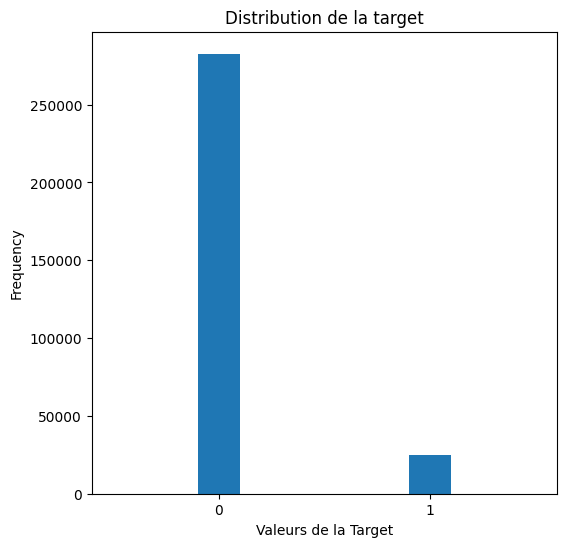

In [16]:
plt.figure(figsize=(6, 6))
df['TARGET'].plot.hist(title="Distribution de la target",
                       bins=[-0.5, -0.1, 0.1, 0.9, 1.1, 1.5])
plt.xticks([0, 1])
plt.xlabel("Valeurs de la Target")
plt.show()

## Valeurs manquantes

In [17]:
# Missing values statistics
missing_values_df = missing_values_table(df)
missing_values_df.head(10)

Your selected dataframe has 122 columns.
There are 68 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_AVG,248360,69.7
COMMONAREA_MEDI,248360,69.7
COMMONAREA_MODE,248360,69.7
NONLIVINGAPARTMENTS_MEDI,246861,69.3
NONLIVINGAPARTMENTS_MODE,246861,69.3
NONLIVINGAPARTMENTS_AVG,246861,69.3
FONDKAPREMONT_MODE,243092,68.2
LIVINGAPARTMENTS_MEDI,242979,68.2
LIVINGAPARTMENTS_AVG,242979,68.2
LIVINGAPARTMENTS_MODE,242979,68.2


In [18]:
del missing_values_df

In [19]:
# Missing values statistics
missing_values_bureau = missing_values_table(bureau)
missing_values_bureau.head(10)

Your selected dataframe has 17 columns.
There are 7 columns that have missing values.


,Missing Values,% of Total Values
AMT_ANNUITY,1226791,71.5
AMT_CREDIT_MAX_OVERDUE,1124488,65.5
DAYS_ENDDATE_FACT,633653,36.9
AMT_CREDIT_SUM_LIMIT,591780,34.5
AMT_CREDIT_SUM_DEBT,257669,15.0
DAYS_CREDIT_ENDDATE,105553,6.1
AMT_CREDIT_SUM,13,0.0


In [20]:
del missing_values_bureau

In [21]:
# Missing values statistics
missing_values_bb = missing_values_table(bb)
missing_values_bb.head(10)

Your selected dataframe has 3 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [22]:
del missing_values_bb

In [23]:
# Missing values statistics
missing_values_prev = missing_values_table(prev)
missing_values_prev.head(10)

Your selected dataframe has 37 columns.
There are 16 columns that have missing values.


,Missing Values,% of Total Values
RATE_INTEREST_PRIMARY,1664263,99.6
RATE_INTEREST_PRIVILEGED,1664263,99.6
AMT_DOWN_PAYMENT,895844,53.6
RATE_DOWN_PAYMENT,895844,53.6
NAME_TYPE_SUITE,820405,49.1
DAYS_FIRST_DRAWING,673065,40.3
DAYS_FIRST_DUE,673065,40.3
DAYS_LAST_DUE_1ST_VERSION,673065,40.3
DAYS_LAST_DUE,673065,40.3
DAYS_TERMINATION,673065,40.3


In [24]:
del missing_values_prev

In [25]:
# Missing values statistics
missing_values_pos = missing_values_table(pos)
missing_values_pos.head(10)

Your selected dataframe has 8 columns.
There are 2 columns that have missing values.


,Missing Values,% of Total Values
CNT_INSTALMENT_FUTURE,26087,0.3
CNT_INSTALMENT,26071,0.3


In [26]:
del missing_values_pos

In [27]:
# Missing values statistics
missing_values_inst = missing_values_table(inst)
missing_values_inst.head(10)

Your selected dataframe has 8 columns.
There are 2 columns that have missing values.


,Missing Values,% of Total Values
DAYS_ENTRY_PAYMENT,2905,0.0
AMT_PAYMENT,2905,0.0


In [28]:
del missing_values_inst

In [29]:
# Missing values statistics
missing_values_cc = missing_values_table(cc)
missing_values_cc.head(10)

Your selected dataframe has 23 columns.
There are 9 columns that have missing values.


,Missing Values,% of Total Values
AMT_PAYMENT_CURRENT,767988,20.0
AMT_DRAWINGS_ATM_CURRENT,749816,19.5
AMT_DRAWINGS_OTHER_CURRENT,749816,19.5
AMT_DRAWINGS_POS_CURRENT,749816,19.5
CNT_DRAWINGS_ATM_CURRENT,749816,19.5
CNT_DRAWINGS_OTHER_CURRENT,749816,19.5
CNT_DRAWINGS_POS_CURRENT,749816,19.5
AMT_INST_MIN_REGULARITY,305236,7.9
CNT_INSTALMENT_MATURE_CUM,305236,7.9


In [30]:
del missing_values_cc

## Types de colonnes

In [31]:
# Number of each type of column
df.dtypes.value_counts()

float64    66
int64      40
object     16
Name: count, dtype: int64

In [32]:
# Number of unique classes in each object column
df.select_dtypes('object').apply(pd.Series.nunique, axis=0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

## Encoding des variables catégorielles

In [33]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in df:
    if df[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(df[col].unique())) <= 2:
            # Train on the training data
            le.fit(df[col])
            # Transform both training and testing data
            df[col] = le.transform(df[col])

            # Keep track of how many columns were label encoded
            le_count += 1

print('%d columns were label encoded.' % le_count)

3 columns were label encoded.


In [34]:
df, cat_cols = one_hot_encoder(df)

In [35]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,WALLSMATERIAL_MODE_nan,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,EMERGENCYSTATE_MODE_nan
0,100002,1.0,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,False,False,False,False,True,False,False,True,False,False
1,100003,0.0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,False,False,False,False,False,False,False,True,False,False
2,100004,0.0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,False,False,False,False,False,False,True,False,False,True
3,100006,0.0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,False,False,False,False,False,False,True,False,False,True
4,100007,0.0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,False,False,False,False,False,False,True,False,False,True


In [36]:
df.shape

(356255, 256)

## Anomalies dans les jours

In [37]:
(df['DAYS_BIRTH'] / -365).describe()

count    356255.000000
mean         43.948627
std          11.941929
min          20.104110
25%          34.041096
50%          43.164384
75%          53.906849
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [38]:
df['DAYS_EMPLOYED'].describe()

count    356255.000000
mean      64317.231413
std      141705.532576
min      -17912.000000
25%       -2781.000000
50%       -1224.000000
75%        -290.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

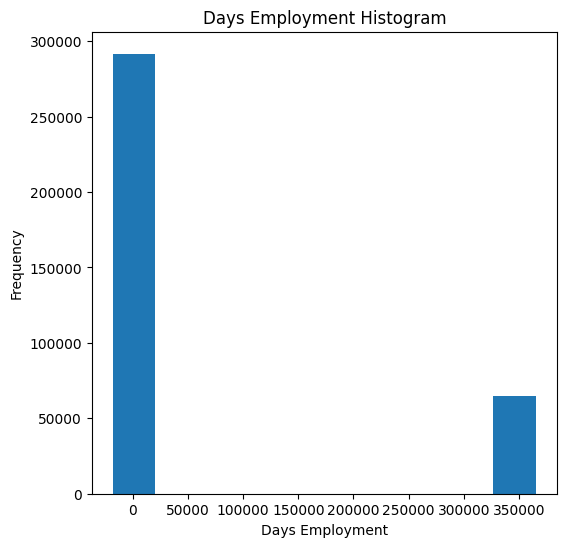

In [39]:
plt.figure(figsize=(6, 6))
df['DAYS_EMPLOYED'].plot.hist(title='Days Employment Histogram')
plt.xlabel('Days Employment')
plt.show()

In [40]:
anom = df[df['DAYS_EMPLOYED'] == 365243]
non_anom = df[df['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' %
      (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' %
      (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 64648 anomalous days of employment


In [41]:
# Create an anomalous flag column
df['DAYS_EMPLOYED_ANOM'] = df["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
df['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace=True)

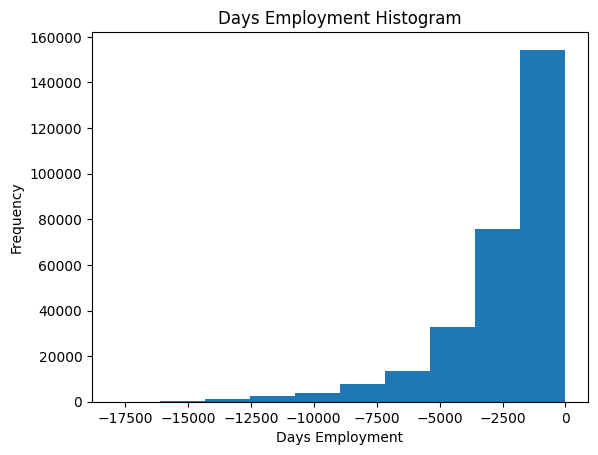

In [42]:
df['DAYS_EMPLOYED'].plot.hist(title='Days Employment Histogram')
plt.xlabel('Days Employment')
plt.show()

## Distribtion des variables numériques

Affichage de la distribution des toutes les variables numériques pour le DataFrame principal. 

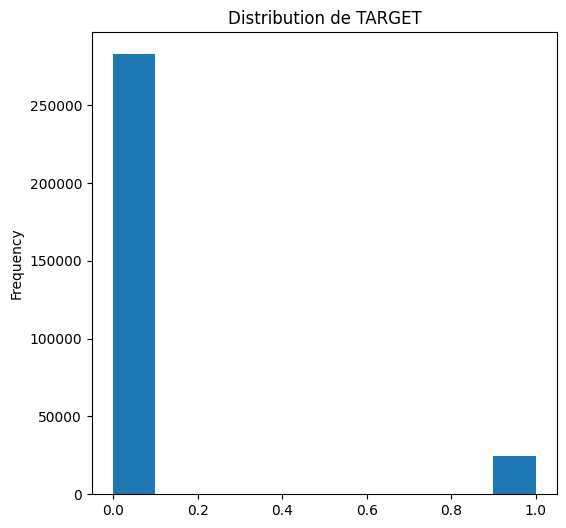

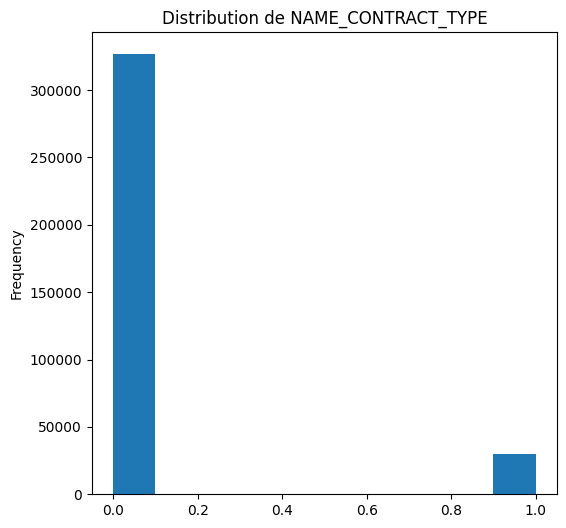

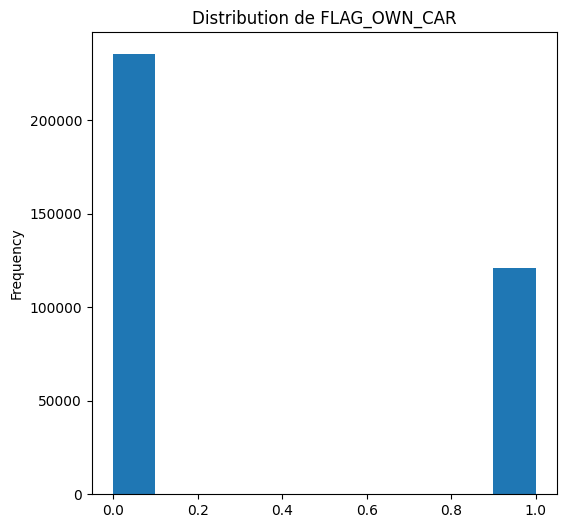

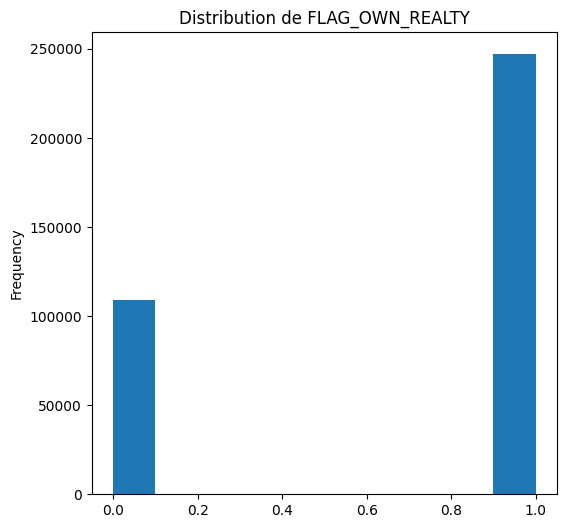

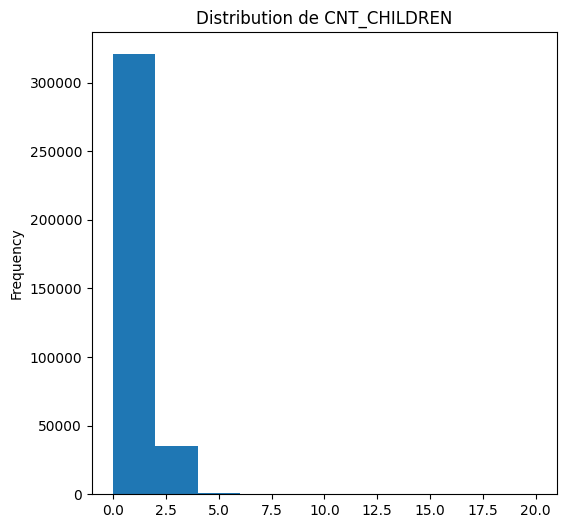

...

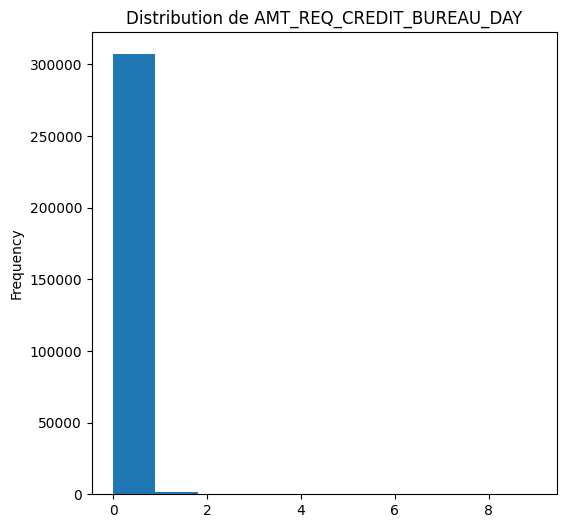

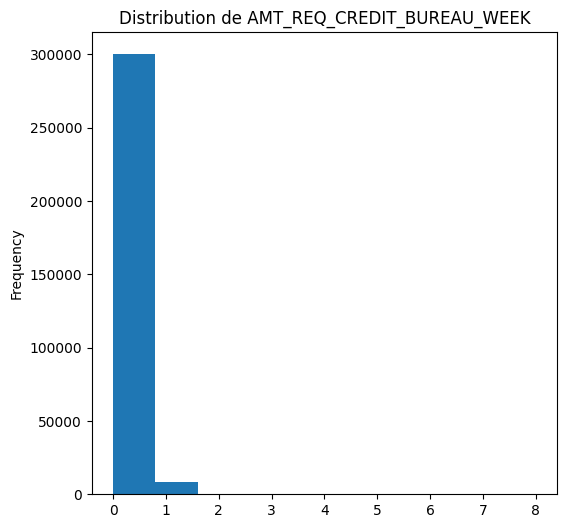

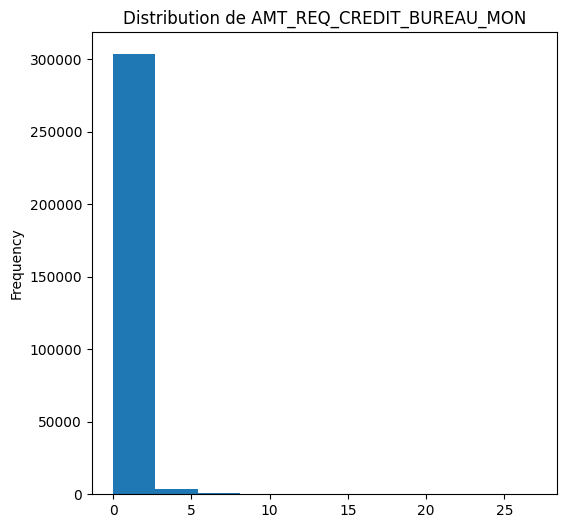

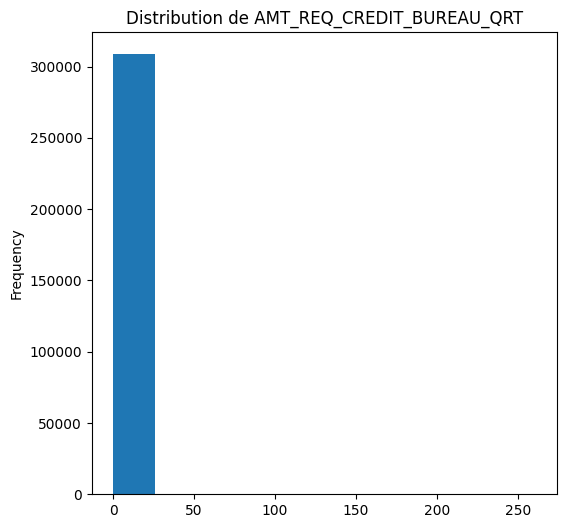

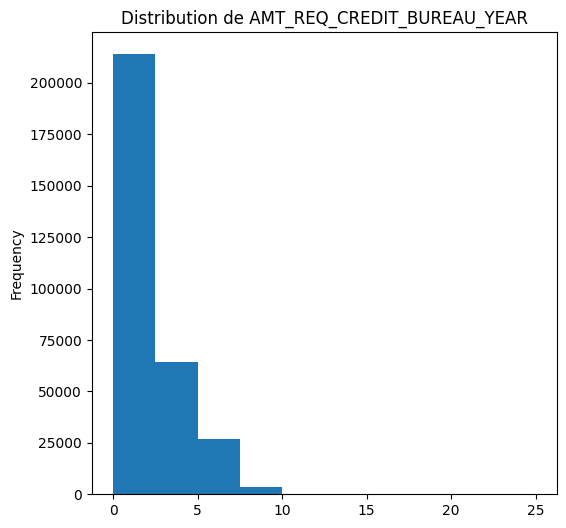

In [43]:
for col in df.select_dtypes(np.number):
    if "ID" not in col:
        plt.figure(figsize=(6, 6))
        df[col].plot.hist(title=f"Distribution de {col}")
        plt.show()

DataFrame : Bureau


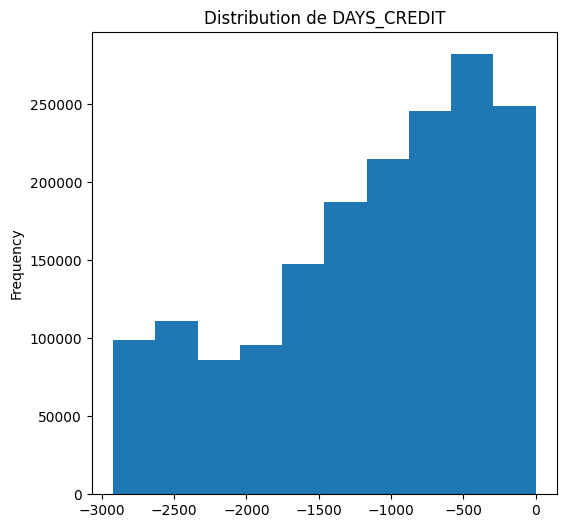

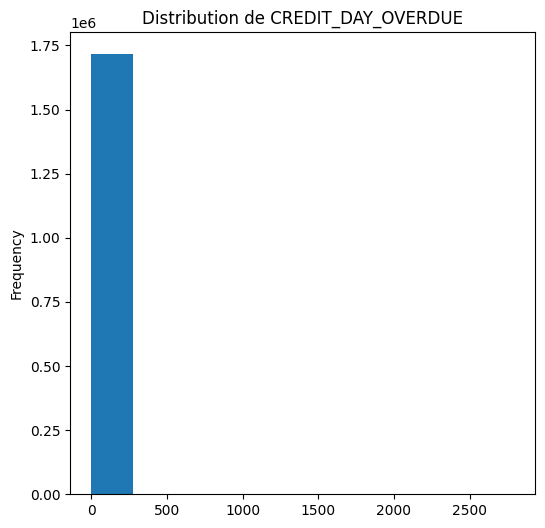

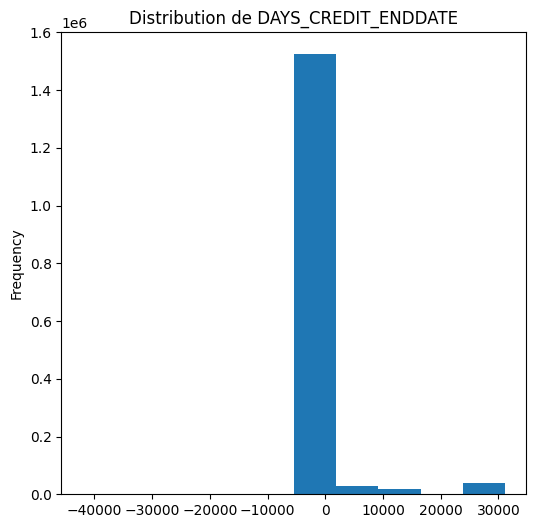

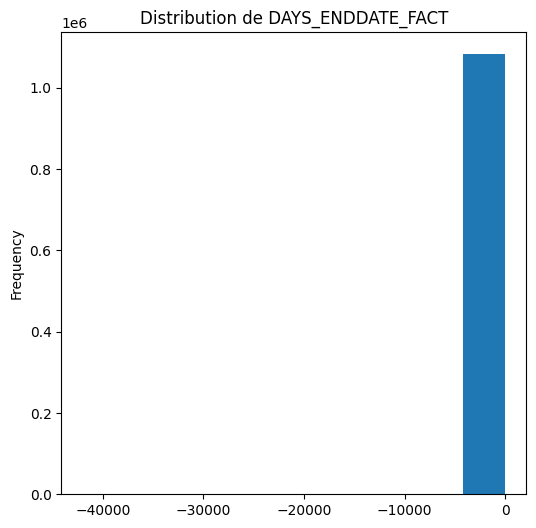

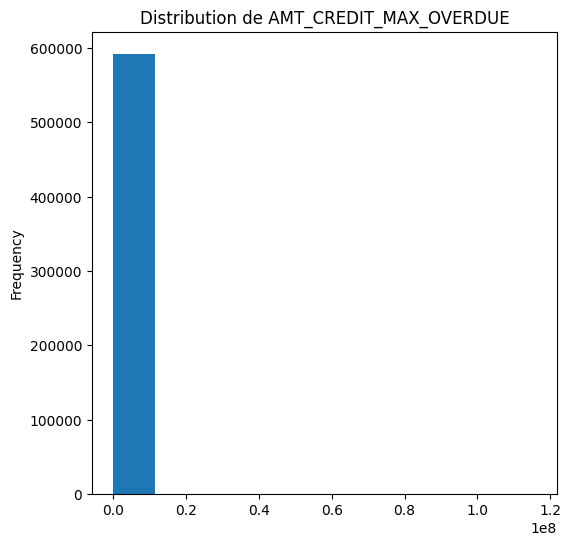

...

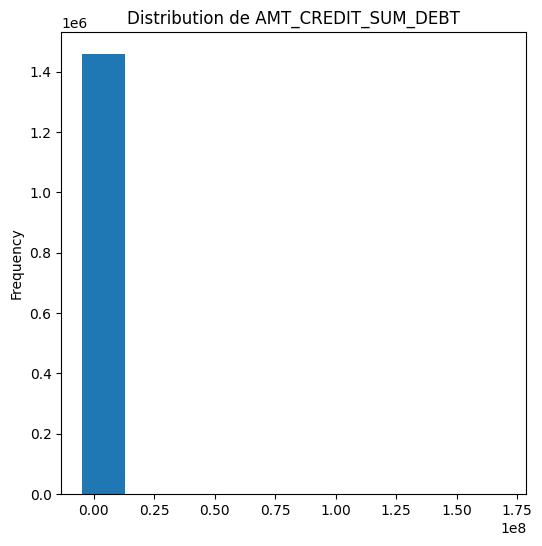

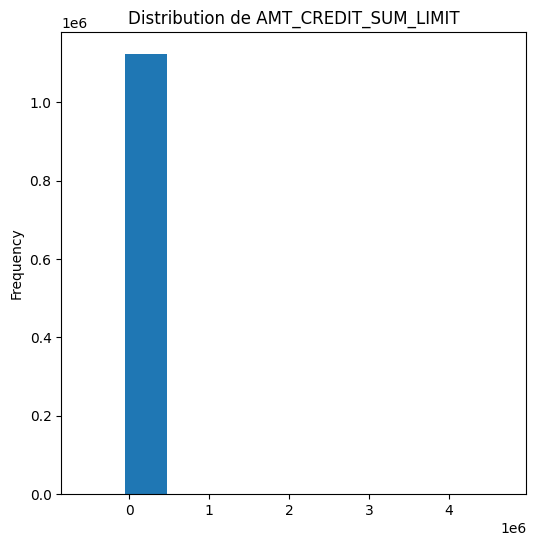

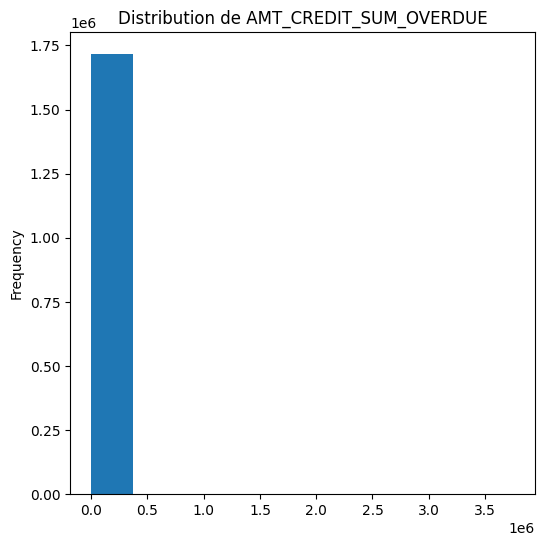

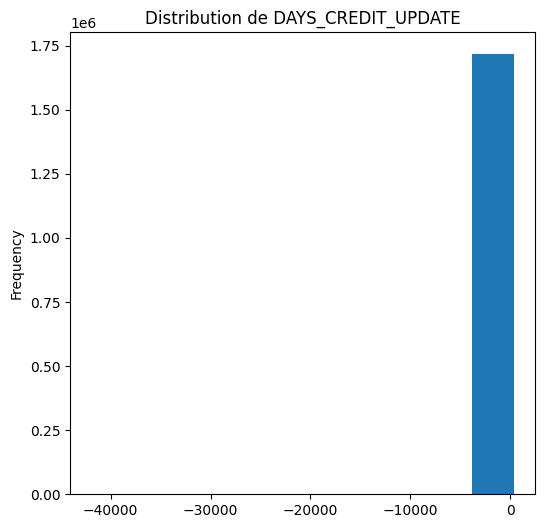

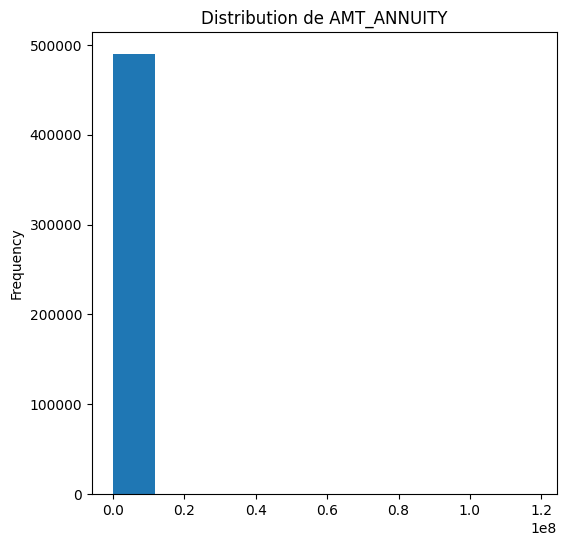

DataFrame : Bureau Balance


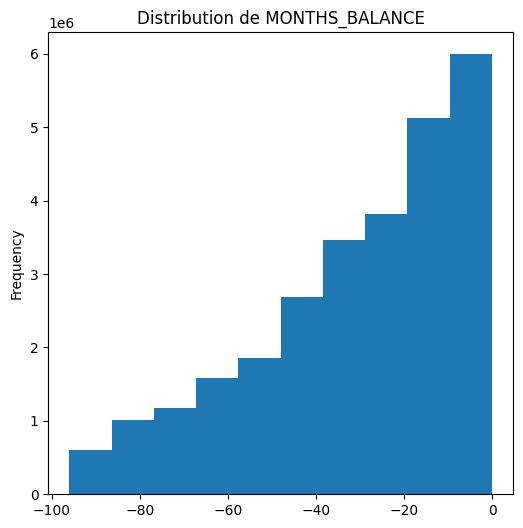

DataFrame : Previous Application


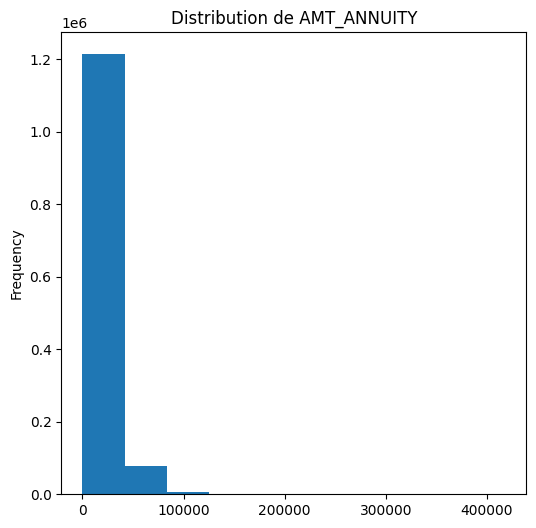

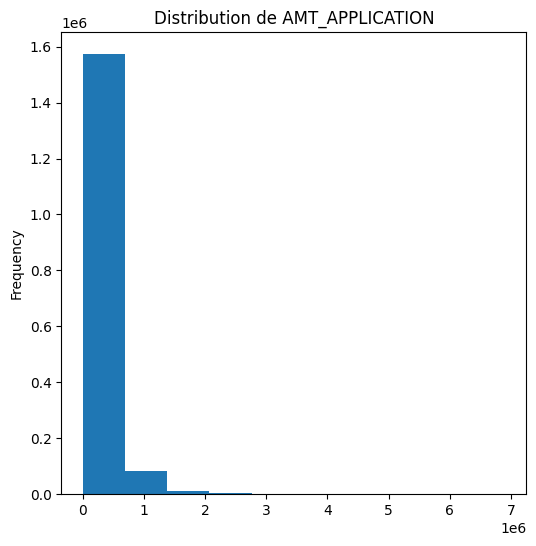

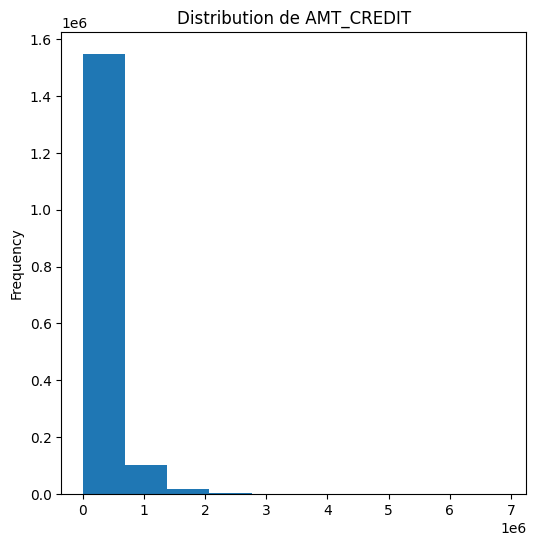

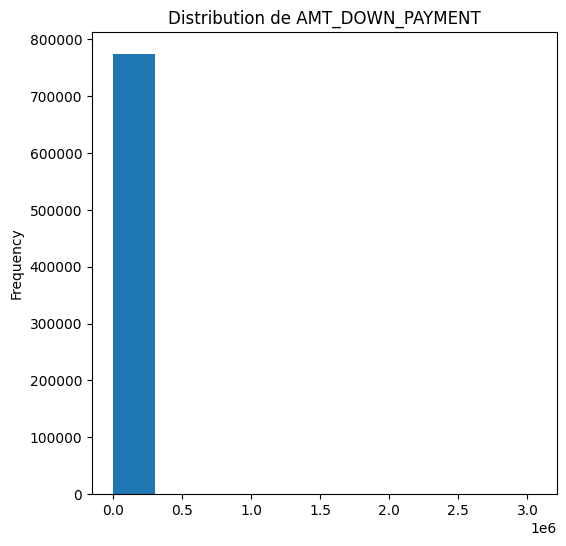

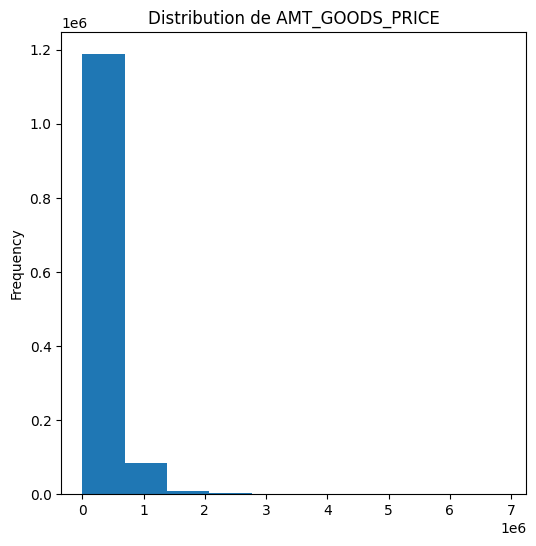

...

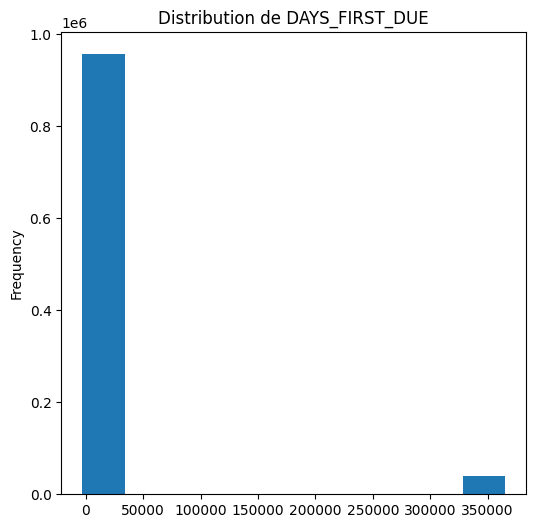

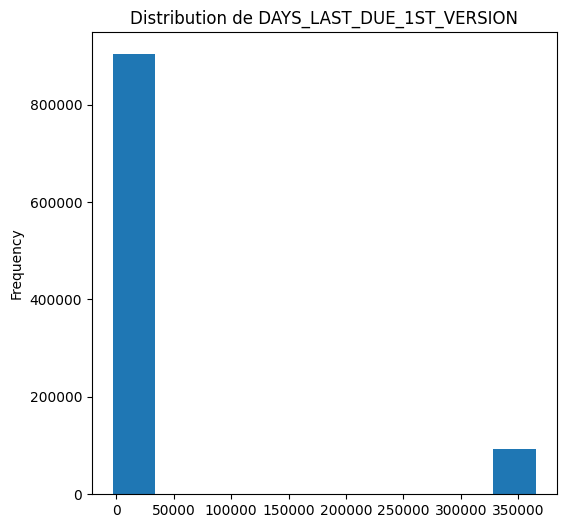

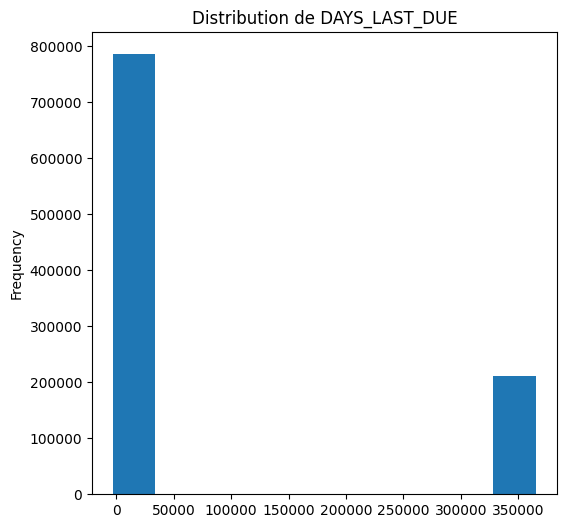

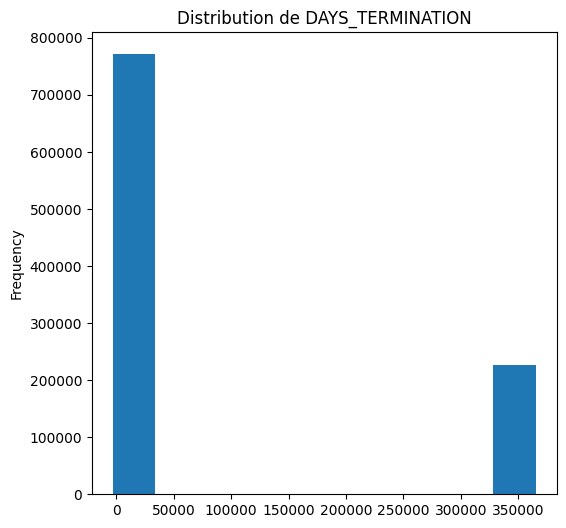

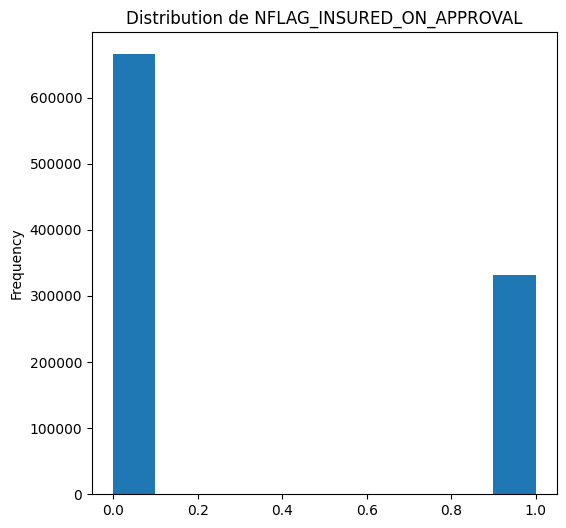

DataFrame : POS_CASH


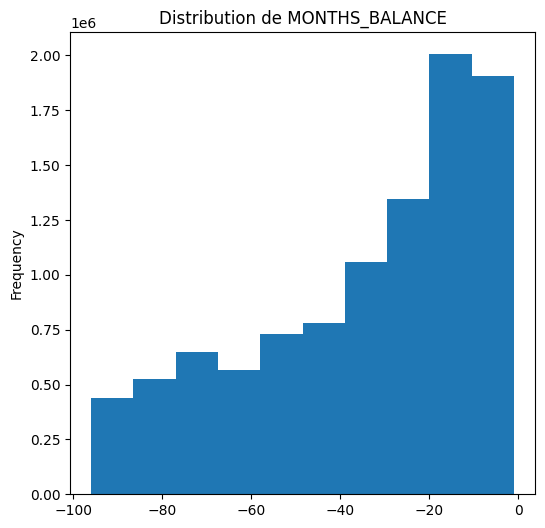

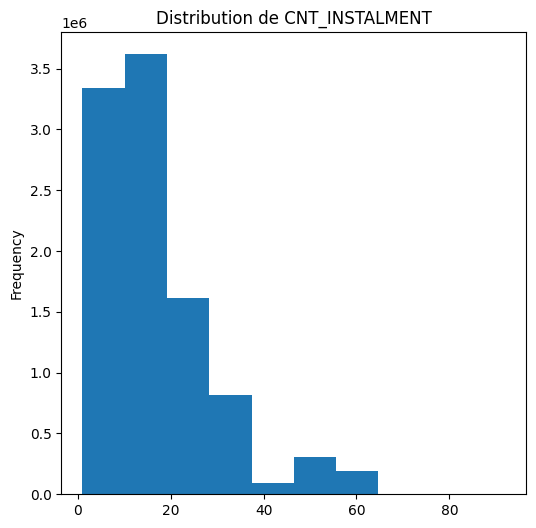

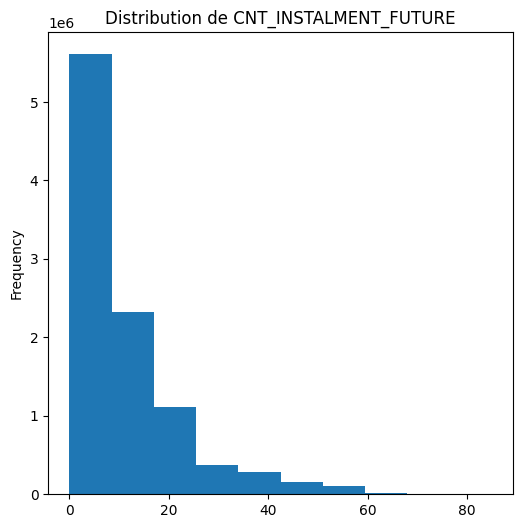

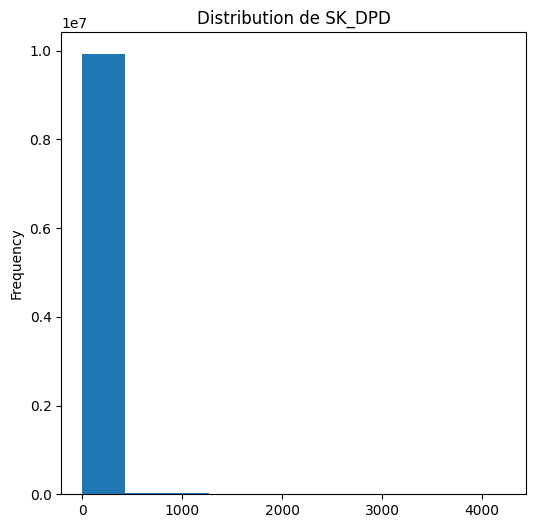

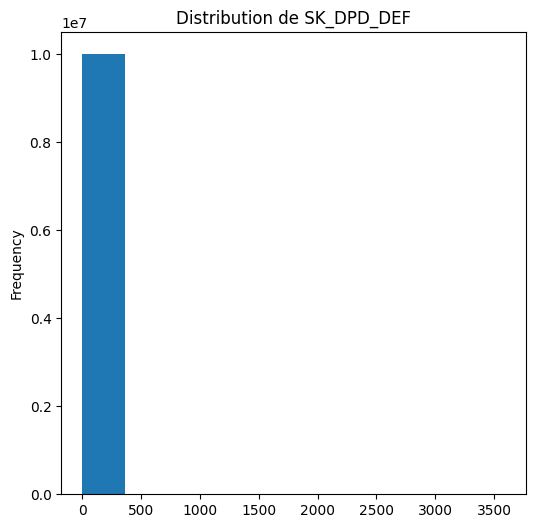

DataFrame : Installments Payments


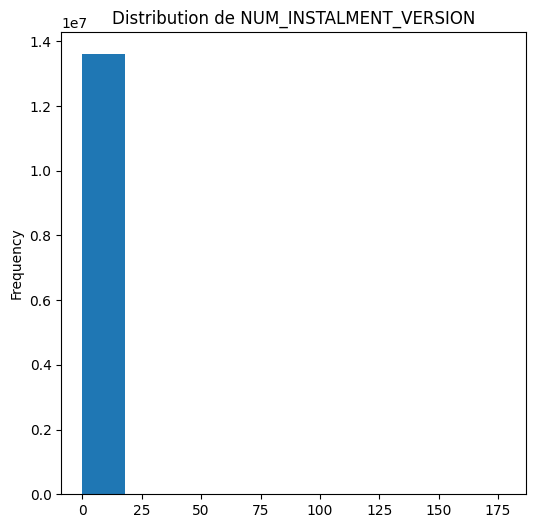

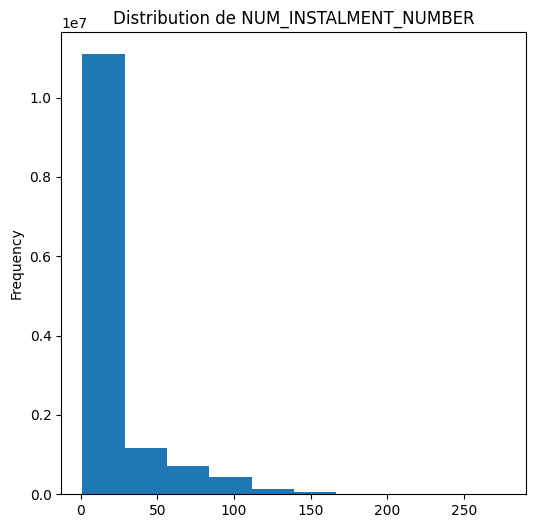

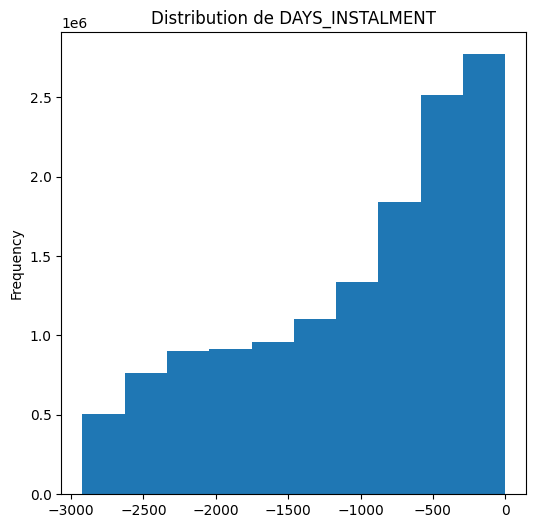

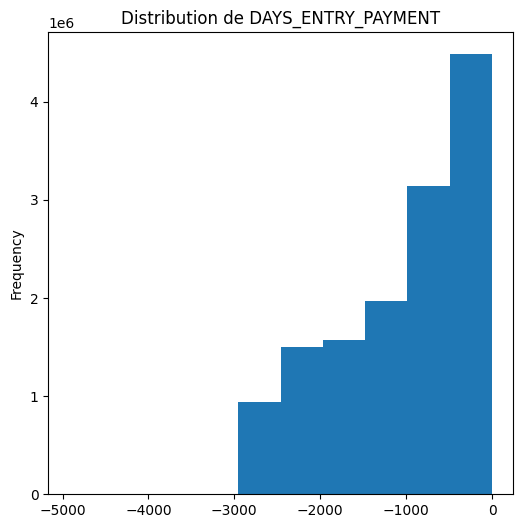

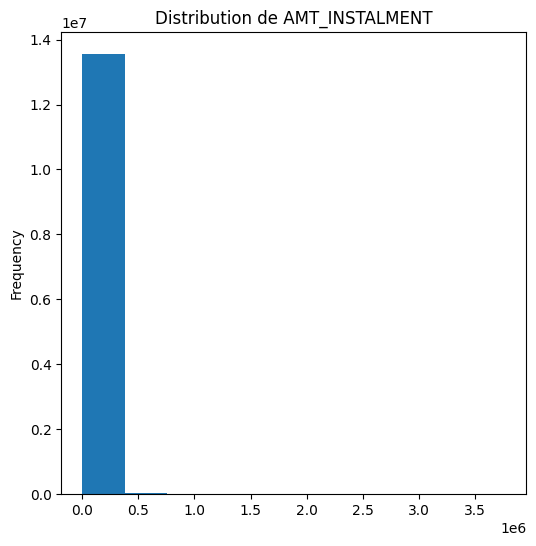

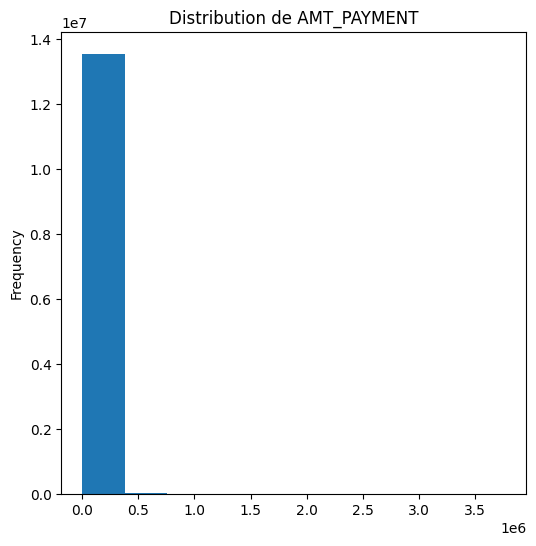

DataFrame : Credit Card Balance


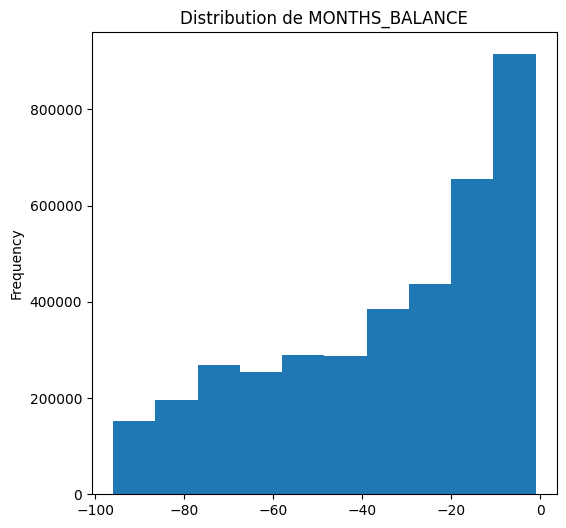

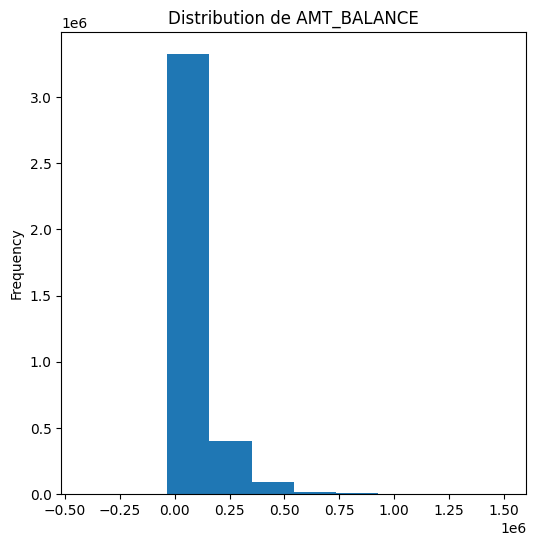

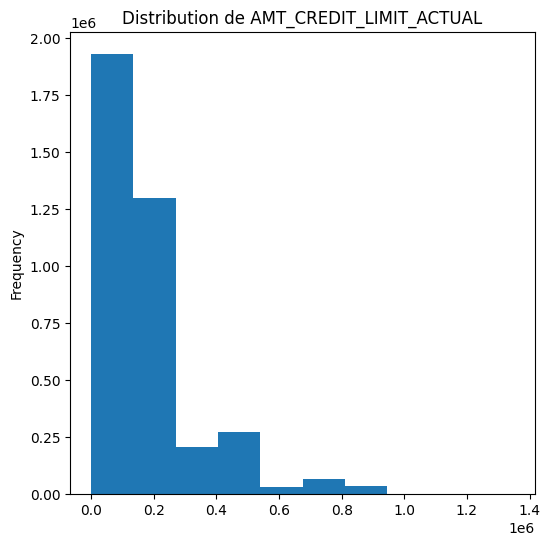

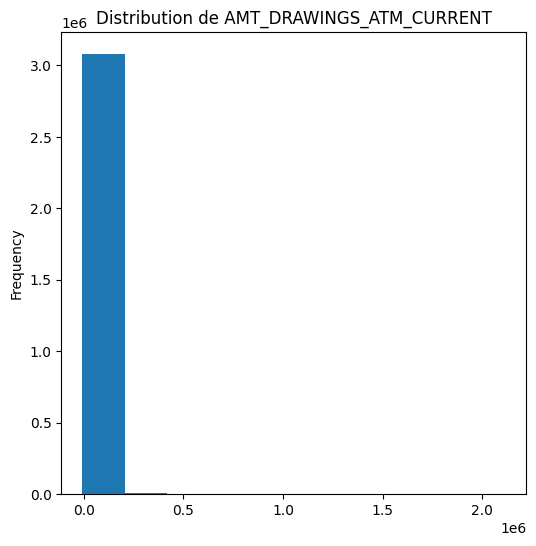

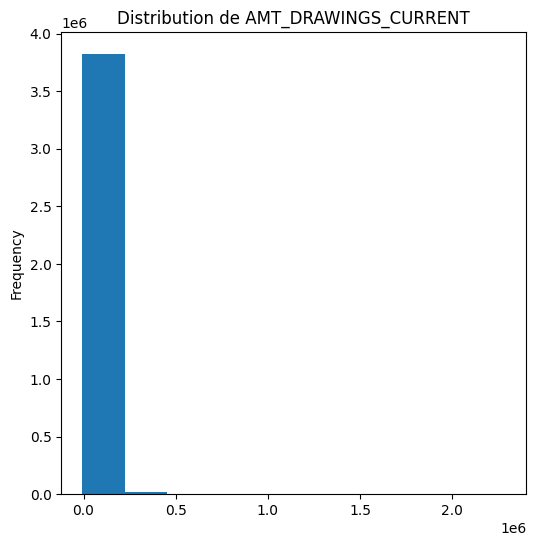

...

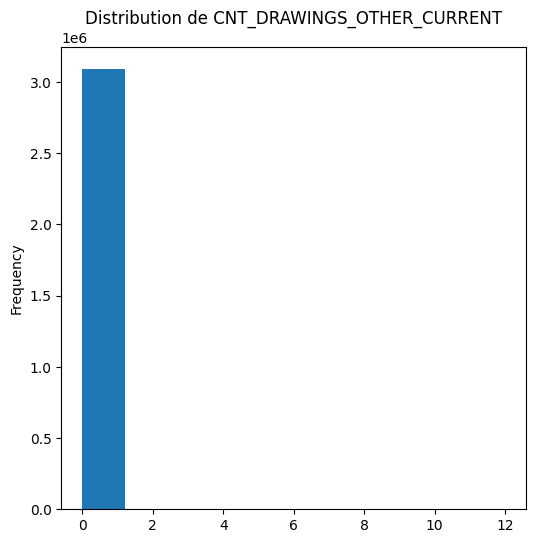

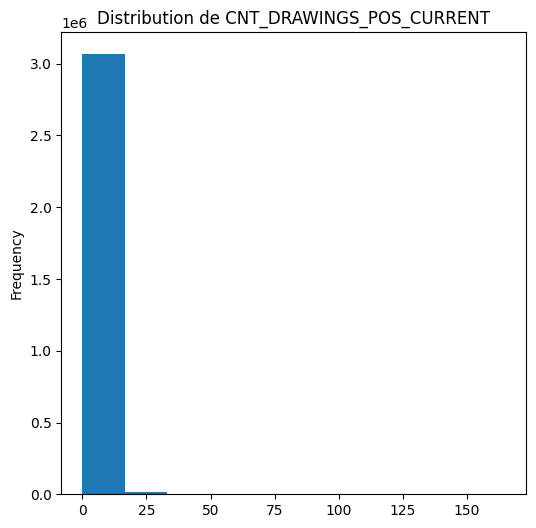

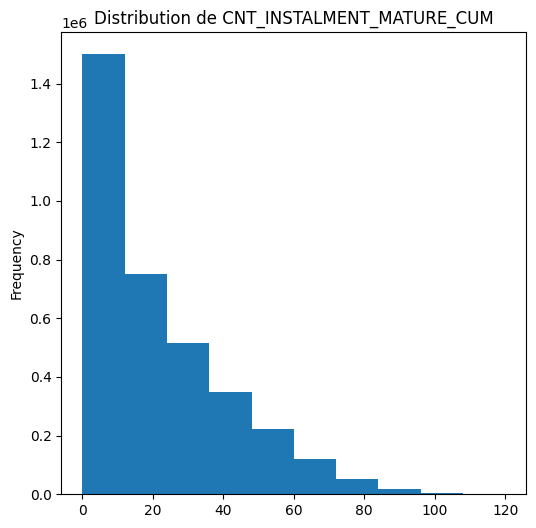

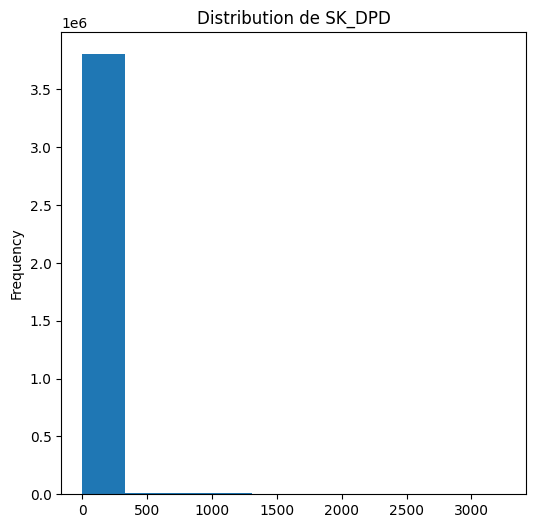

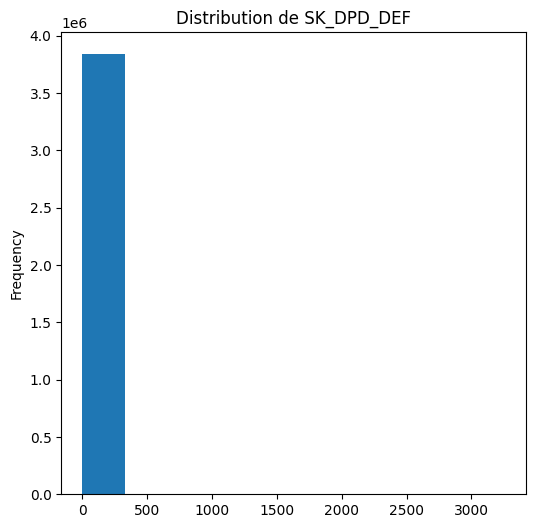

In [44]:
for i, data in enumerate(list_df):
    print(f"DataFrame : {list_noms[i]}")
    for col in data.select_dtypes(np.number):
        if "ID" not in col:
            plt.figure(figsize=(6, 6))
            data[col].plot.hist(title=f"Distribution de {col}")
            plt.show()

## Correlations

In [45]:
# Find correlations with the target and sort
correlations = df.corr()['TARGET'].sort_values().round(3)

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 CODE_GENDER_M                     0.055
DAYS_LAST_PHONE_CHANGE            0.055
NAME_INCOME_TYPE_Working          0.057
REGION_RATING_CLIENT              0.059
REGION_RATING_CLIENT_W_CITY       0.061
DAYS_EMPLOYED                     0.075
DAYS_BIRTH                        0.078
TARGET                            1.000
CODE_GENDER_nan                     NaN
NAME_INCOME_TYPE_nan                NaN
NAME_EDUCATION_TYPE_nan             NaN
NAME_FAMILY_STATUS_nan              NaN
NAME_HOUSING_TYPE_nan               NaN
WEEKDAY_APPR_PROCESS_START_nan      NaN
ORGANIZATION_TYPE_nan               NaN
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                           -0.179
EXT_SOURCE_2                           -0.160
EXT_SOURCE_1                           -0.155
NAME_EDUCATION_TYPE_Higher education   -0.057
CODE_GENDER_F                          -0.055
NAME_INCOME_TYPE_Pensioner             -0.046
DAYS_EMPLOYED_ANOM                  

### Effets de l'âge sur le remboursment

In [46]:
# Find the correlation of the positive days since birth and target
df['DAYS_BIRTH'] = abs(df['DAYS_BIRTH'])
df['DAYS_BIRTH'].corr(df['TARGET'])

-0.07823930830982709

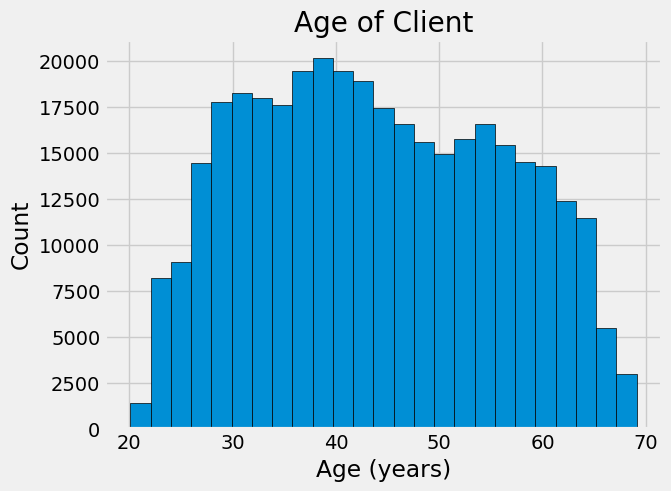

In [47]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(df['DAYS_BIRTH'] / 365, edgecolor='k', bins=25)
plt.title('Age of Client')
plt.xlabel('Age (years)')
plt.ylabel('Count')
plt.show()

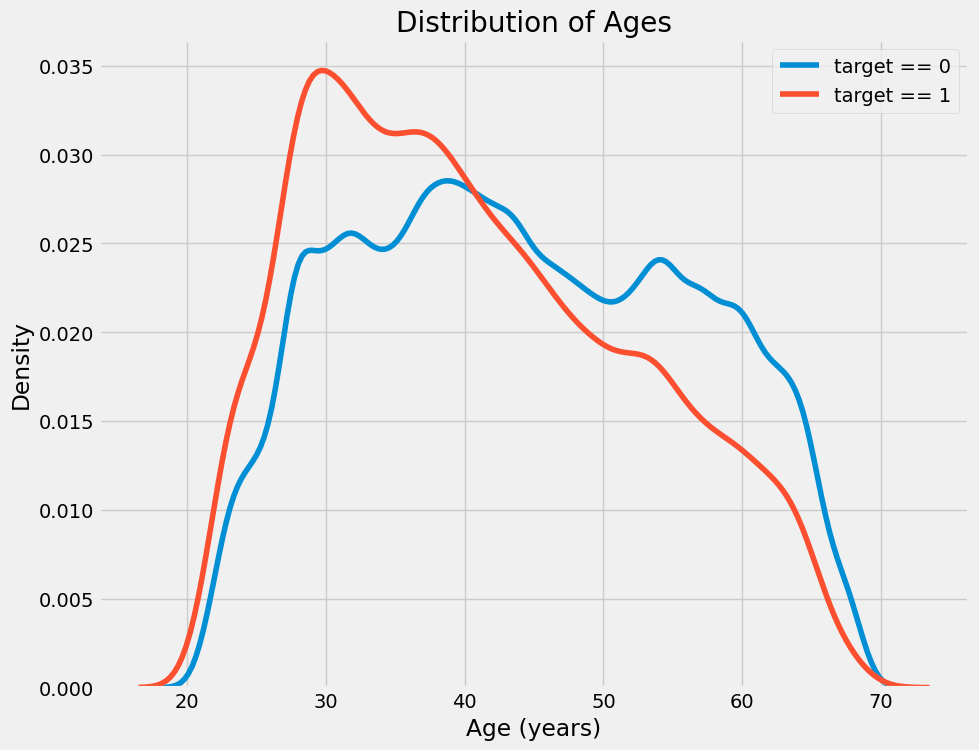

In [48]:
plt.figure(figsize=(10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 0,
            'DAYS_BIRTH'] / 365, label='target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 1,
            'DAYS_BIRTH'] / 365, label='target == 1')

# Labeling of plot
plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.title('Distribution of Ages')
plt.legend()
plt.show()

### Sources Externes

In [49]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = df[[
    'TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'
]]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.212987,0.181390,0.586844
EXT_SOURCE_2,-0.160472,0.212987,1.000000,0.108480,0.095338
EXT_SOURCE_3,-0.178919,0.181390,0.108480,1.000000,0.201932
DAYS_BIRTH,-0.078239,0.586844,0.095338,0.201932,1.000000


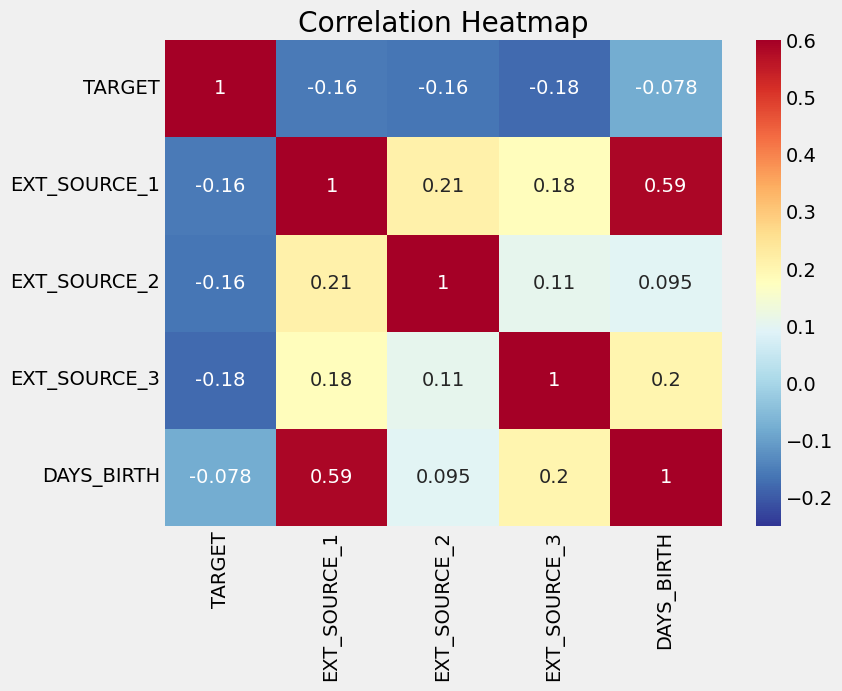

In [50]:
plt.figure(figsize=(8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs,
            cmap=plt.cm.RdYlBu_r,
            vmin=-0.25,
            annot=True,
            vmax=0.6)
plt.title('Correlation Heatmap')
plt.show()

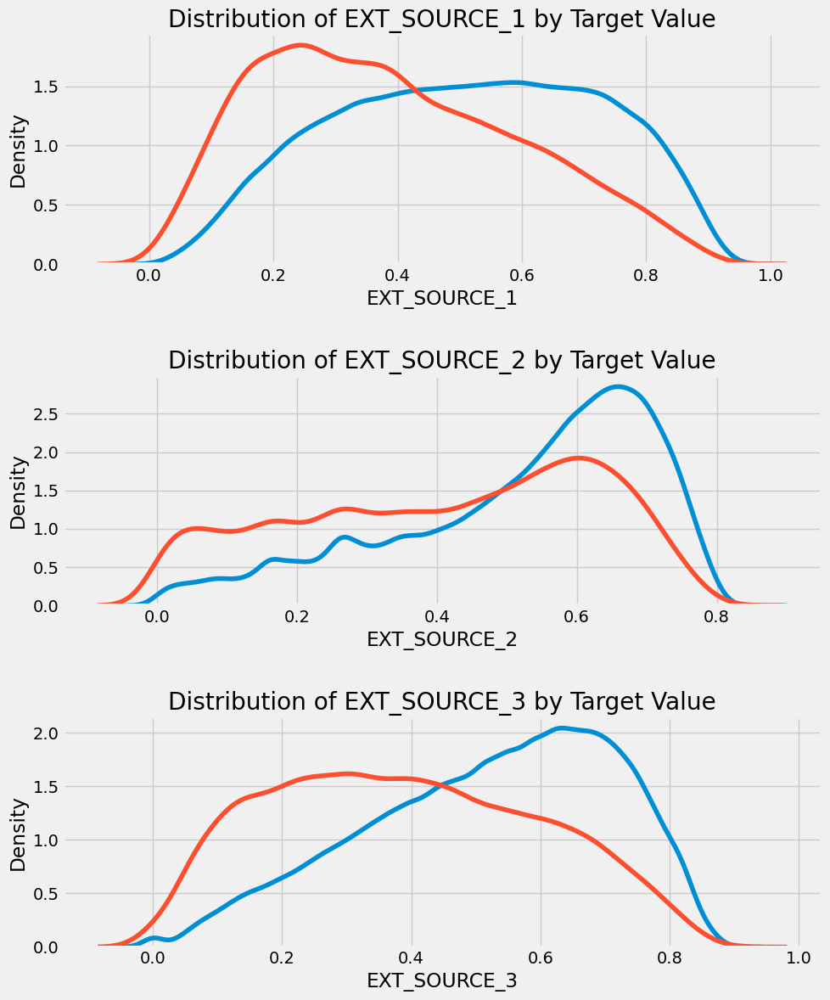

In [51]:
plt.figure(figsize=(10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):

    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(df.loc[df['TARGET'] == 0, source], label='target == 0')
    # plot loans that were not repaid
    sns.kdeplot(df.loc[df['TARGET'] == 1, source], label='target == 1')

    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source)
    plt.ylabel('Density')

plt.tight_layout(h_pad=2.5)
plt.show()

## Sauvegarde du Fichier

In [52]:
df.drop(columns=["SK_ID_CURR"]).to_csv("../Data/base_data.csv", index=False)

# Feature Engineering
## Features simples à créer

Features de pourcentage créées à partir de deux autres colonnes

In [53]:
# Some simple new features (percentages)
df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']

## Features Polynomiales

Les features polynomiales sont calculées à partir des colonnes les plus corrélées à la Target pour essayer de créer de nouvelles corrélations.

In [54]:
# Make a new dataframe for polynomial features
poly_features = df[[
    'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET'
]]

# imputer for handling missing values
imputer = SimpleImputer(strategy='median')

poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns=['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)

from sklearn.preprocessing import PolynomialFeatures

# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree=3)

In [55]:
# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
print('Polynomial Features shape: ', poly_features.shape)

Polynomial Features shape:  (356255, 35)


In [56]:
poly_transformer.get_feature_names_out(input_features=[
    'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'
])[:15]

array(['1', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH',
       'EXT_SOURCE_1^2', 'EXT_SOURCE_1 EXT_SOURCE_2',
       'EXT_SOURCE_1 EXT_SOURCE_3', 'EXT_SOURCE_1 DAYS_BIRTH',
       'EXT_SOURCE_2^2', 'EXT_SOURCE_2 EXT_SOURCE_3',
       'EXT_SOURCE_2 DAYS_BIRTH', 'EXT_SOURCE_3^2',
       'EXT_SOURCE_3 DAYS_BIRTH', 'DAYS_BIRTH^2'], dtype=object)

In [57]:
# Create a dataframe of the features
poly_features = pd.DataFrame(poly_features,
                             columns=poly_transformer.get_feature_names_out([
                                 'EXT_SOURCE_1', 'EXT_SOURCE_2',
                                 'EXT_SOURCE_3', 'DAYS_BIRTH'
                             ]))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(5))

EXT_SOURCE_2 EXT_SOURCE_3                -0.193969
EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3   -0.189622
EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH     -0.181299
EXT_SOURCE_2^2 EXT_SOURCE_3              -0.176446
EXT_SOURCE_2 EXT_SOURCE_3^2              -0.172255
EXT_SOURCE_1 EXT_SOURCE_2                -0.166629
EXT_SOURCE_1 EXT_SOURCE_3                -0.164134
EXT_SOURCE_2                             -0.160295
EXT_SOURCE_2 DAYS_BIRTH                  -0.156873
EXT_SOURCE_1 EXT_SOURCE_2^2              -0.156869
Name: TARGET, dtype: float64
DAYS_BIRTH     -0.078239
DAYS_BIRTH^2   -0.076672
DAYS_BIRTH^3   -0.074273
TARGET          1.000000
1                    NaN
Name: TARGET, dtype: float64


### Fusion avec le DataFrame

In [58]:
# Merge polynomial features into training dataframe
poly_features['SK_ID_CURR'] = df['SK_ID_CURR']

# suppression de la colonne Target en double
poly_features.drop(columns="TARGET", inplace=True)

In [59]:
df_poly = df.merge(poly_features, on='SK_ID_CURR', how='left')

# Print out the new shapes
print('Training data with polynomial features shape: ', df_poly.shape)

Training data with polynomial features shape:  (356255, 297)


In [60]:
df_poly.drop(columns=["SK_ID_CURR"]).to_csv("../Data/poly_data.csv", index=False)

## Regroupement des données des autres DataFrames

Comme on veut distinguer les clients, il faut regrouper les données par ID client sur chacun des autres dataframes pour pouvoir les fusionner par la suite avec notre DataFrame principal.

On va procéder de la même façon pour chacun des DataFrame:
 - Regroupement des colonnes
 - Encodage des données catégorielles 

In [61]:
list_df_agg = []

### Bureau et Bureau_Balance

In [62]:
# Déclatation des opérations d'aggrégation à effectuer
bb_aggregations = {
    "MONTHS_BALANCE": "max",
    "STATUS": lambda x: x.mode().iloc[0] if not x.mode().empty else None
}

# Regroupement des données
bb_agg = bb.groupby("SK_ID_BUREAU").agg(bb_aggregations)

In [63]:
# Fusion des balances dans le DataFrame Bureau
bureau = bureau.join(bb_agg, on="SK_ID_BUREAU", how="left")
bureau.drop(columns="SK_ID_BUREAU", inplace=True)

In [64]:
# Déclaration des aggrégations
bureau_aggregations = aggregations_declaration(bureau)

In [65]:
# Regroupement par ID
bureau_agg = bureau.groupby("SK_ID_CURR").agg(bureau_aggregations)

# On remet les noms de colonnes d'origine
bureau_agg.columns = bureau.drop(columns="SK_ID_CURR").columns

In [66]:
del bb, bb_agg, bureau

In [67]:
bureau_agg, cat_bureau = one_hot_encoder(bureau_agg)

In [68]:
# Number of each type of column
bureau_agg.dtypes.value_counts()

bool       30
float64    13
Name: count, dtype: int64

In [69]:
list_df_agg.append(bureau_agg)

### Previous application

Remplacement des valeurs abbérantes par des valeurs nulles

In [70]:
prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace=True)
prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace=True)
prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace=True)
prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace=True)

In [71]:
# Calcul du pourcentage entre le montant demandé et le montant reçu
prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']

In [72]:
# Déclaration des aggrégations
prev_aggregations = aggregations_declaration(prev)

In [73]:
# Regroupement par ID
prev_agg = prev.groupby("SK_ID_CURR").agg(prev_aggregations)

# On garde les noms de colonnes
prev_agg.columns = prev.drop(columns=["SK_ID_PREV", "SK_ID_CURR"]).columns

In [74]:
del prev

In [75]:
prev_agg, cat_prev = one_hot_encoder(prev_agg)

In [76]:
# Number of each type of column
prev_agg.dtypes.value_counts()

bool       157
float64     20
Name: count, dtype: int64

In [77]:
list_df_agg.append(prev_agg)

### POS_CASH

In [78]:
# Déclaration des aggrégations
pos_aggregations = aggregations_declaration(pos)

In [79]:
# Regroupement par ID
pos_agg = pos.groupby("SK_ID_CURR").agg(pos_aggregations)

# On garde les noms de colonnes
pos_agg.columns = pos.drop(columns=["SK_ID_PREV", "SK_ID_CURR"]).columns

In [80]:
del pos

In [81]:
pos_agg, cat_pos = one_hot_encoder(pos_agg)

In [82]:
# Number of each type of column
pos_agg.dtypes.value_counts()

bool       8
float64    5
Name: count, dtype: int64

In [83]:
list_df_agg.append(pos_agg)

### Installments Payments

Calcul du pourcentage et de la différence payé pour chaque virement.

Calcul des jours restants et des jours de dépassement. En gardant uniquement ceux qui sont positifs

In [84]:
# Percentage and difference paid in each installment (amount paid and installment value)
inst['PAYMENT_PERC'] = inst['AMT_PAYMENT'] / inst['AMT_INSTALMENT']
inst['PAYMENT_DIFF'] = inst['AMT_INSTALMENT'] - inst['AMT_PAYMENT']
# Days past due and days before due (no negative values)
inst['DPD'] = inst['DAYS_ENTRY_PAYMENT'] - inst['DAYS_INSTALMENT']
inst['DBD'] = inst['DAYS_INSTALMENT'] - inst['DAYS_ENTRY_PAYMENT']
inst['DPD'] = inst['DPD'].apply(lambda x: x if x > 0 else 0)
inst['DBD'] = inst['DBD'].apply(lambda x: x if x > 0 else 0)

In [85]:
# Déclaration des aggrégations
inst_aggregations = aggregations_declaration(inst)

In [86]:
# Regroupement par ID
inst_agg = inst.groupby("SK_ID_CURR").agg(inst_aggregations)

# On garde les noms de colonnes
inst_agg.columns = inst.drop(columns=["SK_ID_PREV", "SK_ID_CURR"]).columns

In [87]:
del inst

In [88]:
inst_agg, cat_inst = one_hot_encoder(inst_agg)

In [89]:
# Number of each type of column
inst_agg.dtypes.value_counts()

float64    10
Name: count, dtype: int64

In [90]:
list_df_agg.append(inst_agg)

### Credit Card Balance

In [91]:
cc.drop(['SK_ID_PREV'], axis=1, inplace=True)

In [92]:
cc_aggregations = aggregations_declaration(cc)

In [93]:
cc_agg = cc.groupby("SK_ID_CURR").agg(cc_aggregations)
cc_agg.columns = cc.drop(columns="SK_ID_CURR").columns

In [94]:
# Count credit card lines
cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()

In [95]:
cc_agg, cc_cat = one_hot_encoder(cc_agg)

In [96]:
# Number of each type of column
cc_agg.dtypes.value_counts()

float64    20
bool        5
int64       1
Name: count, dtype: int64

In [97]:
list_df_agg.append(cc_agg)

## Fusion des données

In [98]:
df_complete = df_poly.copy()

for i, data in enumerate(list_df_agg):
    suffix = f"_{list_noms[i]}"

    df_complete = df_complete.join(data, on="SK_ID_CURR", how="left", rsuffix=suffix)

    list_cols = []
    for col in df_complete.columns:
        if suffix in col:
            list_cols.append(col)
    df_complete.drop(columns=list_cols, inplace=True)

    for col in df_complete.select_dtypes("object"):
        df_complete[col] = df_complete[col].astype(bool)

In [99]:
print("Dimensions des données :", df_complete.shape)
df_complete.head()

Dimensions des données : (356255, 534)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,CC_COUNT
0,100002,1.0,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0.0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0.0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0.0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,0.0,0.0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,6.0
4,100007,0.0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [100]:
# Number of each type of column
df_complete.dtypes.value_counts()

bool       325
float64    167
int64       39
int32        3
Name: count, dtype: int64

In [101]:
del bureau_agg, prev_agg, pos_agg, inst_agg, cc_agg

## Sauvegarde des données

In [102]:
df_complete.drop(columns=["SK_ID_CURR"]).to_csv("../Data/complete_data.csv", index=False)

### Sauvegarde d'un sample pour l'API

In [103]:
test_complete = df_complete[df_complete["TARGET"].isnull()].reset_index(drop=True)
sample_df = test_complete.drop(columns="TARGET").sample(20)

sample_df.to_csv("../Data/sample_data.csv", index=False)

In [104]:
del df_poly, df_complete, sample_df, test_complete

# Baseline (Regression Logistique)
## Préparation des données
### Récupération des données

In [105]:
df = pd.read_csv("../Data/base_data.csv", index_col=False)

df.replace([np.inf, -np.inf], np.nan, inplace=True)

train = df[df["TARGET"].notnull()].reset_index(drop=True)

print(f"Train shape : {train.shape}")

Train shape : (307511, 256)


In [106]:
train_cols = list(train.columns)

In [107]:
del df

### Imputation des données

In [108]:
imputer = SimpleImputer(strategy="median")

imputer.fit(train)

SimpleImputer(strategy='median')

In [109]:
train_imputed = imputer.transform(train)

### Scaling des données

In [110]:
scaler_log = MinMaxScaler()

In [111]:
scaler_log.fit(train_imputed)

MinMaxScaler()

In [112]:
train_scaled = scaler_log.transform(train_imputed)

In [113]:
train_scaled = pd.DataFrame(train_scaled, columns=train_cols)

### Séparation en Train, et Val

In [114]:
X_log = train_scaled.drop(columns="TARGET")
y_log = train_scaled["TARGET"]

In [115]:
X_train_log, X_val_log, y_train_log, y_val_log = train_test_split(
    X_log, y_log, stratify=y_log, test_size=0.3, random_state=42)

## MLFlow
### Création du projet

In [116]:
client = MlflowClient(tracking_uri="http://127.0.0.1:8080")

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk Logistic Regression. "
    "This project contains the model of LogisticRegressionCV from Scikit-Learn."
)

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 Log",
    "model": "Logistic Regression",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(name="Projet 7 Log",
                                          tags=experiment_tags)

### Connexion

In [118]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [119]:
mlflow.set_experiment("Projet 7 Log")

<Experiment: artifact_location='mlflow-artifacts:/690606457032506146', creation_time=1703840816316, experiment_id='690606457032506146', last_update_time=1703840816316, lifecycle_stage='active', name='Projet 7 Log', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk Logistic '
                        'Regression. This project contains the model of '
                        'LogisticRegressionCV from Scikit-Learn.',
 'model': 'Logistic Regression',
 'project_name': 'Projet 7 Log'}>

## Création du modèle

In [120]:
params_log = {
    "solver": "lbfgs",
    "max_iter": 1000,
    "class_weight": "balanced",
    "random_state": 42
}

In [121]:
n_fold = 4
skf = StratifiedKFold(n_splits=n_fold, random_state=42, shuffle=True)

log = LogisticRegression(**params_log)

In [122]:
beta = 2

## Entrainement du modèle

In [123]:
dict_scores_log = {}
list_confu_log = []

for i, (train_idx, test_idx) in enumerate(skf.split(X_train_log, y_train_log)):

    # train set et test set
    X_train = X_train_log.iloc[train_idx]
    y_train = y_train_log.iloc[train_idx]

    X_val = X_train_log.iloc[test_idx]
    y_val = y_train_log.iloc[test_idx]

    # Initialise dict
    dict_scores_log[i] = []

    # Training with timer
    start = time.time()
    log.fit(X_train, y_train)
    duration = time.time() - start

    # Getting the predictions
    y_pred = log.predict(X_val)

    # Scores calculation
    precision = precision_score(y_val, y_pred).round(3)
    f1 = f1_score(y_val, y_pred).round(3)
    recall = recall_score(y_val, y_pred).round(3)
    roc = roc_auc_score(y_val, y_pred).round(3)
    beta = fbeta_score(y_val, y_pred, beta=beta, pos_label=1,
                       average='binary').round(3)
    custom = score_custom(y_val, y_pred)

    # adding to dict
    dict_scores_log[i].append([duration, precision, f1, recall, roc, beta, custom])

    # Confusion matrix calculation
    confusion_mat = confusion_matrix(y_val, y_pred)
    list_confu_log.append(confusion_mat)

    # Creation of the confusion matrix figure
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.savefig("img_tmp/confusion_matrix.png")  # Sauvegarde temporaire de l'image
    plt.close()

    # starting save with MLflow
    with mlflow.start_run(run_name=f"Fold_{i}") as run:
        # Log the hyperparameters
        mlflow.log_params(params_log)

        # Log the metrics
        mlflow.log_metric("precision", precision)
        mlflow.log_metric("f1", f1)
        mlflow.log_metric("recall", recall)
        mlflow.log_metric("roc", roc)
        mlflow.log_metric("beta", beta)
        mlflow.log_metric("custom", custom)
        mlflow.log_metric("duration", duration)

        # Log the confusion matrix
        mlflow.log_artifact("img_tmp/confusion_matrix.png",
                            artifact_path="Projet7/CF/Log")

        # Set a tag that we can use to remind ourselves what this run was for
        mlflow.set_tag("Training Info",
                       "Basic LR model for Home Credit Default Risk")

        # Infer the model signature
        signature = infer_signature(X_train, log.predict(X_train))

        # Log the model
        model_info = mlflow.sklearn.log_model(
            sk_model=log,
            artifact_path="Projet7/Models/Log",
            signature=signature,
            input_example=X_train,
            registered_model_name="Projet 7 Log")

Registered model 'Projet 7 Log' already exists. Creating a new version of this model...
2024/01/15 10:44:00 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 Log, version 25
Created version '25' of model 'Projet 7 Log'.
Registered model 'Projet 7 Log' already exists. Creating a new version of this model...
2024/01/15 10:45:36 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 Log, version 26
Created version '26' of model 'Projet 7 Log'.
Registered model 'Projet 7 Log' already exists. Creating a new version of this model...
2024/01/15 10:47:05 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 Log, version 27
Created version '27' of model 'Projet 7 Log'.
Registered model 'Projet 7 Log' already exists. Creating a new version of this model...


## Scores du modèle

In [124]:
df_scores_log = pd.DataFrame([val[0] for val in dict_scores_log.values()],
                             columns=[
                                 "Duration", "Precision", "F1 Score", "Recall",
                                 "ROC_AUC", "Beta Score", "Custom Score"
                             ])

df_scores_log = pd.concat(
    [df_scores_log, pd.DataFrame(df_scores_log.mean()).T])

idx_fold_log = [f"Fold {i}" for i in range(n_fold)]
idx_fold_log.append("Mean")

df_scores_log.index = idx_fold_log

df_scores_log

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom Score
Fold 0,47.461885,0.1600,0.25800,0.67200,0.68100,0.4100,29597000.0
Fold 1,47.554046,0.1570,0.25400,0.65900,0.67500,0.1770,30139000.0
Fold 2,39.670391,0.1600,0.25800,0.67900,0.68200,0.1630,29482000.0
Fold 3,40.395843,0.1610,0.26100,0.68100,0.68500,0.1640,29256000.0
Mean,43.770541,0.1595,0.25775,0.67275,0.68075,0.2285,29618500.0


### Confusion matrix

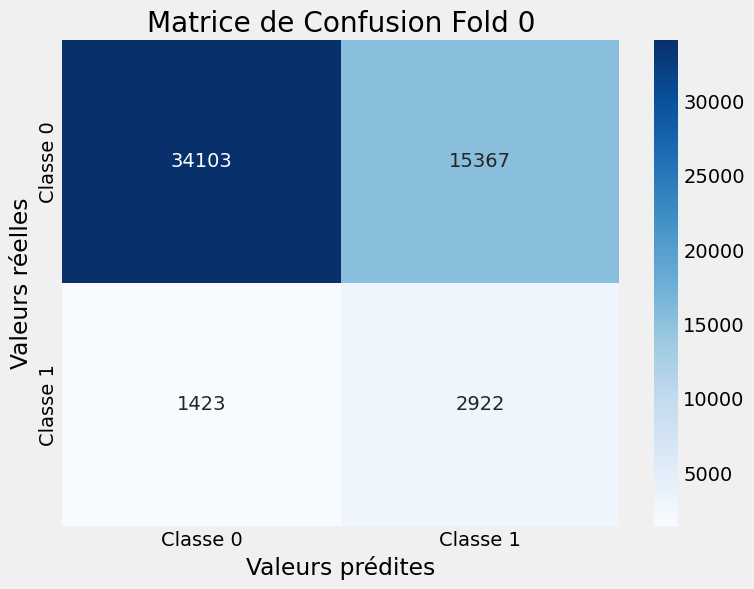

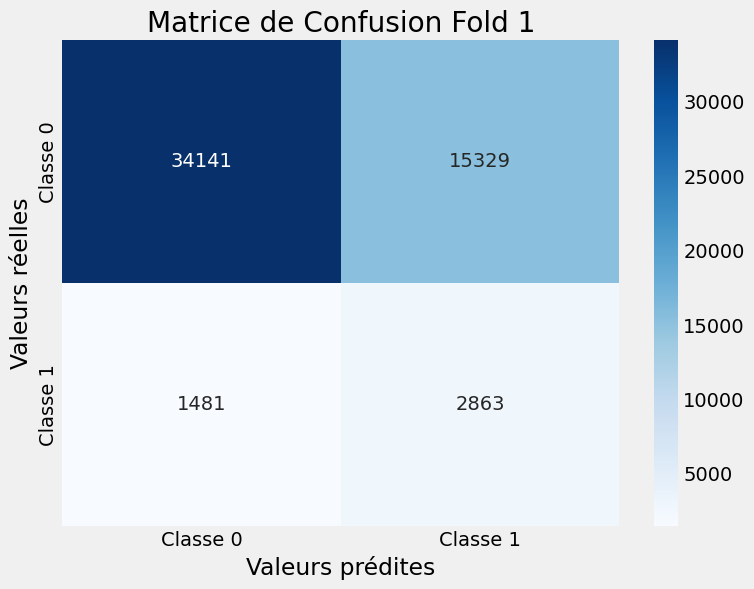

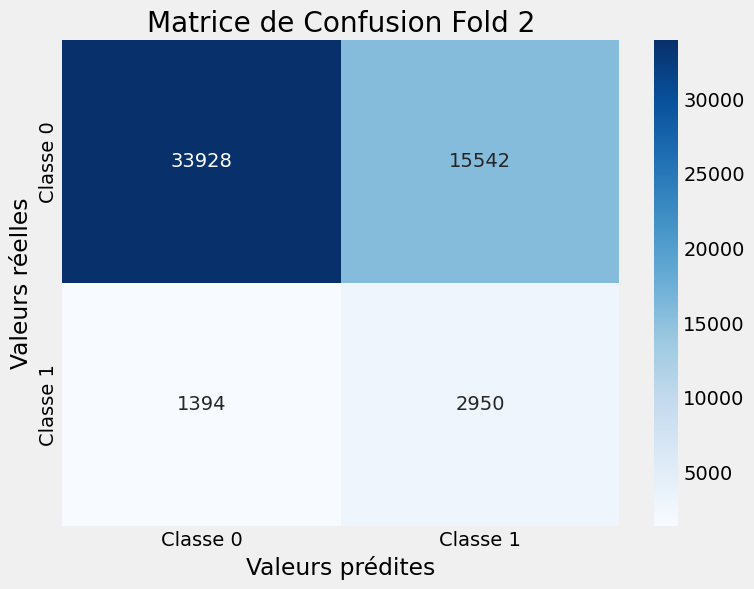

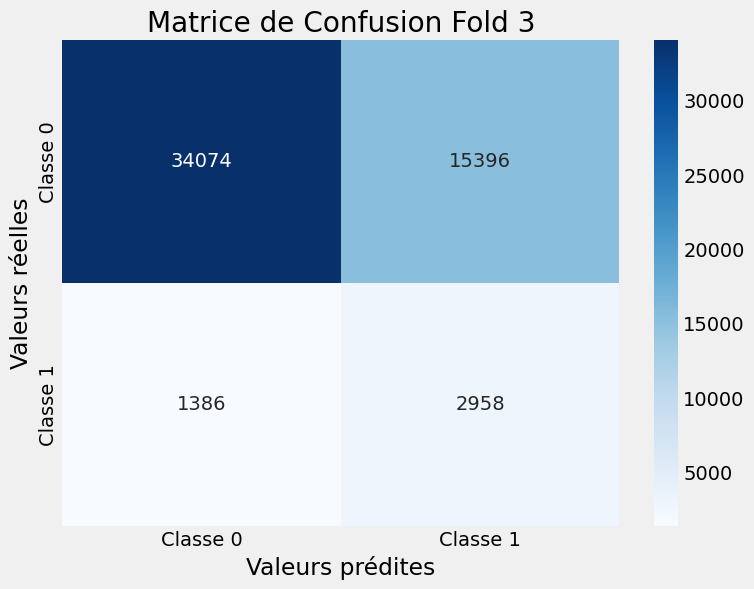

In [125]:
for i in range(len(list_confu_log)):
    confusion = list_confu_log[i]

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.show()

## Validation

In [126]:
y_pred_val_log = log.predict(X_val_log)

In [127]:
precision_val = precision_score(y_val_log, y_pred_val_log).round(3)
f1_val = f1_score(y_val_log, y_pred_val_log).round(3)
recall_val = recall_score(y_val_log, y_pred_val_log).round(3)
roc_val = roc_auc_score(y_val_log, y_pred_val_log).round(3)
beta_val = fbeta_score(y_val_log,
                       y_pred_val_log,
                       beta=beta,
                       pos_label=1,
                       average='binary').round(3)

dict_scores_log["validation"] = [
    "", precision_val, f1_val, recall_val, roc_val, beta_val
]

In [128]:
print(f"Precision : {precision_val}")
print(f"F1 score : {f1_val}")
print(f"Recall : {recall_val}")
print(f"ROC_AUC : {roc_val}")
print(f"Score custom : {beta_val}")

Precision : 0.161
F1 score : 0.26
Recall : 0.679
ROC_AUC : 0.684
Score custom : 0.164


In [129]:
df_scores_log = pd.concat([
    df_scores_log,
    pd.DataFrame(
        dict_scores_log["validation"],
        index=["", "Precision", "F1 Score", "Recall", "ROC_AUC",
               "Beta Score"]).T
])

idx_fold_log.append("Validation")

df_scores_log.index = idx_fold_log
df_scores_log

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom Score,
Fold 0,47.461885,0.16,0.258,0.672,0.681,0.41,29597000.0,NaN
Fold 1,47.554046,0.157,0.254,0.659,0.675,0.177,30139000.0,NaN
Fold 2,39.670391,0.16,0.258,0.679,0.682,0.163,29482000.0,NaN
Fold 3,40.395843,0.161,0.261,0.681,0.685,0.164,29256000.0,NaN
Mean,43.770541,0.1595,0.25775,0.67275,0.68075,0.2285,29618500.0,NaN
Validation,NaN,0.161,0.26,0.679,0.684,0.164,NaN,


# Random Forest
## Séparation X_train, y_train, X_test

In [130]:
X_rf = train_scaled.drop(columns="TARGET").reset_index(drop=True)
y_rf = train_scaled["TARGET"].reset_index(drop=True)

In [131]:
X_train_rf, X_val_rf, y_train_rf, y_val_rf = train_test_split(X_rf,
                                                              y_rf,
                                                              stratify=y_rf,
                                                              test_size=0.3,
                                                              random_state=42)

## MLflow
### Création de l'expérience

In [132]:
client = MlflowClient(tracking_uri="http://127.0.0.1:8080")

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk Random Forest. "
    "This project contains the model of Random Forest from Scikit-Learn."
)

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 RF",
    "model" : "Random Forest",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(
    name="Projet 7 RF", tags=experiment_tags
)

### Connexion

In [133]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [134]:
mlflow.set_experiment("Projet 7 RF")

<Experiment: artifact_location='mlflow-artifacts:/158447608667250075', creation_time=1703841204720, experiment_id='158447608667250075', last_update_time=1703841204720, lifecycle_stage='active', name='Projet 7 RF', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk Random Forest. '
                        'This project contains the model of Random Forest from '
                        'Scikit-Learn.',
 'model': 'Random Forest',
 'project_name': 'Projet 7 RF'}>

## Création du modèle

In [135]:
params_rf = {
    'n_estimators': 100,
    'criterion': 'gini',
    'max_depth': None,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_features': 'log2',
    'random_state': 42
}

In [136]:
rf = RandomForestClassifier(**params_rf)

## Entrainement du modèle

In [137]:
dict_scores_rf = {}
list_confu_rf = []

for i, (train_idx, test_idx) in enumerate(skf.split(X_train_rf, y_train_rf)):

    bordersmote = BorderlineSMOTE()

    # train set et test set
    X_train = X_train_rf.iloc[train_idx]
    y_train = y_train_rf.iloc[train_idx]

    X_val = X_train_rf.iloc[test_idx]
    y_val = y_train_rf.iloc[test_idx]

    # Initialise dict
    dict_scores_rf[i] = []

    X_train, y_train = bordersmote.fit_resample(X_train, y_train)

    # Training with timer
    start = time.time()
    rf.fit(X_train, y_train)
    duration = time.time() - start

    # Getting the predictions
    y_pred = rf.predict(X_val)

    # Scores calculation
    precision = precision_score(y_val, y_pred).round(3)
    f1 = f1_score(y_val, y_pred).round(3)
    recall = recall_score(y_val, y_pred).round(3)
    roc = roc_auc_score(y_val, y_pred).round(3)
    beta = fbeta_score(y_val, y_pred, beta=beta, pos_label=1,
                       average='binary').round(3)

    # adding to dict
    dict_scores_rf[i].append([duration, precision, f1, recall, roc, beta])

    # Confusion matrix calculation
    confusion_mat = confusion_matrix(y_val, y_pred)
    list_confu_rf.append(confusion_mat)

    # Creation of the confusion matrix figure
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.savefig("confusion_matrix.png")  # Sauvegarde temporaire de l'image
    plt.close()

    # starting save with MLflow
    with mlflow.start_run(run_name=f"Fold_{i}") as run:
        # Log the hyperparameters
        mlflow.log_params(params_rf)

        # Log the metrics
        mlflow.log_metric("precision", precision)
        mlflow.log_metric("f1", f1)
        mlflow.log_metric("recall", recall)
        mlflow.log_metric("roc", roc)
        mlflow.log_metric("beta", beta)
        mlflow.log_metric("duration", duration)

        # Log the confusion matrix
        mlflow.log_artifact("confusion_matrix.png",
                            artifact_path="Projet7/CF/RF")

        # Set a tag that we can use to remind ourselves what this run was for
        mlflow.set_tag("Training Info",
                       "Basic RF model for Home Credit Default Risk")

        # Infer the model signature
        signature = infer_signature(X_train, rf.predict(X_train))

        # Log the model
        model_info = mlflow.sklearn.log_model(
            sk_model=rf,
            artifact_path="Projet7/Models/RF",
            signature=signature,
            input_example=X_train,
            registered_model_name="Projet 7 RF")

Registered model 'Projet 7 RF' already exists. Creating a new version of this model...
2024/01/15 10:53:18 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 RF, version 13
Created version '13' of model 'Projet 7 RF'.
Registered model 'Projet 7 RF' already exists. Creating a new version of this model...
2024/01/15 10:57:53 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 RF, version 14
Created version '14' of model 'Projet 7 RF'.
Registered model 'Projet 7 RF' already exists. Creating a new version of this model...
2024/01/15 11:02:18 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 RF, version 15
Created version '15' of model 'Projet 7 RF'.
Registered model 'Projet 7 RF' already exists. Creating a new version of this model...
2024/01/15

## Scores du modèle

In [138]:
df_scores_rf = pd.DataFrame([val[0] for val in dict_scores_rf.values()],
                            columns=[
                                "Duration", "Precision", "F1 Score", "Recall",
                                "ROC_AUC", "Beta Score"
                            ])

df_scores_rf = pd.concat([df_scores_rf, pd.DataFrame(df_scores_rf.mean()).T])

idx_fold_rf = [f"Fold {i}" for i in range(n_fold)]
idx_fold_rf.append("Mean")

df_scores_rf.index = idx_fold_rf

df_scores_rf

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score
Fold 0,147.942561,0.282,0.03200,0.017,0.50700,0.20100
Fold 1,147.682905,0.295,0.03300,0.018,0.50700,0.18400
Fold 2,144.776897,0.297,0.03800,0.020,0.50800,0.20400
Fold 3,143.409024,0.286,0.03200,0.017,0.50700,0.17400
Mean,145.952847,0.290,0.03375,0.018,0.50725,0.19075


### Confusion matrices

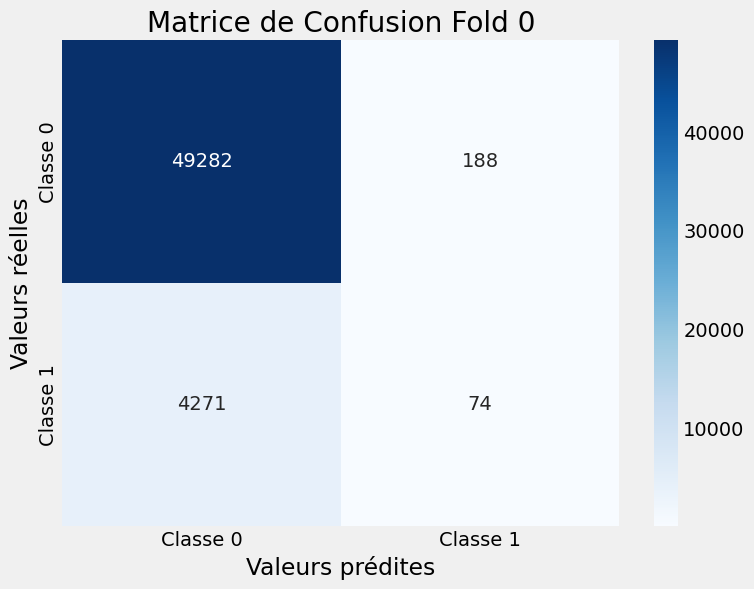

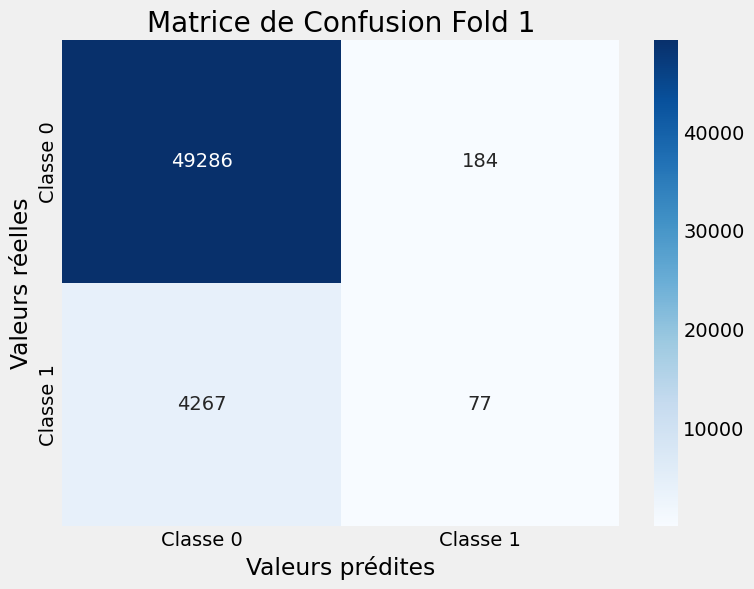

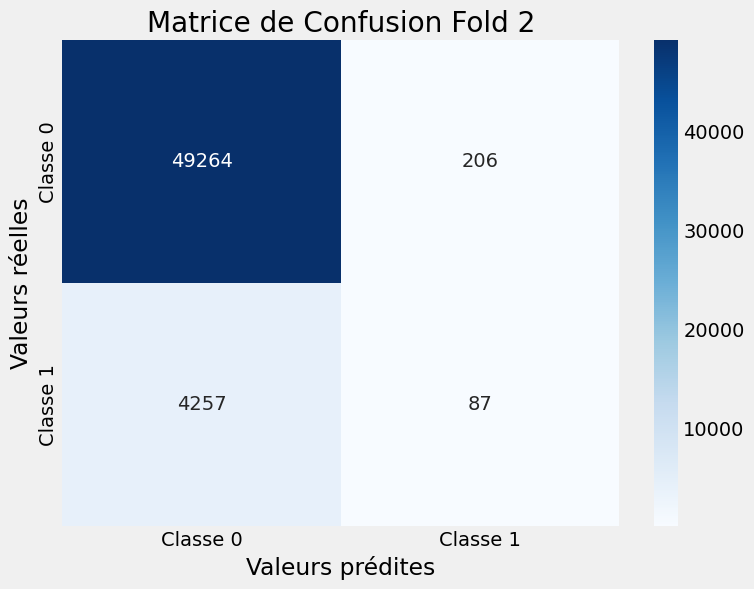

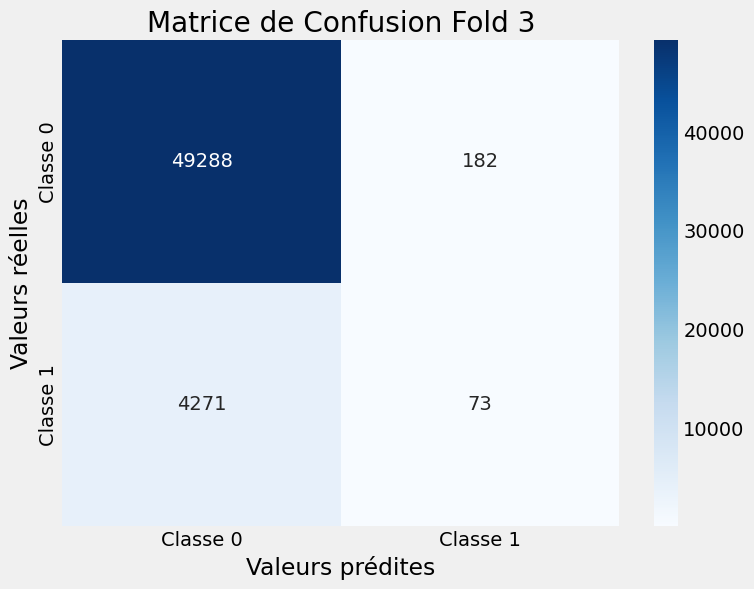

In [139]:
for i in range(len(list_confu_rf)):
    confusion = list_confu_rf[i]

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.show()

## Validation

In [140]:
y_pred_val_rf = rf.predict(X_val_rf)

In [141]:
precision_val = precision_score(y_val_rf, y_pred_val_rf).round(3)
f1_val = f1_score(y_val_rf, y_pred_val_rf).round(3)
recall_val = recall_score(y_val_rf, y_pred_val_rf).round(3)
roc_val = roc_auc_score(y_val_rf, y_pred_val_rf).round(3)
beta_val = fbeta_score(y_val_rf,
                       y_pred_val_rf,
                       beta=beta,
                       pos_label=1,
                       average='binary').round(3)

dict_scores_rf["validation"] = [
    precision_val, f1_val, recall_val, roc_val, beta_val
]

In [142]:
print(f"Precision : {precision_val}")
print(f"F1 score : {f1_val}")
print(f"Recall : {recall_val}")
print(f"ROC_AUC : {roc_val}")
print(f"Score custom : {beta_val}")

Precision : 0.267
F1 score : 0.031
Recall : 0.016
ROC_AUC : 0.506
Score custom : 0.183


In [143]:
df_scores_rf = pd.concat([
    df_scores_rf,
    pd.DataFrame(
        dict_scores_rf["validation"],
        index=["Precision", "F1 Score", "Recall", "ROC_AUC", "Beta Score"]).T
])

In [144]:
idx_fold_rf.append("Validation")

df_scores_rf.index = idx_fold_rf
df_scores_rf

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score
Fold 0,147.942561,0.282,0.03200,0.017,0.50700,0.20100
Fold 1,147.682905,0.295,0.03300,0.018,0.50700,0.18400
Fold 2,144.776897,0.297,0.03800,0.020,0.50800,0.20400
Fold 3,143.409024,0.286,0.03200,0.017,0.50700,0.17400
Mean,145.952847,0.290,0.03375,0.018,0.50725,0.19075
Validation,NaN,0.267,0.03100,0.016,0.50600,0.18300


# LightGBM Base
## Scaling

In [145]:
scaler_lgbm = MinMaxScaler()

In [146]:
scaler_lgbm.fit(train)

MinMaxScaler()

In [147]:
train_scaled = scaler_lgbm.transform(train)

In [148]:
lgbm_column_names = [clean_column_name(col) for col in train.columns]

In [149]:
train_scaled = pd.DataFrame(train_scaled, columns=lgbm_column_names)

## Séparation X_train, y_train, X_test

In [150]:
X_lgbm_base = train_scaled.drop(columns="TARGET").reset_index(drop=True)
y_lgbm_base = train_scaled["TARGET"].reset_index(drop=True)

In [151]:
X_train_lgbm, X_val_lgbm, y_train_lgbm, y_val_lgbm = train_test_split(
    X_lgbm_base,
    y_lgbm_base,
    stratify=y_lgbm_base,
    test_size=0.3,
    random_state=42)

## MLflow
### Création de l'expérience

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk LightGBM Classification. "
    "This project contains the model of LGBMClassifier from LightGBM.")

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 LGBMC Base",
    "model": "LGBMClassifier",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(name="Projet 7 LGBMC Base",
                                          tags=experiment_tags)

### Connexion

In [152]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [153]:
mlflow.set_experiment("Projet 7 LGBMC Base")

<Experiment: artifact_location='mlflow-artifacts:/238512622195980229', creation_time=1703842269907, experiment_id='238512622195980229', last_update_time=1703842269907, lifecycle_stage='active', name='Projet 7 LGBMC Base', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk LightGBM '
                        'Classification. This project contains the model of '
                        'LGBMClassifier from LightGBM.',
 'model': 'LGBMClassifier',
 'project_name': 'Projet 7 LGBMC Base'}>

## Création du modèle

In [154]:
params_lgbm = {
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.1,
    'n_estimators': 100,
    'objective': 'binary',
    'class_weight': 'balanced',
    'random_state': 42
}

In [155]:
lgbm = LGBMClassifier(**params_lgbm)

## Entrainement du modèle

In [156]:
dict_scores_lgbm = {}
list_confu_lgbm = []

for i, (train_idx, test_idx) in enumerate(skf.split(X_train_lgbm,
                                                    y_train_lgbm)):

    # train set et test set
    X_train = X_train_lgbm.iloc[train_idx]
    y_train = y_train_lgbm.iloc[train_idx]

    X_val = X_train_lgbm.iloc[test_idx]
    y_val = y_train_lgbm.iloc[test_idx]

    # Initialise dict
    dict_scores_lgbm[i] = []

    # Training with timer
    start = time.time()
    lgbm.fit(X_train, y_train)
    duration = time.time() - start

    # Getting the predictions
    y_pred = lgbm.predict(X_val)

    # Scores calculation
    precision = precision_score(y_val, y_pred).round(3)
    f1 = f1_score(y_val, y_pred).round(3)
    recall = recall_score(y_val, y_pred).round(3)
    roc = roc_auc_score(y_val, y_pred).round(3)
    beta = fbeta_score(y_val, y_pred, beta=beta, pos_label=1,
                       average='binary').round(3)
    custom = score_custom(y_val, y_pred)

    # adding to dict
    dict_scores_lgbm[i].append([duration, precision, f1, recall, roc, beta, custom])

    # Confusion matrix calculation
    confusion_mat = confusion_matrix(y_val, y_pred)
    list_confu_lgbm.append(confusion_mat)

    # Creation of the confusion matrix figure
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.savefig("confusion_matrix.png")  # Sauvegarde temporaire de l'image
    plt.close()

    # starting save with MLflow
    with mlflow.start_run(run_name=f"Fold_{i}") as run:
        # Log the hyperparameters
        mlflow.log_params(params_lgbm)

        # Log the metrics
        mlflow.log_metric("precision", precision)
        mlflow.log_metric("f1", f1)
        mlflow.log_metric("recall", recall)
        mlflow.log_metric("roc", roc)
        mlflow.log_metric("beta", beta)
        mlflow.log_metric("custom", custom)
        mlflow.log_metric("duration", duration)

        # Log the confusion matrix
        mlflow.log_artifact("confusion_matrix.png",
                            artifact_path="Projet7/CF/LGBM/Base")

        # Set a tag that we can use to remind ourselves what this run was for
        mlflow.set_tag("Training Info",
                       "Basic LGBM model for Home Credit Default Risk")

        # Infer the model signature
        signature = infer_signature(X_train_lgbm, lgbm.predict(X_train))

        # Log the model
        model_info = mlflow.sklearn.log_model(
            sk_model=lgbm,
            artifact_path="Projet7/Models/LGBM/Base",
            signature=signature,
            input_example=X_train,
            registered_model_name="Projet 7 LGBM Base")

[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11537
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 236
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Base' already exists. Creating a new version of this model...
2024/01/15 11:07:45 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Base, version 17
Created version '17' of model 'Projet 7 LGBM Base'.


[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11535
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 236
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Base' already exists. Creating a new version of this model...
2024/01/15 11:08:37 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Base, version 18
Created version '18' of model 'Projet 7 LGBM Base'.


[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11531
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 236
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Base' already exists. Creating a new version of this model...
2024/01/15 11:09:29 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Base, version 19
Created version '19' of model 'Projet 7 LGBM Base'.


[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11453
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 236
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Base' already exists. Creating a new version of this model...
2024/01/15 11:10:21 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Base, version 20
Created version '20' of model 'Projet 7 LGBM Base'.


## Scores du modèle

In [157]:
df_scores_lgbm = pd.DataFrame([val[0] for val in dict_scores_lgbm.values()],
                              columns=[
                                  "Duration", "Precision", "F1 Score",
                                  "Recall", "ROC_AUC", "Beta Score", "Custom Score"
                              ])

df_scores_lgbm = pd.concat(
    [df_scores_lgbm, pd.DataFrame(df_scores_lgbm.mean()).T])

idx_fold_lgbm = [f"Fold {i}" for i in range(n_fold)]
idx_fold_lgbm.append("Mean")

df_scores_lgbm.index = idx_fold_lgbm

df_scores_lgbm

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom Score
Fold 0,2.701177,0.1720,0.273,0.6620,0.69100,0.175,28571000.0
Fold 1,2.938814,0.1690,0.268,0.6520,0.68500,0.172,29088000.0
Fold 2,2.820510,0.1690,0.270,0.6660,0.68900,0.173,28719000.0
Fold 3,2.745790,0.1720,0.273,0.6660,0.69200,0.176,28423000.0
Mean,2.801573,0.1705,0.271,0.6615,0.68925,0.174,28700250.0


### Confusion matrices

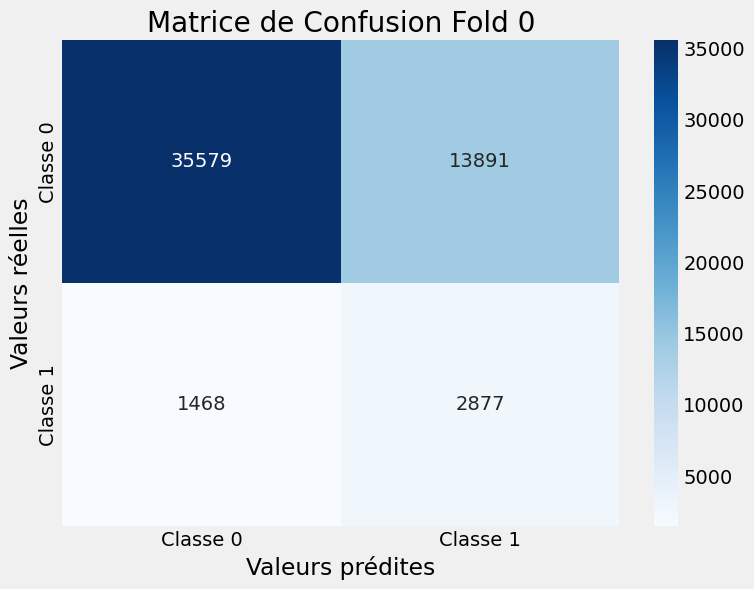

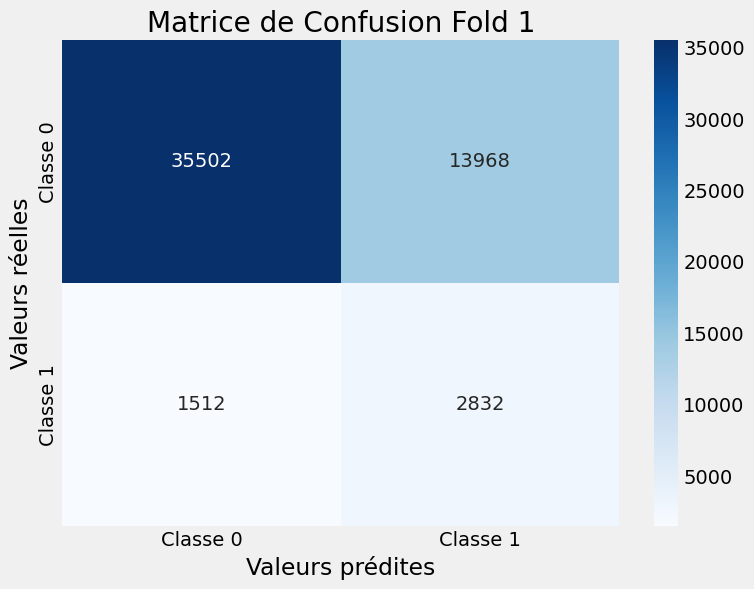

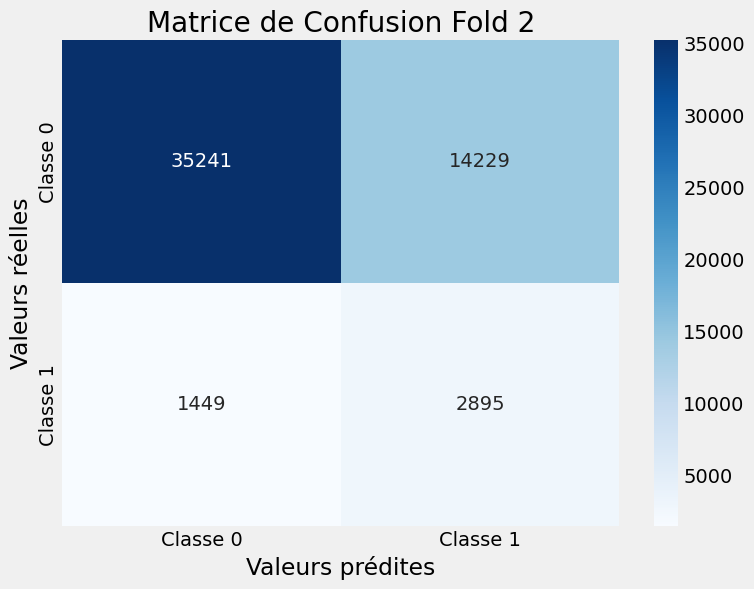

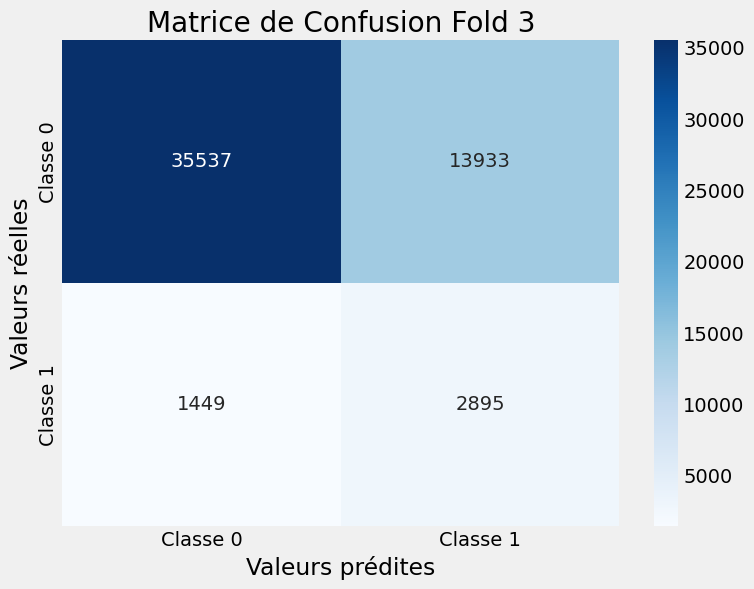

In [158]:
for i in range(len(list_confu_lgbm)):
    confusion = list_confu_lgbm[i]

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.show()

## Validation

In [159]:
y_pred_val_lgbm = lgbm.predict(X_val_lgbm)

In [160]:
precision_val = precision_score(y_val_lgbm, y_pred_val_lgbm).round(3)
f1_val = f1_score(y_val_lgbm, y_pred_val_lgbm).round(3)
recall_val = recall_score(y_val_lgbm, y_pred_val_lgbm).round(3)
roc_val = roc_auc_score(y_val_lgbm, y_pred_val_lgbm).round(3)
beta_val = fbeta_score(y_val_lgbm,
                       y_pred_val_lgbm,
                       beta=beta,
                       pos_label=1,
                       average='binary').round(3)

dict_scores_lgbm["validation"] = [
    precision_val, f1_val, recall_val, roc_val, beta_val
]

In [161]:
print(f"Precision : {precision_val}")
print(f"F1 score : {f1_val}")
print(f"Recall : {recall_val}")
print(f"ROC_AUC : {roc_val}")
print(f"Score custom : {beta_val}")

Precision : 0.17
F1 score : 0.27
Recall : 0.66
ROC_AUC : 0.689
Score custom : 0.174


In [162]:
df_scores_lgbm = pd.concat([
    df_scores_lgbm,
    pd.DataFrame(
        dict_scores_lgbm["validation"],
        index=["Precision", "F1 Score", "Recall", "ROC_AUC", "Beta Score"]).T
])

In [163]:
idx_fold_lgbm.append("Validation")

df_scores_lgbm.index = idx_fold_lgbm
df_scores_lgbm

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom Score
Fold 0,2.701177,0.1720,0.273,0.6620,0.69100,0.175,28571000.0
Fold 1,2.938814,0.1690,0.268,0.6520,0.68500,0.172,29088000.0
Fold 2,2.820510,0.1690,0.270,0.6660,0.68900,0.173,28719000.0
Fold 3,2.745790,0.1720,0.273,0.6660,0.69200,0.176,28423000.0
Mean,2.801573,0.1705,0.271,0.6615,0.68925,0.174,28700250.0
Validation,NaN,0.1700,0.270,0.6600,0.68900,0.174,NaN


# LightGBM Poly features
## Récupération des données

In [164]:
df_poly = pd.read_csv("../Data/poly_data.csv", index_col=False)

df_poly.replace([np.inf, -np.inf], np.nan, inplace=True)

train_poly = df_poly[df_poly["TARGET"].notnull()].reset_index(drop=True)

print(f"Train shape : {train_poly.shape}")

Train shape : (307511, 296)


In [165]:
lgbm_poly_cols = [clean_column_name(col) for col in train_poly.columns]

In [166]:
del df_poly

## Scaling

In [167]:
scaler_lgbm.fit(train_poly)

MinMaxScaler()

In [168]:
train_poly_scaled = scaler_lgbm.transform(train_poly)

In [169]:
train_poly_scaled = pd.DataFrame(train_poly_scaled, columns=lgbm_poly_cols)

## Séparation X_train, y_train, X_test

In [170]:
X_lgbm_poly = train_poly_scaled.drop(columns="TARGET").reset_index(drop=True)
y_lgbm_poly = train_poly_scaled["TARGET"].reset_index(drop=True)

In [171]:
X_train_poly, X_val_poly, y_train_poly, y_val_poly = train_test_split(
    X_lgbm_poly,
    y_lgbm_poly,
    stratify=y_lgbm_poly,
    test_size=0.3,
    random_state=42)

## MLflow
### Création de l'expérience

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk LightGBM Classification. "
    "This project contains the model of LGBMClassifier from LightGBM.")

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 LGBMC Polynomial Features",
    "model": "LGBMClassifier",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(name="Projet 7 LGBMC Poly",
                                          tags=experiment_tags)

### Connexion

In [172]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [173]:
mlflow.set_experiment("Projet 7 LGBMC Poly")

<Experiment: artifact_location='mlflow-artifacts:/853309576025422464', creation_time=1703844129475, experiment_id='853309576025422464', last_update_time=1703844129475, lifecycle_stage='active', name='Projet 7 LGBMC Poly', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk LightGBM '
                        'Classification. This project contains the model of '
                        'LGBMClassifier from LightGBM.',
 'model': 'LGBMClassifier',
 'project_name': 'Projet 7 LGBMC Polynomial Features'}>

## Création du modèle

In [174]:
params_poly = {
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.1,
    'n_estimators': 100,
    'objective': 'binary',
    'class_weight': 'balanced',
    'random_state': 42
}

In [175]:
lgbm_poly = LGBMClassifier(**params_poly)

## Entrainement du modèle

In [176]:
dict_scores_lgbm_poly = {}
list_confu_lgbm_poly = []

for i, (train_idx, test_idx) in enumerate(skf.split(X_train_poly,
                                                    y_train_poly)):

    # train set et test set
    X_train = X_train_poly.iloc[train_idx]
    y_train = y_train_poly.iloc[train_idx]

    X_val = X_train_poly.iloc[test_idx]
    y_val = y_train_poly.iloc[test_idx]

    # Initialise dict
    dict_scores_lgbm_poly[i] = []

    # Training with timer
    start = time.time()
    lgbm_poly.fit(X_train, y_train)
    duration = time.time() - start

    # Getting the predictions
    y_pred = lgbm_poly.predict(X_val)

    # Scores calculation
    precision = precision_score(y_val, y_pred).round(3)
    f1 = f1_score(y_val, y_pred).round(3)
    recall = recall_score(y_val, y_pred).round(3)
    roc = roc_auc_score(y_val, y_pred).round(3)
    beta = fbeta_score(y_val, y_pred, beta=beta, pos_label=1,
                       average='binary').round(3)
    custom = score_custom(y_val, y_pred)

    # adding to dict
    dict_scores_lgbm_poly[i].append(
        [duration, precision, f1, recall, roc, beta, custom])

    # Confusion matrix calculation
    confusion_mat = confusion_matrix(y_val, y_pred)
    list_confu_lgbm_poly.append(confusion_mat)

    # Creation of the confusion matrix figure
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.savefig("confusion_matrix.png")  # Sauvegarde temporaire de l'image
    plt.close()
    
    # starting save with MLflow
    with mlflow.start_run(run_name=f"Fold_{i}") as run:
        # Log the hyperparameters
        mlflow.log_params(params_poly)

        # Log the metrics
        mlflow.log_metric("precision", precision)
        mlflow.log_metric("f1", f1)
        mlflow.log_metric("recall", recall)
        mlflow.log_metric("roc", roc)
        mlflow.log_metric("beta", beta)
        mlflow.log_metric("custom", custom)
        mlflow.log_metric("duration", duration)

        # Log the confusion matrix
        mlflow.log_artifact("confusion_matrix.png",
                            artifact_path="Projet7/CF/LGBM/Poly")

        # Set a tag that we can use to remind ourselves what this run was for
        mlflow.set_tag(
            "Training Info",
            "LGBM model for Home Credit Default Risk with polynomiale features"
        )

        # Infer the model signature
        signature = infer_signature(X_train_lgbm, lgbm_poly.predict(X_train))

        # Log the model
        model_info = mlflow.sklearn.log_model(
            sk_model=lgbm_poly,
            artifact_path="Projet7/Models/LGBM/Poly",
            signature=signature,
            input_example=X_train,
            registered_model_name="Projet 7 LGBM Poly")

[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21449
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 275
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Poly' already exists. Creating a new version of this model...
2024/01/15 11:11:43 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Poly, version 13
Created version '13' of model 'Projet 7 LGBM Poly'.


[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21447
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 275
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Poly' already exists. Creating a new version of this model...
2024/01/15 11:12:48 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Poly, version 14
Created version '14' of model 'Projet 7 LGBM Poly'.


[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.137631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21445
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 275
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Poly' already exists. Creating a new version of this model...
2024/01/15 11:13:53 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Poly, version 15
Created version '15' of model 'Projet 7 LGBM Poly'.


[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.118285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21362
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 275
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


Registered model 'Projet 7 LGBM Poly' already exists. Creating a new version of this model...
2024/01/15 11:14:58 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Poly, version 16
Created version '16' of model 'Projet 7 LGBM Poly'.


## Scores du modèle

In [177]:
df_scores_lgbm_poly = pd.DataFrame(
    [val[0] for val in dict_scores_lgbm_poly.values()],
    columns=[
        "Duration", "Precision", "F1 Score", "Recall", "ROC_AUC", "Beta Score", "Custom"
    ])

df_scores_lgbm_poly = pd.concat(
    [df_scores_lgbm_poly,
     pd.DataFrame(df_scores_lgbm_poly.mean()).T])

idx_fold_lgbm_poly = [f"Fold {i}" for i in range(n_fold)]
idx_fold_lgbm_poly.append("Mean")

df_scores_lgbm_poly.index = idx_fold_lgbm_poly

df_scores_lgbm_poly

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom
Fold 0,4.436210,0.17300,0.275,0.66700,0.69300,0.17700,28328000.0
Fold 1,5.067427,0.17100,0.272,0.66100,0.69000,0.17500,28635000.0
Fold 2,4.907716,0.17300,0.276,0.67800,0.69700,0.17700,28060000.0
Fold 3,4.730303,0.17400,0.277,0.67700,0.69700,0.17800,27982000.0
Mean,4.785414,0.17275,0.275,0.67075,0.69425,0.17675,28251250.0


### Confusion matrices

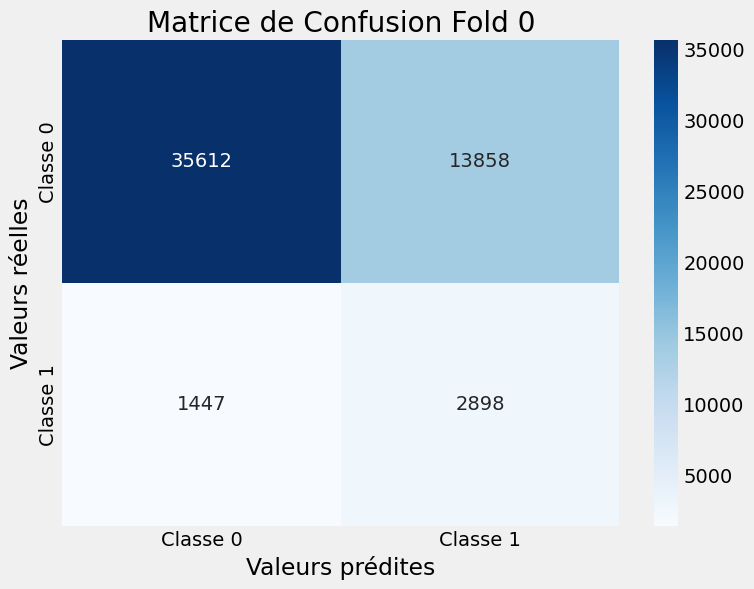

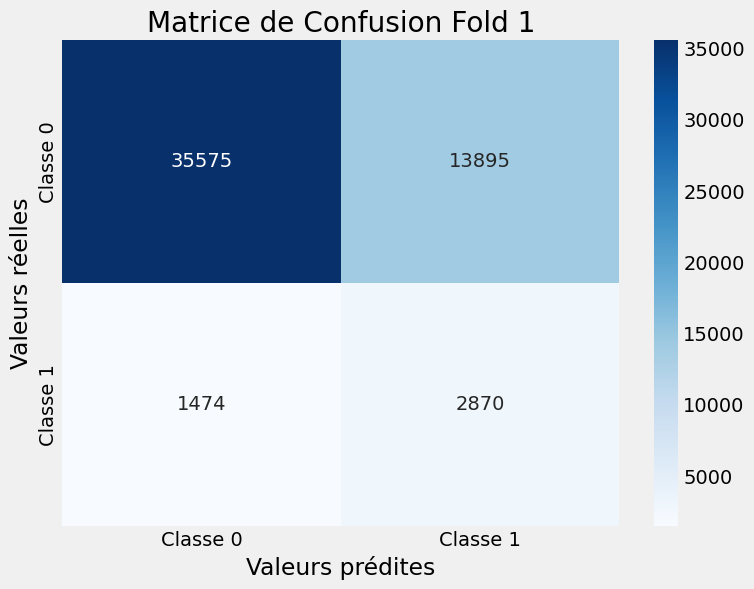

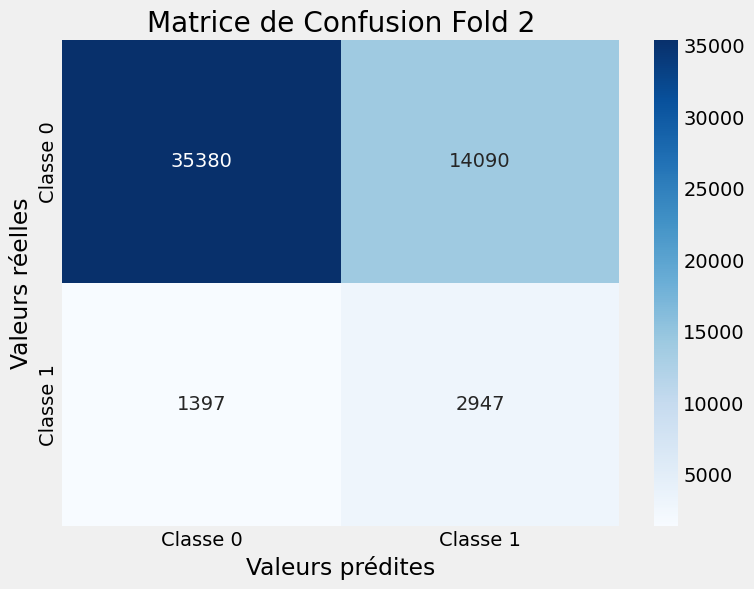

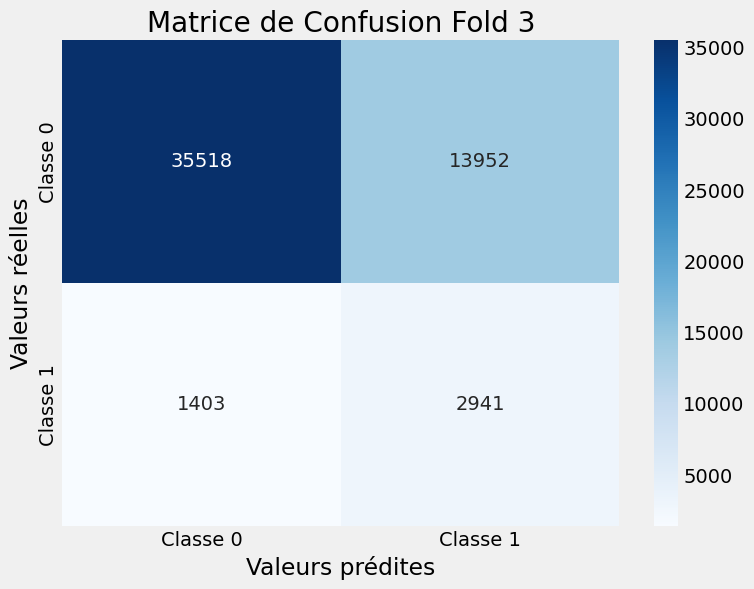

In [178]:
for i in range(len(list_confu_lgbm_poly)):
    confusion = list_confu_lgbm_poly[i]

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.show()

## Validation

In [179]:
y_pred_val_poly = lgbm_poly.predict(X_val_poly)

In [180]:
precision_val = precision_score(y_val_poly, y_pred_val_poly).round(3)
f1_val = f1_score(y_val_poly, y_pred_val_poly).round(3)
recall_val = recall_score(y_val_poly, y_pred_val_poly).round(3)
roc_val = roc_auc_score(y_val_poly, y_pred_val_poly).round(3)
beta_val = fbeta_score(y_val_poly,
                       y_pred_val_poly,
                       beta=beta,
                       pos_label=1,
                       average='binary').round(3)

dict_scores_lgbm_poly["validation"] = [
    precision_val, f1_val, recall_val, roc_val, beta_val
]

In [181]:
print(f"Precision : {precision_val}")
print(f"F1 score : {f1_val}")
print(f"Recall : {recall_val}")
print(f"ROC_AUC : {roc_val}")
print(f"Score custom : {beta_val}")

Precision : 0.173
F1 score : 0.275
Recall : 0.671
ROC_AUC : 0.695
Score custom : 0.177


In [182]:
df_scores_lgbm_poly = pd.concat([
    df_scores_lgbm_poly,
    pd.DataFrame(
        dict_scores_lgbm_poly["validation"],
        index=["Precision", "F1 Score", "Recall", "ROC_AUC", "Beta Score"]).T
])

In [183]:
idx_fold_lgbm_poly.append("Validation")

df_scores_lgbm_poly.index = idx_fold_lgbm_poly
df_scores_lgbm_poly

,Duration,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom
Fold 0,4.436210,0.17300,0.275,0.66700,0.69300,0.17700,28328000.0
Fold 1,5.067427,0.17100,0.272,0.66100,0.69000,0.17500,28635000.0
Fold 2,4.907716,0.17300,0.276,0.67800,0.69700,0.17700,28060000.0
Fold 3,4.730303,0.17400,0.277,0.67700,0.69700,0.17800,27982000.0
Mean,4.785414,0.17275,0.275,0.67075,0.69425,0.17675,28251250.0
Validation,NaN,0.17300,0.275,0.67100,0.69500,0.17700,NaN


# LightGBM Full Features
## Récupération des données

In [184]:
df_complete = pd.read_csv("../Data/complete_data.csv", index_col=False)

df_complete.replace([np.inf, -np.inf], np.nan, inplace=True)

train_complete = df_complete[df_complete["TARGET"].notnull()].reset_index(
    drop=True)

print(f"Train shape : {train_complete.shape}")

Train shape : (307511, 533)


In [185]:
lgbm_complete_names = [clean_column_name(col) for col in train_complete.columns]

In [186]:
del df_complete

## Scaling

In [187]:
scaler_lgbm.fit(train_complete)

MinMaxScaler()

In [188]:
train_complete_scaled = scaler_lgbm.transform(train_complete)

In [189]:
train_complete_scaled = pd.DataFrame(train_complete_scaled, columns=lgbm_complete_names)

## Séparation X_train, y_train, X_test

In [190]:
X_lgbm_complete = train_complete_scaled.drop(columns="TARGET").reset_index(
    drop=True)
y_lgbm_complete = train_complete_scaled["TARGET"].reset_index(drop=True)

In [191]:
X_train_complete, X_val_complete, y_train_complete, y_val_complete = train_test_split(
    X_lgbm_complete,
    y_lgbm_complete,
    stratify=y_lgbm_complete,
    test_size=0.3,
    random_state=42)

## MLflow
### Création de l'expérience

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk LightGBM Classification. "
    "This project contains the model of LGBMClassifier from LightGBM.")

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 LGBMC All Features",
    "model": "LGBMClassifier",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(name="Projet 7 LGBMC Full",
                                          tags=experiment_tags)

### Connexion

In [192]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [193]:
mlflow.set_experiment("Projet 7 LGBMC Full")

<Experiment: artifact_location='mlflow-artifacts:/896584142436355686', creation_time=1703844433803, experiment_id='896584142436355686', last_update_time=1703844433803, lifecycle_stage='active', name='Projet 7 LGBMC Full', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk LightGBM '
                        'Classification. This project contains the model of '
                        'LGBMClassifier from LightGBM.',
 'model': 'LGBMClassifier',
 'project_name': 'Projet 7 LGBMC All Features'}>

## Création du modèle

In [194]:
params_complete = {
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.1,
    'n_estimators': 100,
    'objective': 'binary',
    'class_weight': 'balanced',
    'random_state': 42
}

In [195]:
lgbm_complete = LGBMClassifier(**params_complete)

## Entrainement du modèle

In [196]:
dict_scores_lgbm_complete = {}
list_confu_lgbm_complete = []
list_tresholds_complete = []

for i, (train_idx,
        test_idx) in enumerate(skf.split(X_train_complete, y_train_complete)):

    # train set et test set
    X_train = X_train_complete.iloc[train_idx]
    y_train = y_train_complete.iloc[train_idx]

    X_val = X_train_complete.iloc[test_idx]
    y_val = y_train_complete.iloc[test_idx]

    # Initialise dict
    dict_scores_lgbm_complete[i] = []

    # Training with timer
    start = time.time()
    lgbm_complete.fit(X_train, y_train, eval_metric="precision")
    duration = time.time() - start

    # Getting the predictions
    y_pred = lgbm_complete.predict(X_val)

    # Scores calculation
    precision = precision_score(y_val, y_pred).round(3)
    f1 = f1_score(y_val, y_pred).round(3)
    recall = recall_score(y_val, y_pred).round(3)
    roc = roc_auc_score(y_val, y_pred).round(3)
    beta = fbeta_score(y_val, y_pred, beta=beta, pos_label=1,
                       average='binary').round(3)
    custom = score_custom(y_val, y_pred)

    # adding to dict
    dict_scores_lgbm_complete[i].append(
        [duration, precision, f1, recall, roc, beta, custom])

    # Confusion matrix calculation
    confusion_mat = confusion_matrix(y_val, y_pred)
    list_confu_lgbm_complete.append(confusion_mat)

    # Creation of the confusion matrix figure
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.savefig("confusion_matrix.png")  # Sauvegarde temporaire de l'image
    plt.close()

    # predict probabilities
    yhat = lgbm_complete.predict_proba(X_val)
    # keep probabilities for the positive outcome only
    yhat = yhat[:, 1]
    # calculate roc curves
    fpr, tpr, thresholds = roc_curve(y_val, yhat)
    # get the best threshold
    J = tpr - fpr
    ix = argmax(J)
    best_thresh = thresholds[ix]
    
    list_tresholds_complete.append(best_thresh)

    # starting save with MLflow
    with mlflow.start_run(run_name=f"Fold_{i}") as run:
        # Log the hyperparameters
        mlflow.log_params(params_complete)

        # Log the metrics
        mlflow.log_metric("precision", precision)
        mlflow.log_metric("f1", f1)
        mlflow.log_metric("recall", recall)
        mlflow.log_metric("roc", roc)
        mlflow.log_metric("beta", beta)
        mlflow.log_metric("custom", custom)
        mlflow.log_metric("duration", duration)

        # Log the confusion matrix
        mlflow.log_artifact("confusion_matrix.png",
                            artifact_path="Projet7/CF/LGBM/FullFeatures")

        # Set a tag that we can use to remind ourselves what this run was for
        mlflow.set_tag(
            "Training Info",
            "LGBM model for Home Credit Default Risk with all features")

        # Infer the model signature
        signature = infer_signature(X_train, lgbm_complete.predict(X_train))

        # Log the model
        model_info = mlflow.sklearn.log_model(
            sk_model=lgbm_complete,
            artifact_path="Projet7/Models/LGBM/FullFeatures",
            signature=signature,
            input_example=X_train,
            registered_model_name="Projet 7 LGBM Full")

[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.240426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35945
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


KeyboardInterrupt: 

## Scores du modèle

In [ ]:
df_scores_lgbm_complete = pd.DataFrame(
    [val[0] for val in dict_scores_lgbm_complete.values()],
    columns=[
        "Duration", "Precision", "F1 Score", "Recall", "ROC_AUC", "Beta Score", "Custom"
    ])

df_scores_lgbm_complete = pd.concat(
    [df_scores_lgbm_complete,
     pd.DataFrame(df_scores_lgbm_complete.mean()).T])

idx_fold_lgbm_complete = [f"Fold {i}" for i in range(n_fold)]
idx_fold_lgbm_complete.append("Mean")

df_scores_lgbm_complete.index = idx_fold_lgbm_complete

df_scores_lgbm_complete

### Confusion matrices

In [ ]:
for i in range(len(list_confu_lgbm_complete)):
    confusion = list_confu_lgbm_complete[i]

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion,
                annot=True,
                cmap='Blues',
                fmt='d',
                xticklabels=['Classe 0', 'Classe 1'],
                yticklabels=['Classe 0', 'Classe 1'])
    plt.xlabel('Valeurs prédites')
    plt.ylabel('Valeurs réelles')
    plt.title(f'Matrice de Confusion Fold {i}')
    plt.show()

## Validation

In [ ]:
y_pred_val_complete = lgbm_complete.predict(X_val_complete)

In [ ]:
precision_val = precision_score(y_val_complete, y_pred_val_complete).round(3)
f1_val = f1_score(y_val_complete, y_pred_val_complete).round(3)
recall_val = recall_score(y_val_complete, y_pred_val_complete).round(3)
roc_val = roc_auc_score(y_val_complete, y_pred_val_complete).round(3)
beta_val = fbeta_score(y_val_complete,
                       y_pred_val_complete,
                       beta=beta,
                       pos_label=1,
                       average='binary').round(3)
custom_val = score_custom(y_val_complete, y_pred_val_complete).round(3)

dict_scores_lgbm_complete["validation"] = [
    precision_val, f1_val, recall_val, roc_val, beta_val, custom_val
]

In [ ]:
print(f"Precision : {precision_val}")
print(f"F1 score : {f1_val}")
print(f"Recall : {recall_val}")
print(f"ROC_AUC : {roc_val}")
print(f"Score custom : {beta_val}")
print(f"Score custom : {custom_val}")

In [ ]:
df_scores_lgbm_complete = pd.concat([
    df_scores_lgbm_complete,
    pd.DataFrame(
        dict_scores_lgbm_complete["validation"],
        index=["Precision", "F1 Score", "Recall", "ROC_AUC", "Beta Score", "Custom Score"]).T
])

In [ ]:
idx_fold_lgbm_complete.append("Validation")

df_scores_lgbm_complete.index = idx_fold_lgbm_complete
df_scores_lgbm_complete

# Optimisation du LGBMClassifier

Utilisation de toutes les features. Création d'un scorer pour évaluer le modèle lors de la recherche des hyperparamètres.
Le scorer sera un fbeta score, avec beta de 0.1, pour avoir la précision 10 fois plus importante que le recall. Et un average="binary", avec pos_label=1 pour correspondre à notre problème.

## Préparation des données

In [199]:
df_opti = pd.read_csv("../Data/complete_data.csv", index_col=False)

df_opti.replace([np.inf, -np.inf], np.nan, inplace=True)

train_opti = df_opti[df_opti["TARGET"].notnull()].reset_index(drop=True)

print(f"Train shape : {train_opti.shape}")

Train shape : (307511, 533)


In [200]:
lgbm_opti_names = [clean_column_name(col) for col in train_opti.columns]

In [201]:
del df_opti

In [202]:
X_lgbm_opti = train_opti.drop(columns="TARGET").reset_index(drop=True)
y_lgbm_opti = train_opti["TARGET"].reset_index(drop=True)

In [203]:
X_train_opti, X_val_opti, y_train_opti, y_val_opti = train_test_split(
    X_lgbm_opti,
    y_lgbm_opti,
    stratify=y_lgbm_opti,
    test_size=0.3,
    random_state=42)

In [204]:
len(y_train_opti[y_train_opti==1])

17377

In [205]:
len(y_val_opti[y_val_opti==1])

7448

In [206]:
weight = round(len(y_train_opti[y_train_opti==0]) / len(y_train_opti[y_train_opti==1]), 2)
print(weight)

11.39


## Préparation du scorer

In [207]:
beta=2

In [208]:
beta_scorer = make_scorer(fbeta_score, beta=beta, average="binary", pos_label=1)
custom_scorer = make_scorer(score_custom, greater_is_better=False)

## Préparation du GridSearch
### Déclaration des paramètres

In [209]:
params_grid = {
    'lgbmclassifier__num_leaves': [20, 30],
    'lgbmclassifier__n_estimators': [100, 150],
    'lgbmclassifier__min_data_in_leaf': [10, 20],
    'lgbmclassifier__max_depth': [5, 10],
    'lgbmclassifier__bagging_fraction': [0.8, 1.0]
}

scoring = {
    'custom_score': custom_scorer,
    "roc_auc": "roc_auc",
    "beta_score": beta_scorer
}

### Préparation de la cross-validation

In [210]:
cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

### Déclaration du pipeline et de la grille

In [211]:
scaler_lgbm_opti = MinMaxScaler()

lgbm_opti = LGBMClassifier(scale_pos_weight=weight, objective="binary")

pipeline_opti = make_pipeline(scaler_lgbm_opti, lgbm_opti)

In [212]:
grid = GridSearchCV(estimator=pipeline_opti,
                    param_grid=params_grid,
                    scoring=scoring,
                    refit="custom_score",
                    cv=cv)

## MLflow
### Création de l'expérience

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk LightGBM Classification. "
    "This project contains the rechearch of parameters for the model of LGBMClassifier from LightGBM."
)

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 LGBMC Optimisation",
    "model": "LGBMClassifier",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(name="Projet 7 LGBMC Optimisation",
                                          tags=experiment_tags)

### Connexion

In [213]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [214]:
mlflow.set_experiment("Projet 7 LGBMC Optimisation")

<Experiment: artifact_location='mlflow-artifacts:/247527646191147881', creation_time=1704043393090, experiment_id='247527646191147881', last_update_time=1704043393090, lifecycle_stage='active', name='Projet 7 LGBMC Optimisation', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk LightGBM '
                        'Classification. This project contains the rechearch '
                        'of parameters for the model of LGBMClassifier from '
                        'LightGBM.',
 'model': 'LGBMClassifier',
 'project_name': 'Projet 7 LGBMC Optimisation'}>

## Recherche d'hyper-paramètres

In [221]:
grid.fit(X_train_opti, y_train_opti)

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.225770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35953
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 516
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080722 -> initscore=-2.432571
[LightGBM] [Info] Start training from score -2.432571
[LightGBM] [Warning] No 

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.216035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35955
[LightGBM] [In

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.227640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35953
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 516
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080722 -> initscore=-2.432571
[LightGBM] [Info] Start training from score -2.432571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Curre

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.212983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35945
[LightGBM] [In

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.212805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35949
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.219319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35951
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 514
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] min

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13032,

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.205339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35955
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 515
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current v

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.211938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35869
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.228867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35949
[LightGBM] [In

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 13033,

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.215611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35953
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 516
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080722 -> initscore=-2.432571
[LightGBM] [Info] Start training from score -2.432571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.223070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35875
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 515
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.218197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35875
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 515
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.221333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35875
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 515
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.219689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35947
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current v

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Curre

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.244344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35945
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080722 -> initscore=-2.432571
[LightGBM] [Info] Start training from score -2.432571
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13033,

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.213020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35955
[LightGBM] [In

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13033,

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.213512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35953
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 516
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080722 -> initscore=-2.432571
[LightGBM] [Info] Start training from score -2.432571
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current v

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13033, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.225608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35947
[LightGBM] [Info] Number of data points in the train set: 161443, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080728 -> initscore=-2.432494
[LightGBM] [Info] Start training from score -2.432494
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13032, number of negative: 148410
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.214660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35945
[LightGBM] [In

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Number of positive: 13033,

GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                       ('lgbmclassifier',
                                        LGBMClassifier(objective='binary',
                                                       scale_pos_weight=11.39))]),
             param_grid={'lgbmclassifier__bagging_fraction': [0.8, 1.0],
                         'lgbmclassifier__max_depth': [5, 10],
                         'lgbmclassifier__min_data_in_leaf': [10, 20],
                         'lgbmclassifier__n_estimators': [100, 150],
                         'lgbmclassifier__num_leaves': [20, 30]},
             refit='custom_score',
             scoring={'beta_score': make_scorer(fbeta_score, beta=2, average=binary, pos_label=1),
                      'custom_score': make_scorer(score_custom, greater_is_better=False),
                      'roc_auc': 'roc_auc'})

In [222]:
results = grid.cv_results_
results

{'mean_fit_time': array([ 9.34282362,  9.61511236, 10.86347985, 11.24954659,  9.44201899,
         9.63238424, 10.6894303 , 11.09532052, 10.13642102, 10.8980096 ,
        11.65688664, 12.79096198, 10.25241315, 11.26174891, 11.86988473,
        13.16053879,  9.26297146,  9.42839539, 10.67474145, 10.87856531,
         9.35620278,  9.71895313, 10.97783726, 10.91047174, 10.13869393,
        11.17811829, 11.98601055, 13.02267629, 10.30511105, 11.27324909,
        11.70087039, 13.14258689]),
 'std_fit_time': array([0.07889976, 0.05903919, 0.10138332, 0.09504656, 0.06025137,
        0.09734608, 0.25340596, 0.14166683, 0.06576133, 0.45259835,
        0.01312406, 0.15864071, 0.10149652, 0.11314285, 0.13198173,
        0.0450805 , 0.1622364 , 0.14729228, 0.17095583, 0.35886742,
        0.08840054, 0.1207137 , 0.25107871, 0.26285661, 0.08386063,
        0.06820827, 0.17029992, 0.11480516, 0.12212686, 0.49574495,
        0.15301651, 0.27535386]),
 'mean_score_time': array([2.17994845, 2.28800625, 

In [223]:
best_index = grid.best_index_

In [224]:
std_custom = results['std_test_custom_score'][best_index]
std_beta = results['std_test_beta_score'][best_index]
std_roc = results['std_test_roc_auc'][best_index]

best_custom = results['mean_test_custom_score'][best_index]
best_beta = results['mean_test_beta_score'][best_index]
best_roc = results['mean_test_roc_auc'][best_index]

best_params = grid.best_params_

In [225]:
print(
    f"STD score ROC-AUC : {round(std_roc, 2)} / STD custom score : {round(std_custom, 2)} / STD beta score : {round(std_beta, 2)}"
)

STD score ROC-AUC : 0.0 / STD custom score : 197879.22 / STD beta score : 0.0


In [226]:
print(
    f"Best score ROC-AUC : {round(best_roc, 2)} / Best custom score : {round(best_custom, 2) * -1} / Best beta score : {round(best_beta, 2)}"
)

Best score ROC-AUC : 0.78 / Best custom score : -26931750.0 / Best beta score : 0.44


In [227]:
best_params

{'lgbmclassifier__bagging_fraction': 0.8,
 'lgbmclassifier__max_depth': 5,
 'lgbmclassifier__min_data_in_leaf': 20,
 'lgbmclassifier__n_estimators': 150,
 'lgbmclassifier__num_leaves': 20}

In [228]:
best_lgbm = grid.best_estimator_

In [229]:
with mlflow.start_run():

    # Enregistrez les paramètres et métriques dans MLflow
    mlflow.log_params(best_params)
    mlflow.log_metric('best_roc', best_roc)
    mlflow.log_metric('best_custom', best_custom)
    mlflow.log_metric('std_roc', std_roc)
    mlflow.log_metric('std_custom', std_custom)

    

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info",
                   "Optimisation LGBM model for Home Credit Default Risk ")

    # Infer the model signature
    signature = infer_signature(X_train_opti, best_lgbm.predict(X_train_opti))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=best_lgbm,
        artifact_path="Projet7/Models/LGBM/Optimised",
        signature=signature,
        input_example=X_train_opti,
        registered_model_name="Projet 7 LGBM Optimisation")

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8


Registered model 'Projet 7 LGBM Optimisation' already exists. Creating a new version of this model...
2024/01/15 11:52:15 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Optimisation, version 6
Created version '6' of model 'Projet 7 LGBM Optimisation'.


## Validation

In [230]:
y_pred = best_lgbm.predict(X_val_opti)

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8


In [231]:
# Scores calculation
precision = precision_score(y_val_opti, y_pred).round(3)
f1 = f1_score(y_val_opti, y_pred).round(3)
recall = recall_score(y_val_opti, y_pred).round(3)
roc = roc_auc_score(y_val_opti, y_pred).round(3)
custom = score_custom(y_val_opti, y_pred)
beta = fbeta_score(y_val_opti,
                   y_pred,
                   beta=beta,
                   pos_label=1,
                   average='binary').round(3)

In [232]:
print(f"Precision : {precision}")
print(f"F1 score : {f1}")
print(f"Recall : {recall}")
print(f"ROC_AUC : {roc}")
print(f"Score beta : {beta}")
print(f"Score custom : {custom}")

Precision : 0.181
F1 score : 0.287
Recall : 0.691
ROC_AUC : 0.709
Score beta : 0.443
Score custom : 46223000


In [233]:
df_scores_lgbm_final = pd.DataFrame([precision, f1, recall, roc, beta, custom],
                                    index=[
                                        "Precision", "F1 Score", "Recall",
                                        "ROC_AUC", "Beta Score", "Custom Score"
                                    ]).T

In [234]:
df_scores_lgbm_final

,Precision,F1 Score,Recall,ROC_AUC,Beta Score,Custom Score
0,0.181,0.287,0.691,0.709,0.443,46223000.0


In [235]:
confusion_mat = confusion_matrix(y_val_opti, y_pred)

In [236]:
tn, fp, fn, tp = confusion_mat.ravel()
print(f"TN : {tn}, TP : {tp}, FP : {fp}, FN : {fn}")

TN : 61563, TP : 5150, FP : 23243, FN : 2298


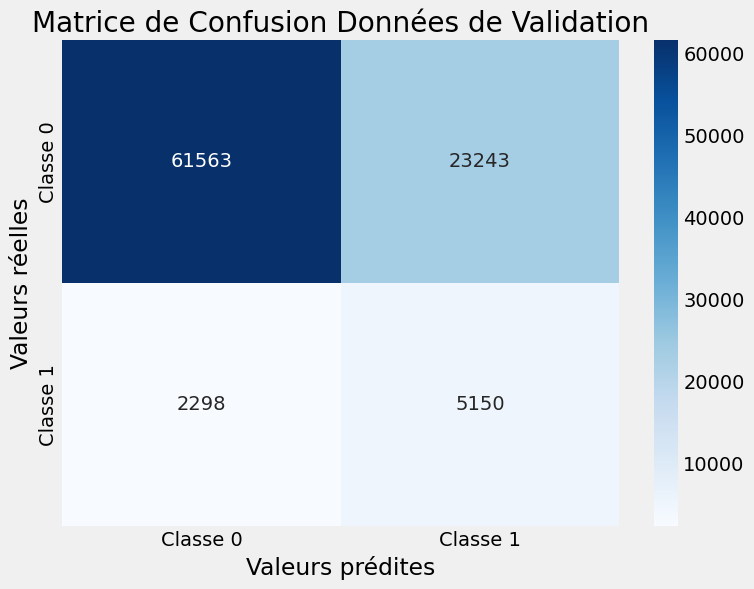

In [237]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat,
            annot=True,
            cmap='Blues',
            fmt='d',
            xticklabels=['Classe 0', 'Classe 1'],
            yticklabels=['Classe 0', 'Classe 1'])
plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title(f'Matrice de Confusion Données de Validation')
plt.show()

## Recherche de seuil

In [238]:
yhat = best_lgbm.predict_proba(X_val_opti)
# keep probabilities for the positive outcome only
yhat = yhat[:, 1]

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8


In [239]:
# Testez différents seuils de probabilité
thresholds = np.arange(0.1, 1.0, 0.01)
best_threshold = None
best_score = float('inf')  # Initialisez le meilleur score avec une valeur élevée pour minimiser

for threshold in thresholds:
    # Convertissez les probabilités en prédictions binaires en fonction du seuil
    y_pred_threshold = (yhat > threshold).astype(int)

    # Calculez le score personnalisé pour ce seuil
    current_score = score_custom(y_val_opti, y_pred_threshold)

    # Mettez à jour le meilleur seuil si le score actuel est meilleur
    if current_score < best_score:
        best_score = current_score
        best_threshold = threshold

print(f"Meilleur seuil : {best_threshold}")
print(f"Meilleur score : {best_score}")

Meilleur seuil : 0.5299999999999998
Meilleur score : 46079000


## Sauvegarde du modèle final
### Entrainement avec toutes les données

In [243]:
params_final = {
    'bagging_fraction': 0.8,
    'max_depth': 5,
    'min_data_in_leaf': 20,
    'n_estimators': 150,
    'num_leaves': 20,
    "scale_pos_weight": weight,
    "objective": "binary"
}

In [244]:
scaler_final = MinMaxScaler()

lgbm_final = LGBMClassifier(**params_final)

pipeline_final = make_pipeline(scaler_final, lgbm_final)

In [245]:
pipeline_final.fit(X_lgbm_opti, y_lgbm_opti)

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.405428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35988
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 516
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432486
[LightGBM] [Info] Start training from score -2.432486
[LightGBM] [Warning] No 

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('lgbmclassifier',
                 LGBMClassifier(bagging_fraction=0.8, max_depth=5,
                                min_data_in_leaf=20, n_estimators=150,
                                num_leaves=20, objective='binary',
                                scale_pos_weight=11.39))])

### Création du projet MLflow

In [246]:
client = MlflowClient()

In [ ]:
# Provide an Experiment description that will appear in the UI
experiment_description = (
    "This is the Home Credit Defaul Risk LightGBM Classification. "
    "This project contains the rechearch of parameters for the model of LGBMClassifier from LightGBM."
)

# Provide searchable tags that define characteristics of the Runs that
# will be in this Experiment
experiment_tags = {
    "project_name": "Projet 7 LGBMC Final",
    "model": "LGBMClassifier",
    "mlflow.note.content": experiment_description,
}

# Create the Experiment, providing a unique name
log_experiment = client.create_experiment(name="Projet 7 LGBMC Final",
                                          tags=experiment_tags)

In [247]:
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

In [248]:
mlflow.set_experiment("Projet 7 LGBMC Final")

<Experiment: artifact_location='mlflow-artifacts:/826787118746413626', creation_time=1704738915750, experiment_id='826787118746413626', last_update_time=1704738915750, lifecycle_stage='active', name='Projet 7 LGBMC Final', tags={'mlflow.note.content': 'This is the Home Credit Defaul Risk LightGBM '
                        'Classification. This project contains the rechearch '
                        'of parameters for the model of LGBMClassifier from '
                        'LightGBM.',
 'model': 'LGBMClassifier',
 'project_name': 'Projet 7 LGBMC Final'}>

In [249]:
with mlflow.start_run():

    
    mlflow.log_metric("Threshold optimal", best_threshold)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info",
                   "Final LGBM model for Home Credit Default Risk ")

    # Infer the model signature
    signature = infer_signature(X_lgbm_opti, best_lgbm.predict(X_lgbm_opti))

    model_path = "Projet7/Models/LGBM/Final"

    # Log the model
    model_info = mlflow.lightgbm.log_model(
        lgb_model=pipeline_final,
        artifact_path=model_path,
        signature=signature,
        registered_model_name="Projet 7 LGBM Final")

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8


Registered model 'Projet 7 LGBM Final' already exists. Creating a new version of this model...
2024/01/15 11:53:29 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Projet 7 LGBM Final, version 5
Created version '5' of model 'Projet 7 LGBM Final'.


# Feature Importance

## Réentrainement du meilleur modèle

In [250]:
params_expl = {
    'bagging_fraction': 0.8,
    'max_depth': 5,
    'min_data_in_leaf': 20,
    'n_estimators': 150,
    'num_leaves': 20,
    "scale_pos_weight": weight,
    "objective": "binary"
}

In [251]:
lgbm_expl = LGBMClassifier(**params_expl)

scaler_lgbm_expl = MinMaxScaler()

pipeline_expl = make_pipeline(scaler_lgbm_opti, lgbm_opti)

In [252]:
pipeline_expl.fit(X_train_opti, y_train_opti)

[LightGBM] [Info] Number of positive: 17377, number of negative: 197880
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.294332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35898
[LightGBM] [Info] Number of data points in the train set: 215257, number of used features: 513
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080727 -> initscore=-2.432513
[LightGBM] [Info] Start training from score -2.432513


Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('lgbmclassifier',
                 LGBMClassifier(objective='binary', scale_pos_weight=11.39))])

## Récupération du Classifier et Scaling des données

In [253]:
lgbm_expl = pipeline_expl["lgbmclassifier"]
scaler_expl = pipeline_expl["minmaxscaler"]

In [254]:
X_train_expl = scaler_expl.transform(X_train_opti)
X_val_expl = scaler_expl.transform(X_val_opti)

## Création de l'Explainer

In [255]:
shap.initjs()

In [256]:
lgbm_explainer = shap.TreeExplainer(lgbm_expl, X_train_expl)

## Récupération des Features

In [257]:
feature_names = list(X_train_opti.columns)

## Récupération des échantillons à étudier et des Shap Values

In [258]:
samples_0 = y_val_opti[y_val_opti == 0].reset_index(drop=True).sample(
    n=10, random_state=42).index

samples_1 = y_val_opti[y_val_opti == 1].reset_index(drop=True).sample(
    n=10, random_state=42).index

samples = np.concatenate([samples_0, samples_1])

print(f"Nombre de samples : {len(samples)}")

Nombre de samples : 20


In [259]:
shap_values = lgbm_explainer.shap_values(X_val_expl, check_additivity=False)

100%|===================| 92231/92254 [06:20<00:00]        

## Explication sur toutes les données

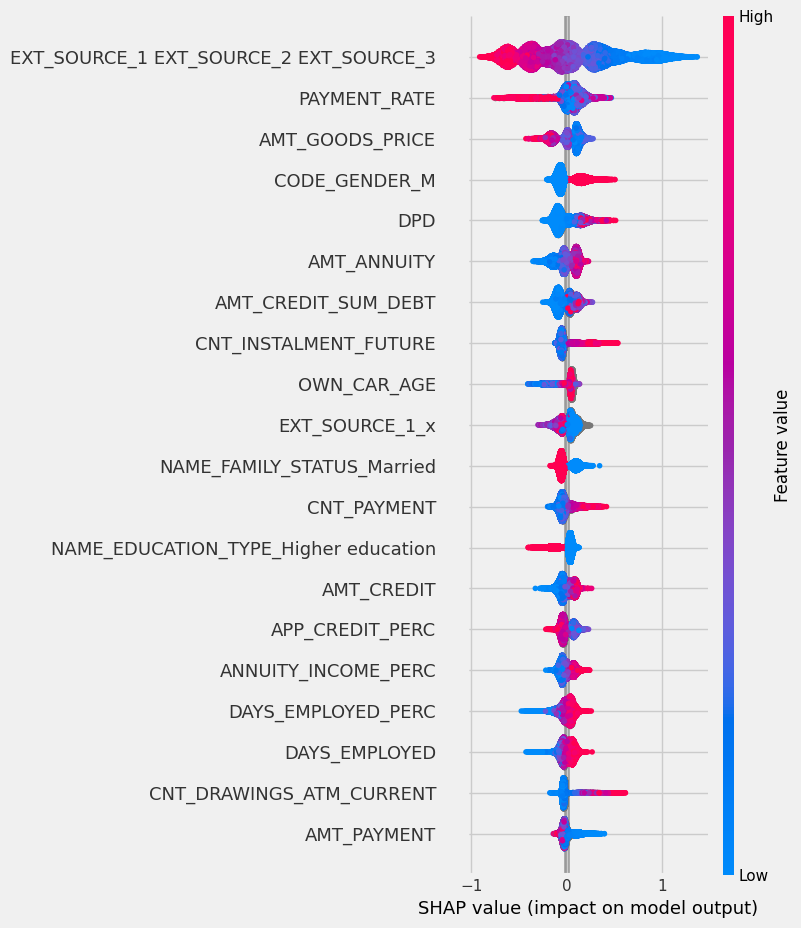

In [260]:
shap.summary_plot(shap_values,
                  features = X_val_expl,
                  feature_names=feature_names)

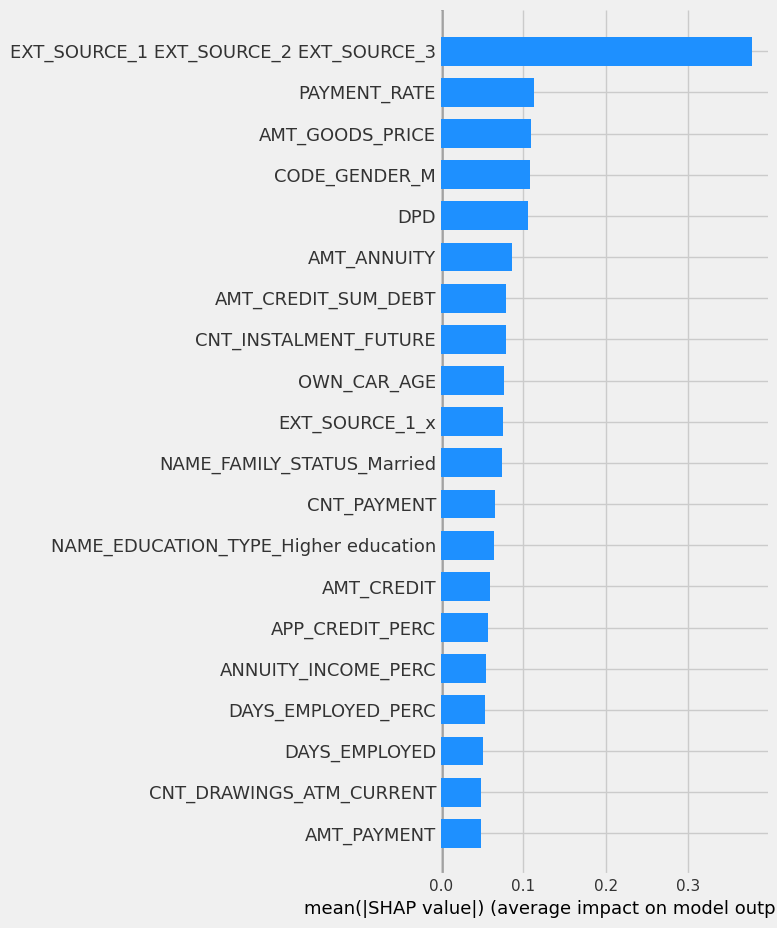

In [261]:
shap.summary_plot(shap_values,
                  feature_names=feature_names,
                  plot_type="bar",
                  color="dodgerblue"
                  )

## Affichage des features par échantillon

In [262]:
nb_features_display = 20

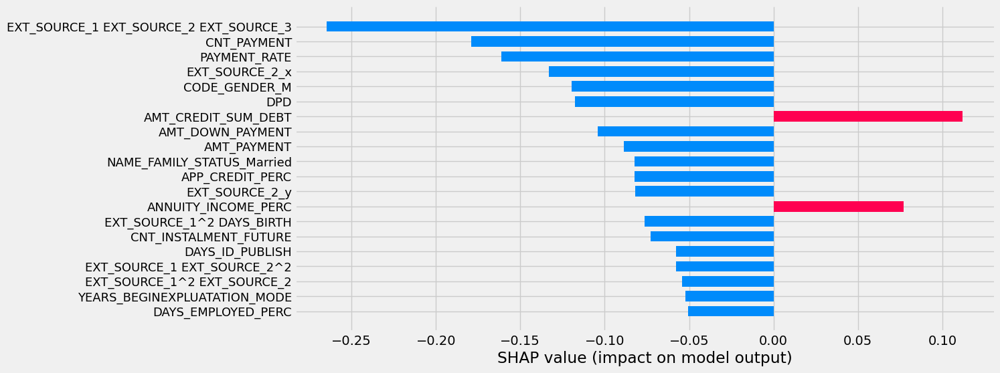

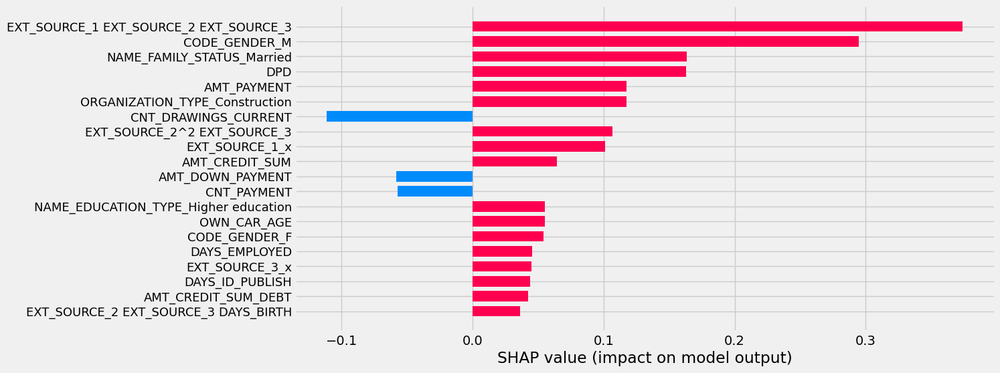

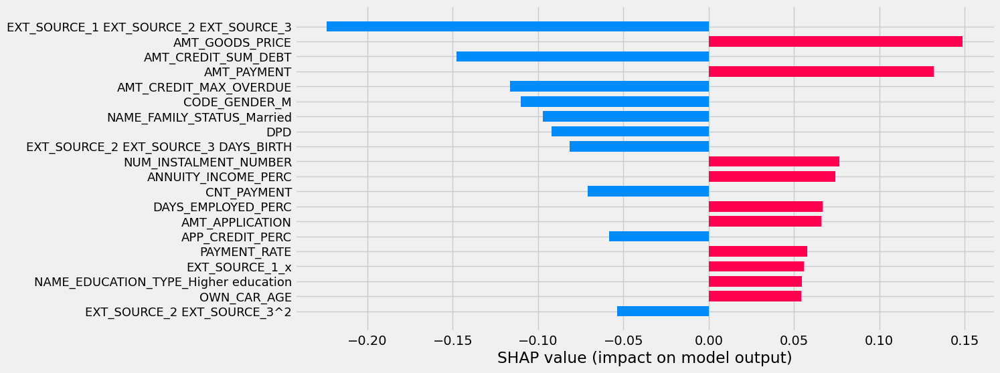

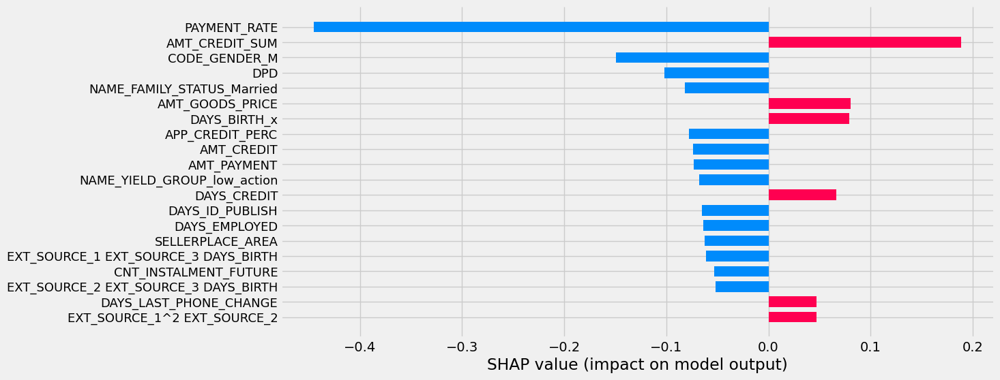

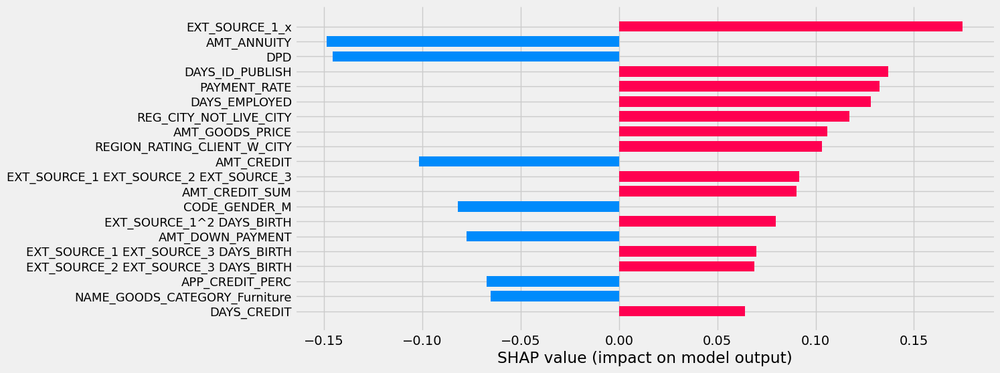

...

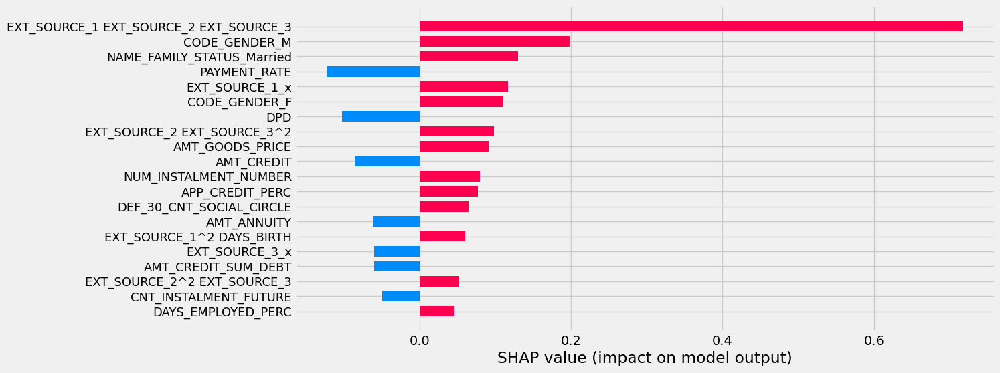

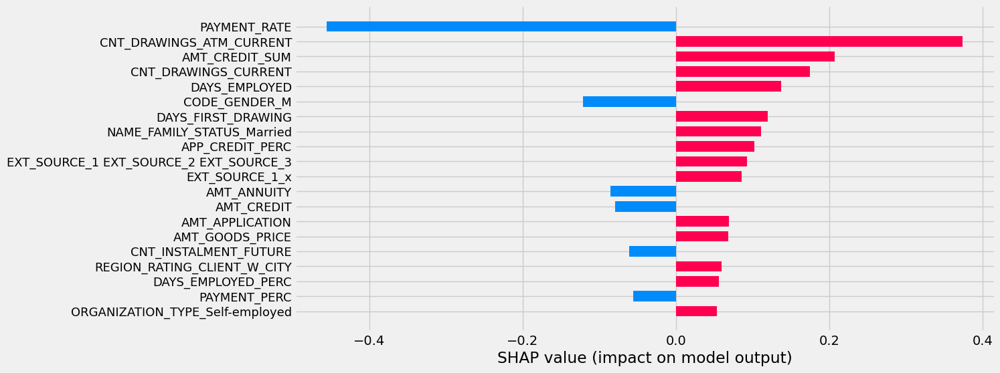

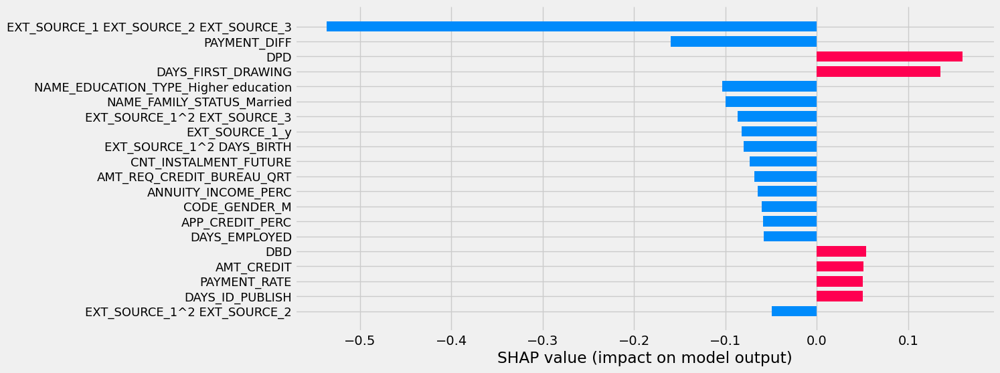

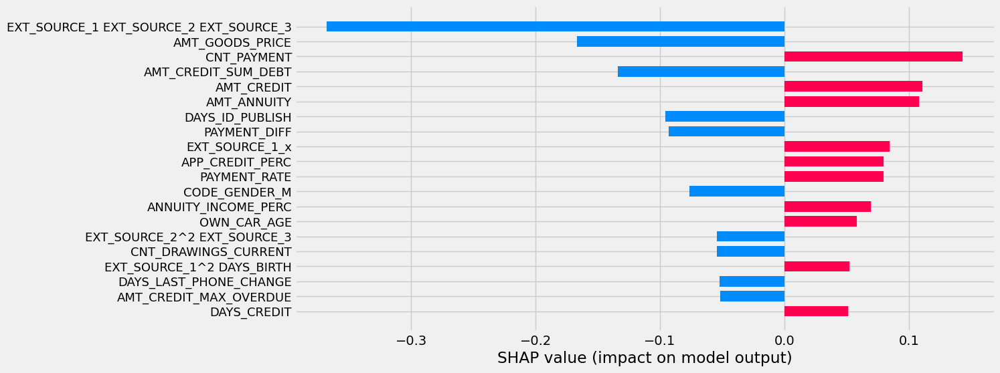

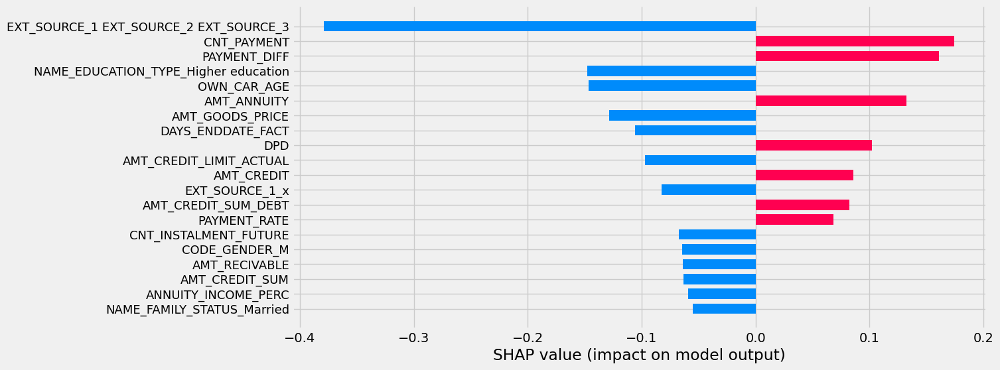

In [263]:
for sample in samples:

    X_sample = X_val_expl[sample]

    plt.figure(figsize=(12, 6))
    shap.bar_plot(lgbm_explainer.shap_values(X_sample.reshape(1, -1),
                                             check_additivity=False)[0],
                  feature_names=feature_names,
                  max_display=nb_features_display)
    plt.show()

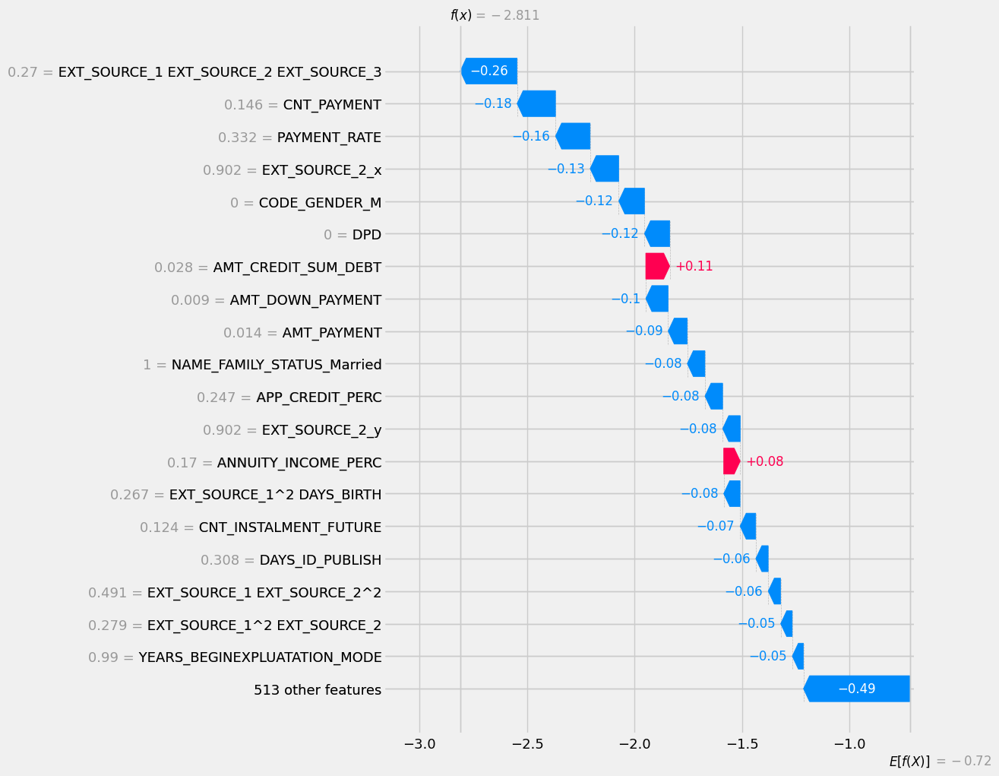

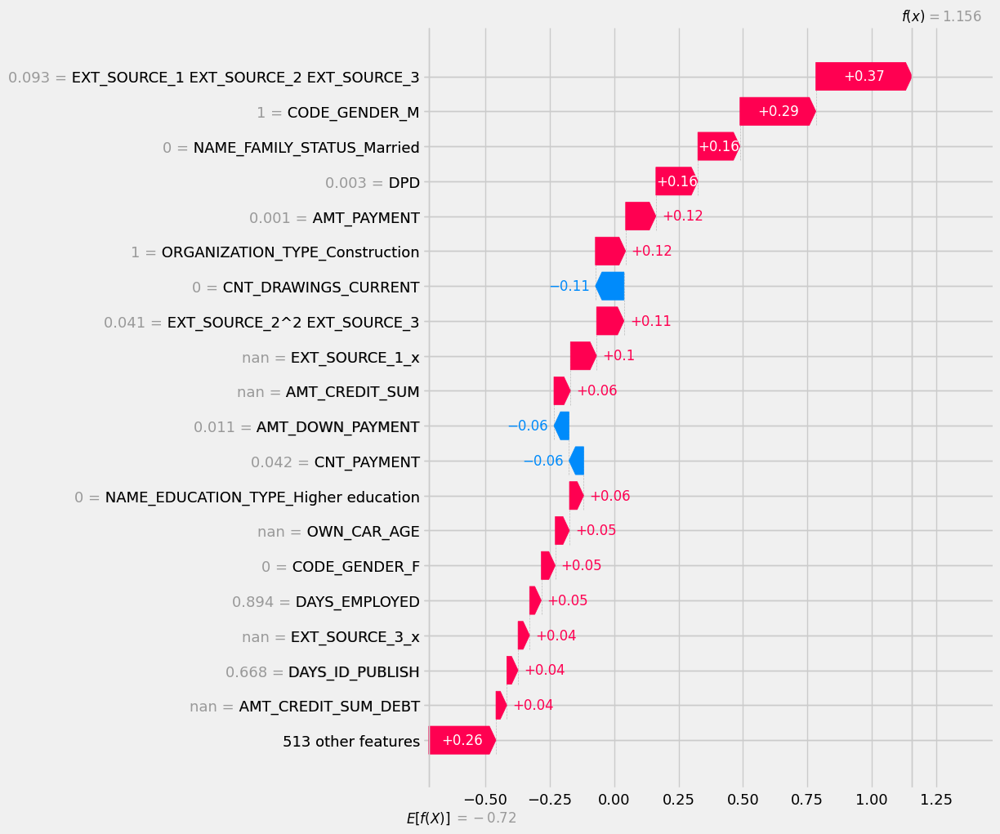

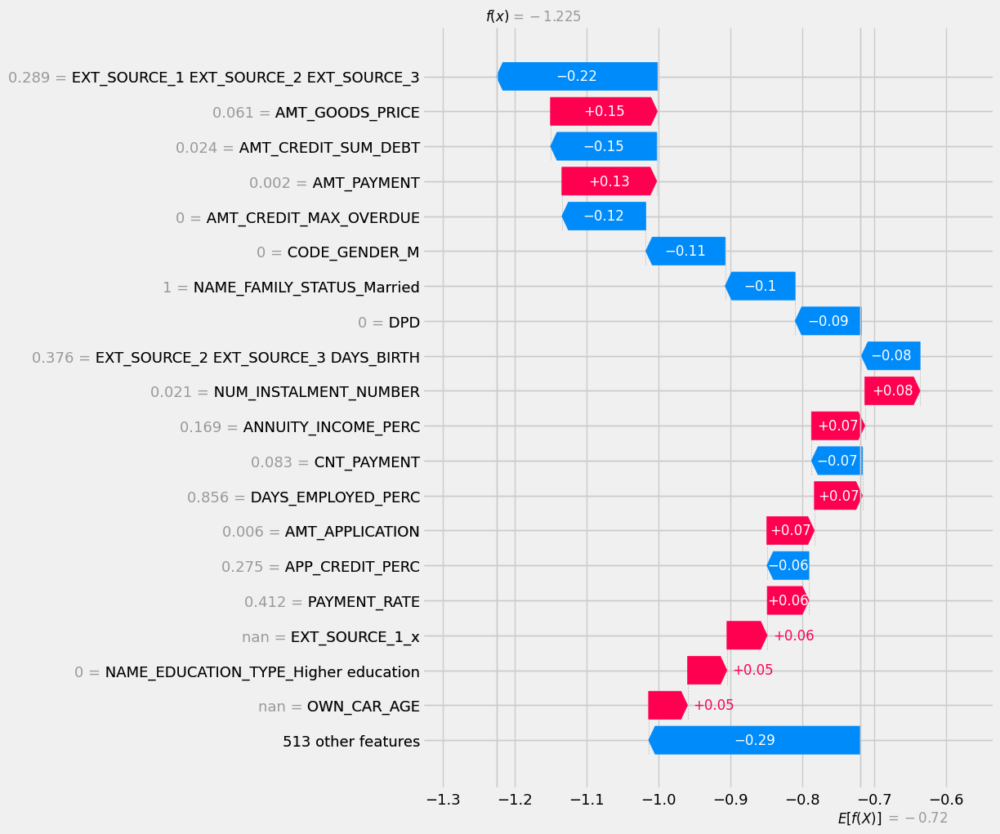

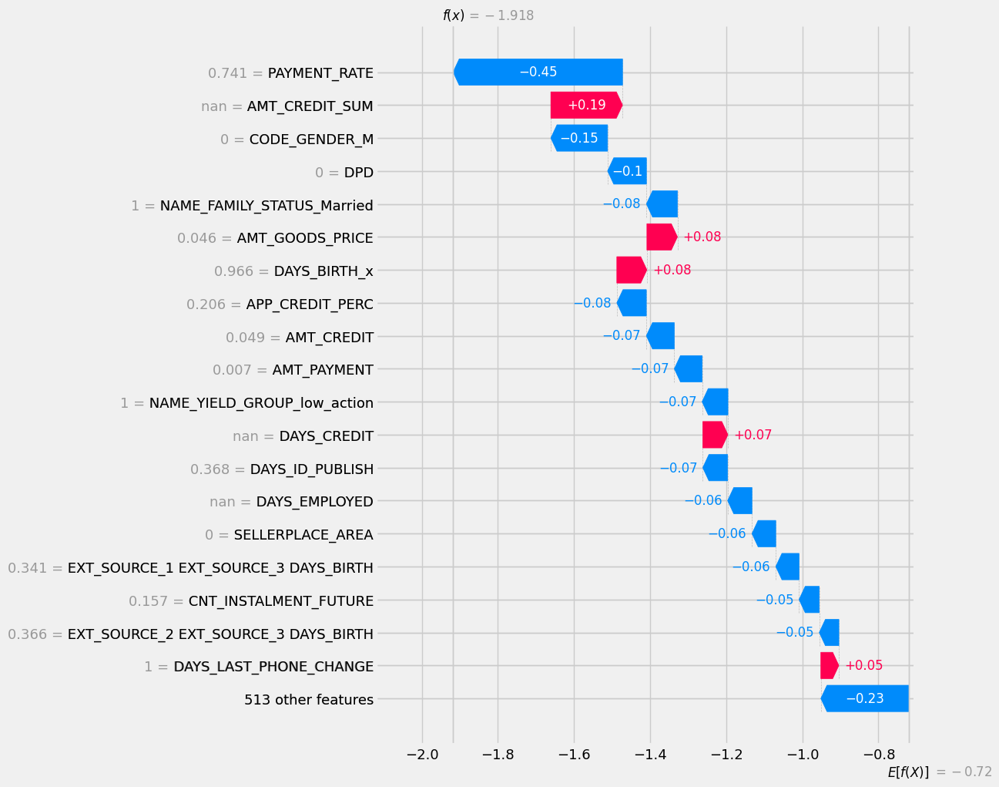

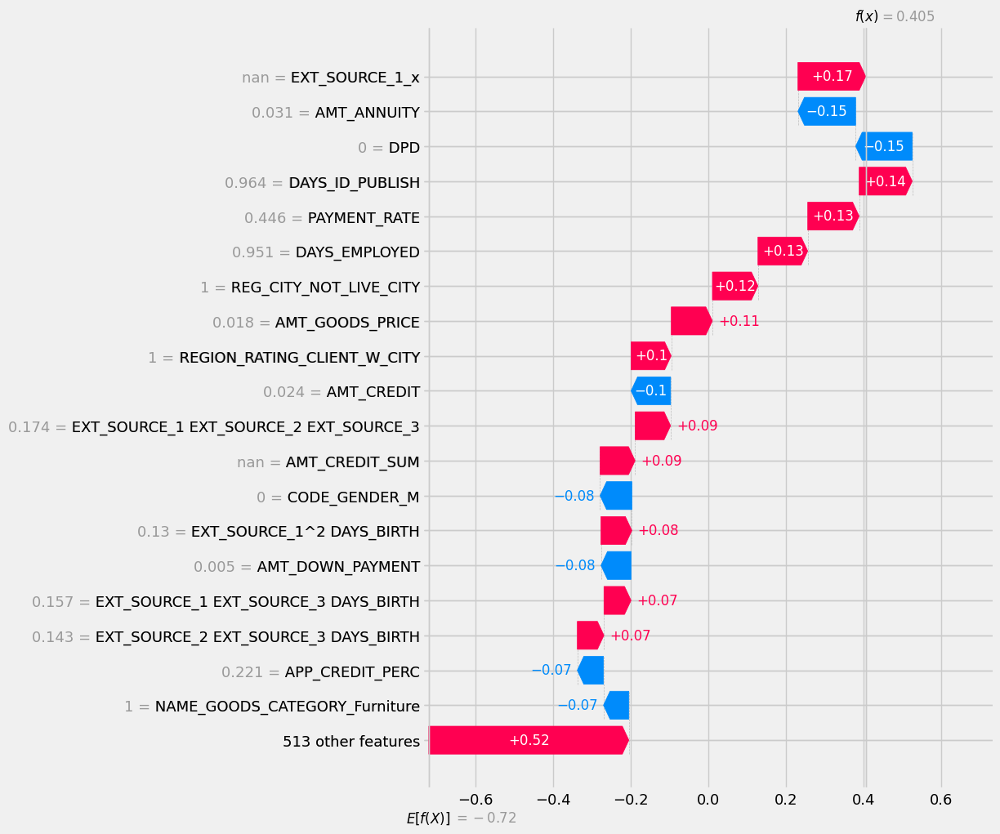

...

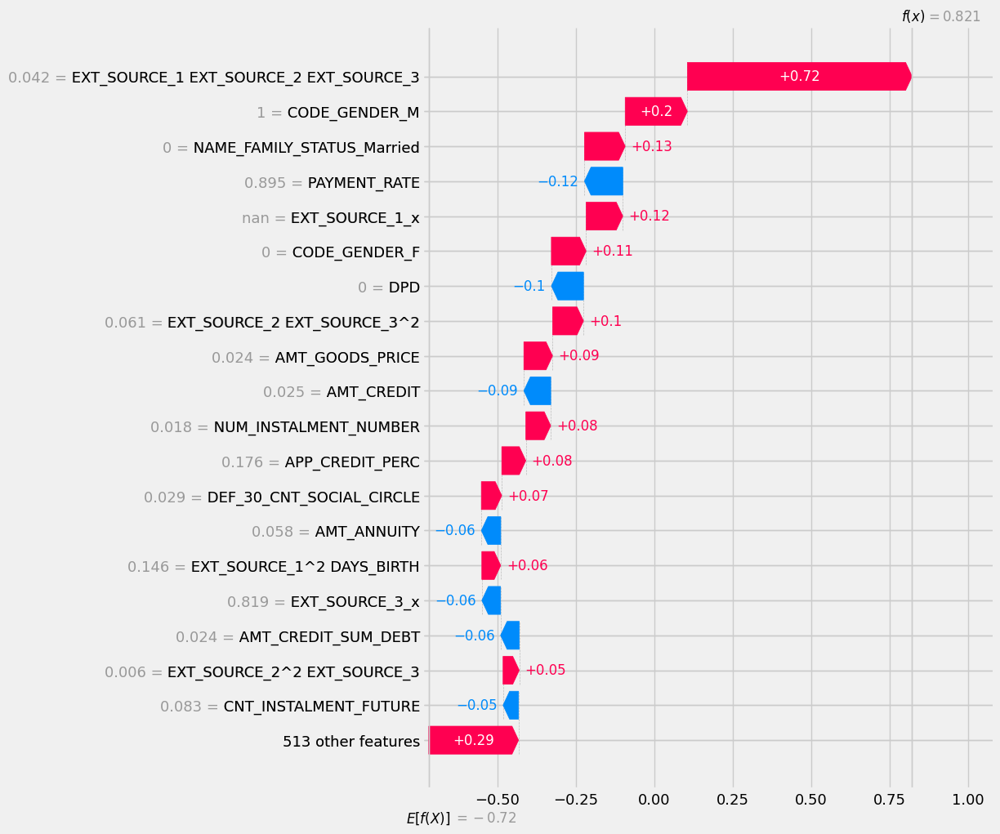

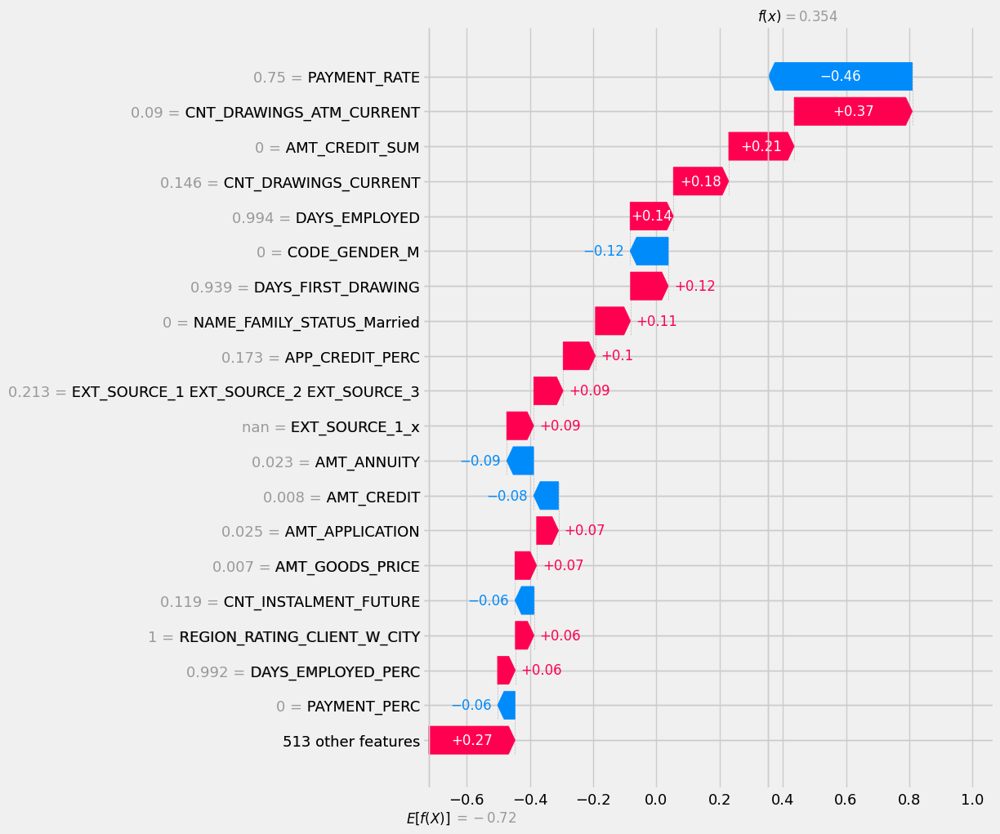

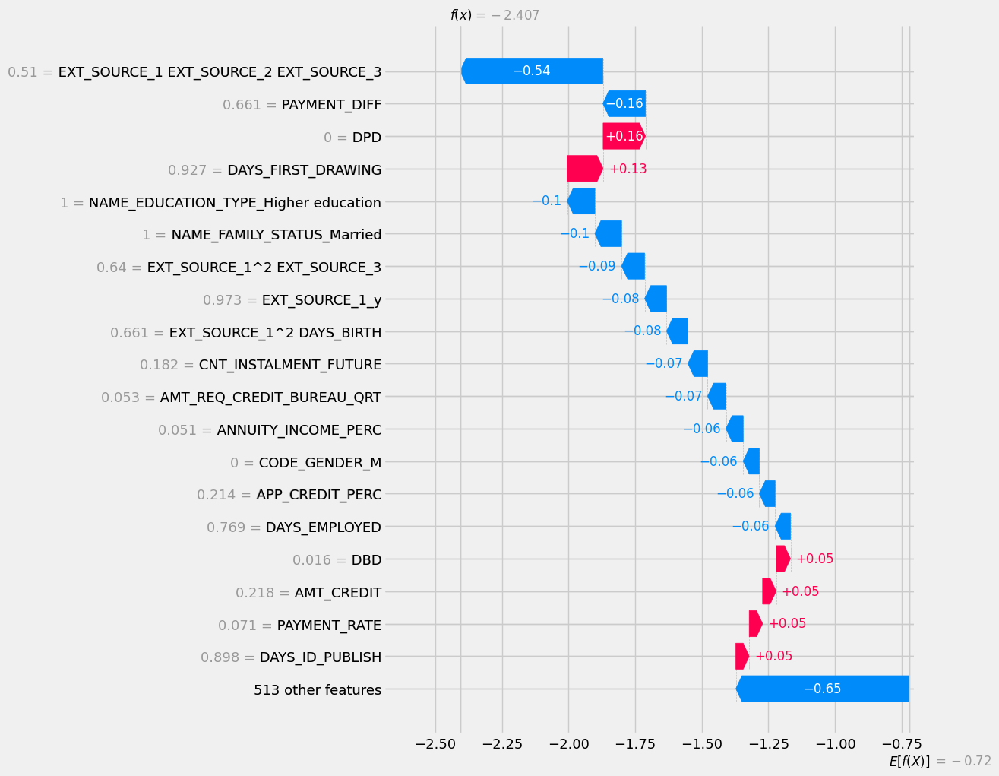

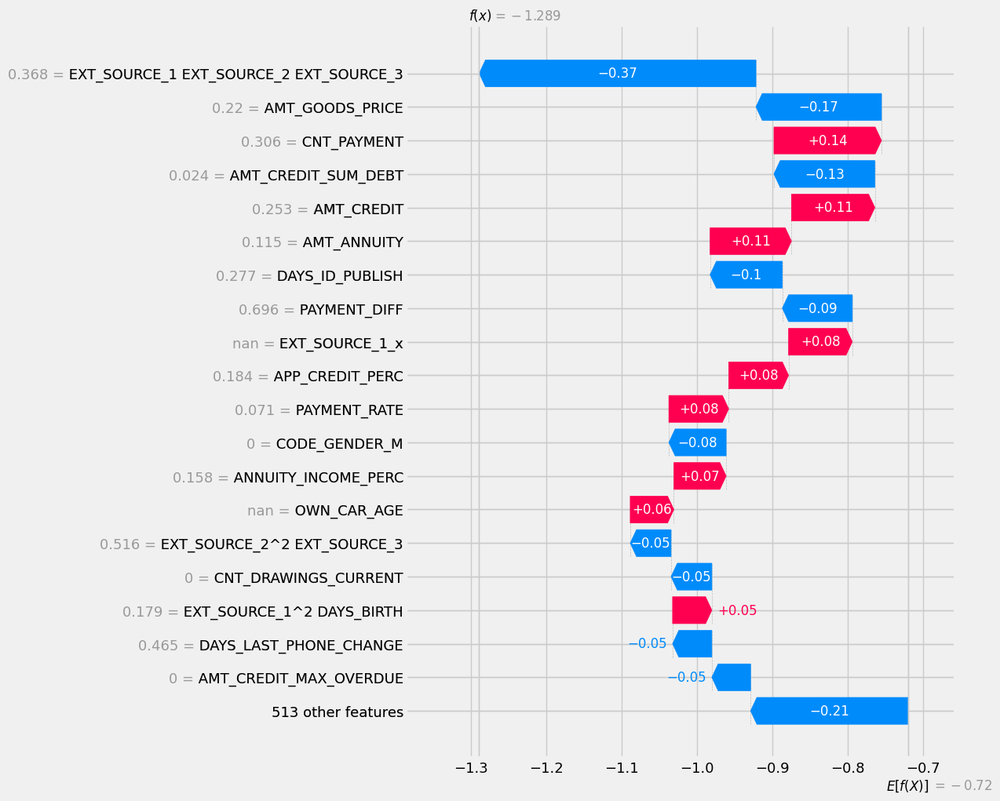

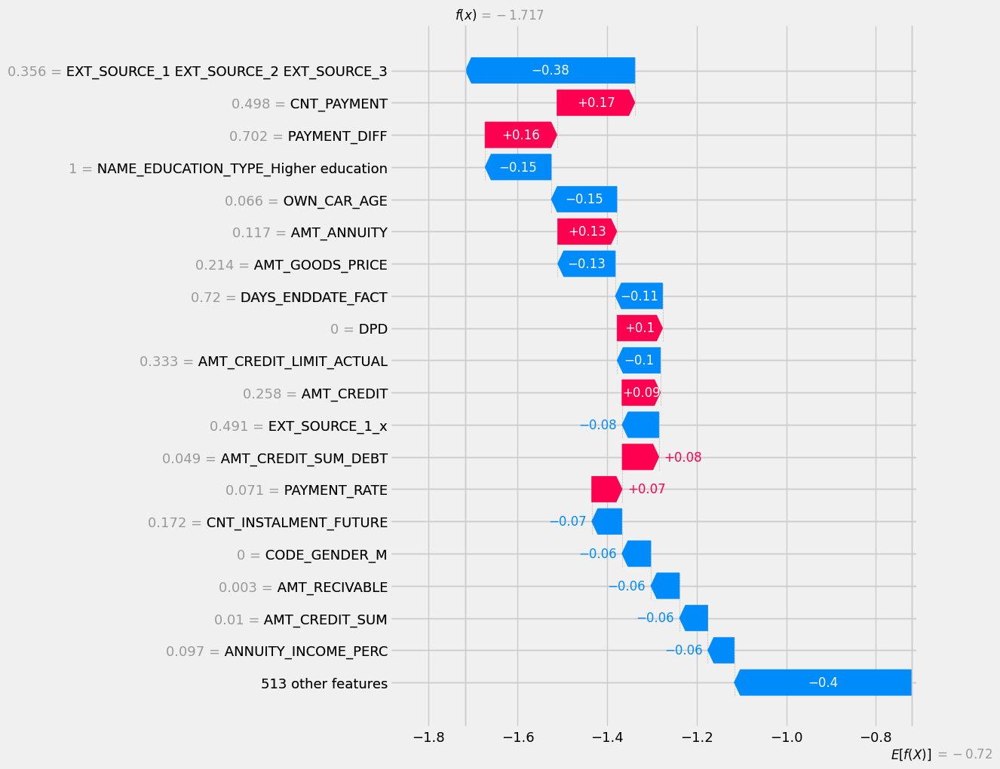

In [264]:
for sample in samples:

    X_sample = X_val_expl[sample]

    values_shap = lgbm_explainer(X_sample.reshape(1, -1),
                                 check_additivity=False)
    values_shap.feature_names = feature_names

    plt.figure(figsize=(12, 6))
    shap.waterfall_plot(values_shap[0], max_display=nb_features_display)
    plt.show()

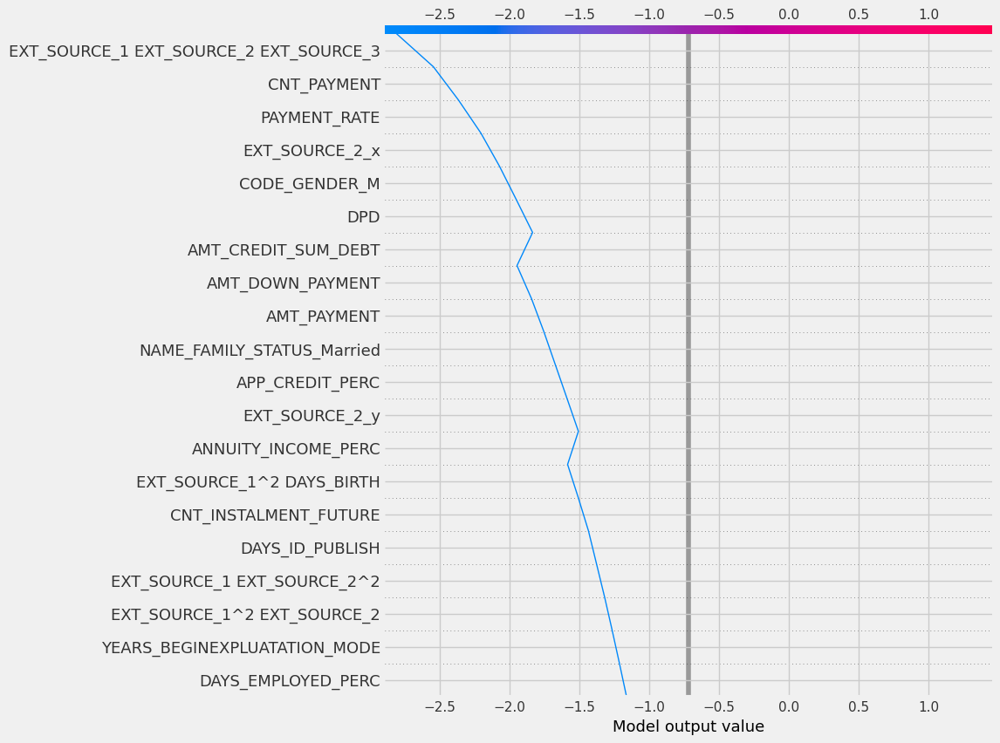

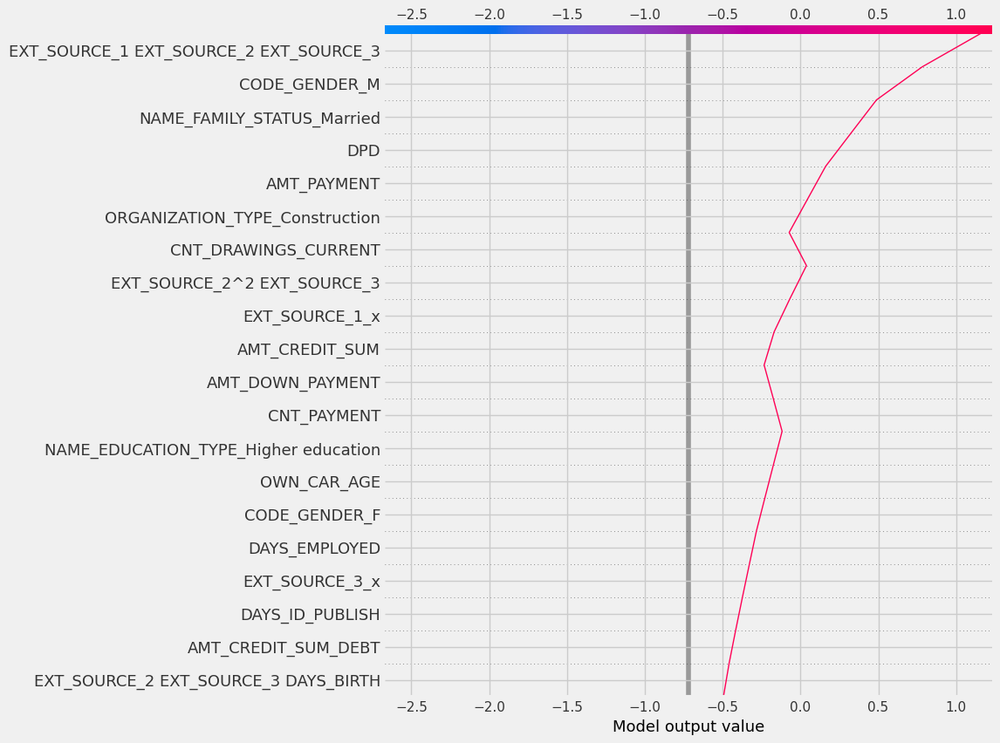

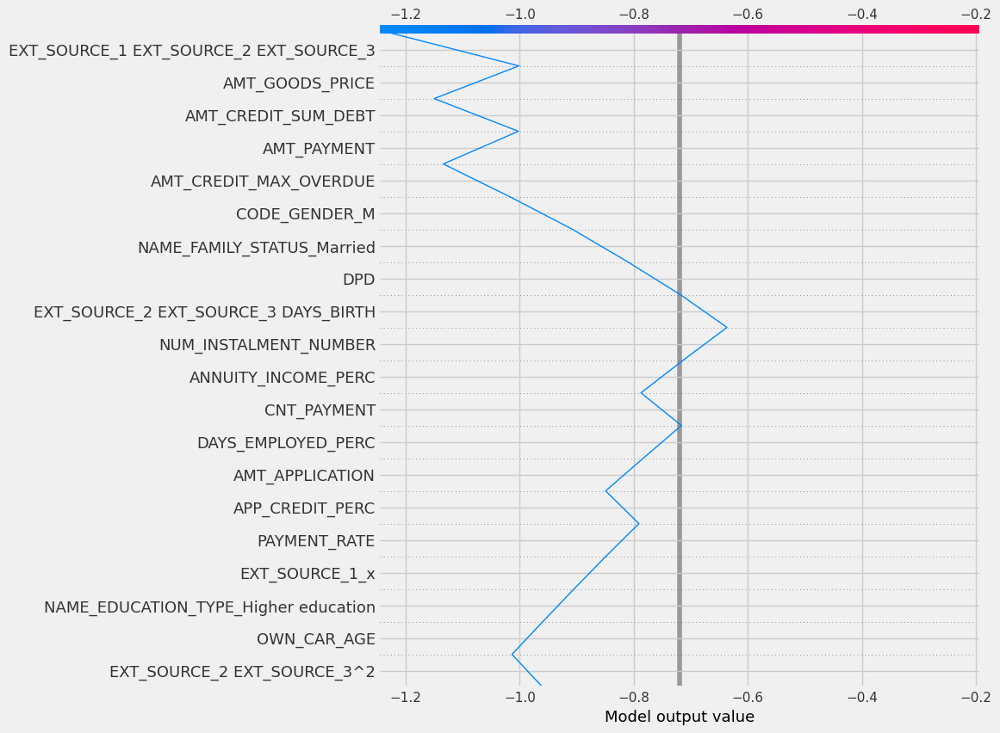

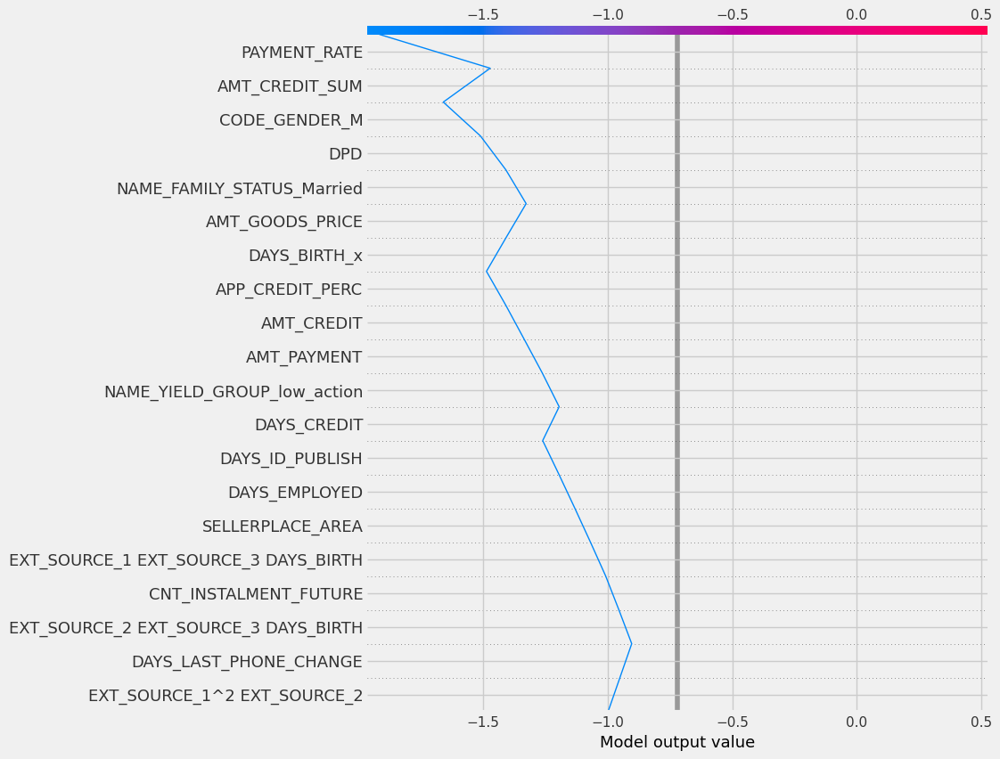

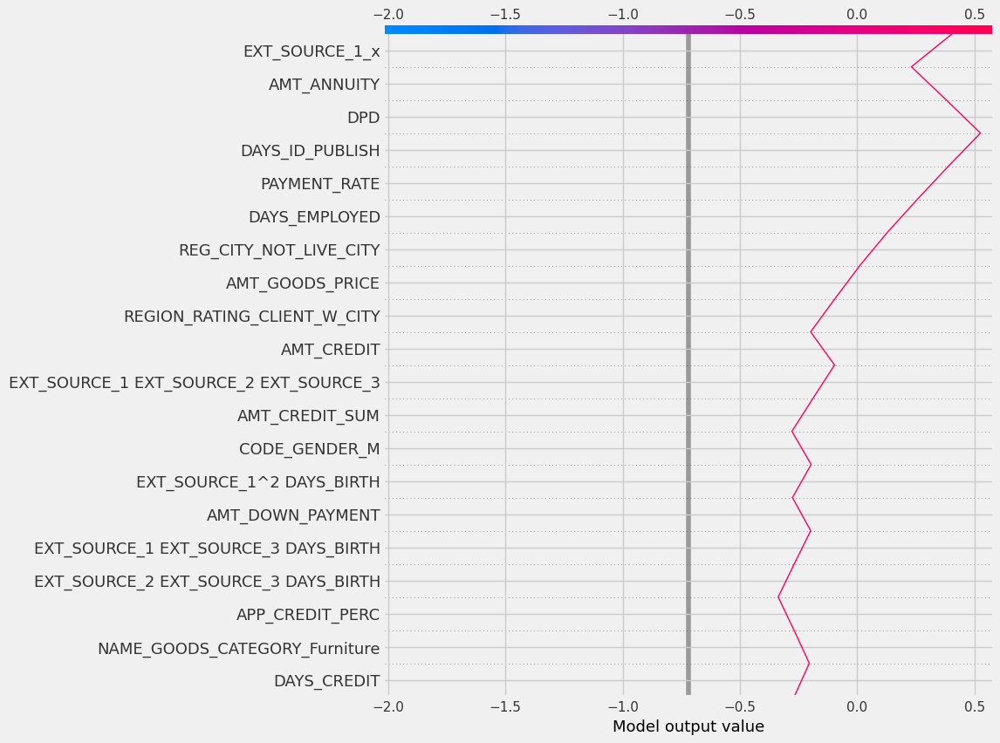

...

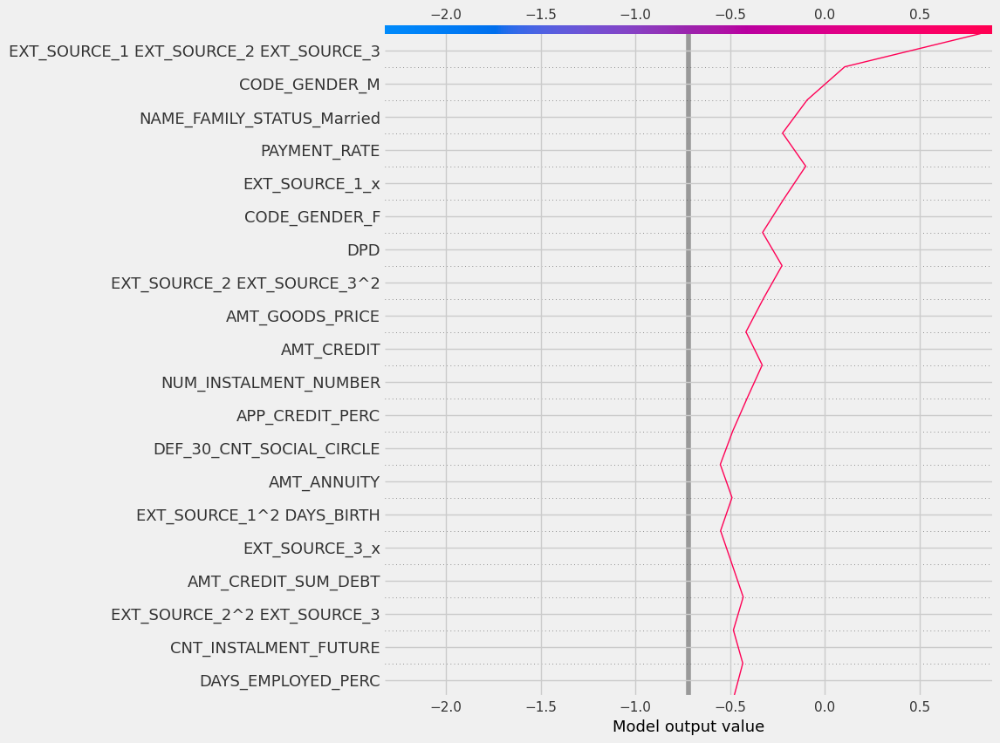

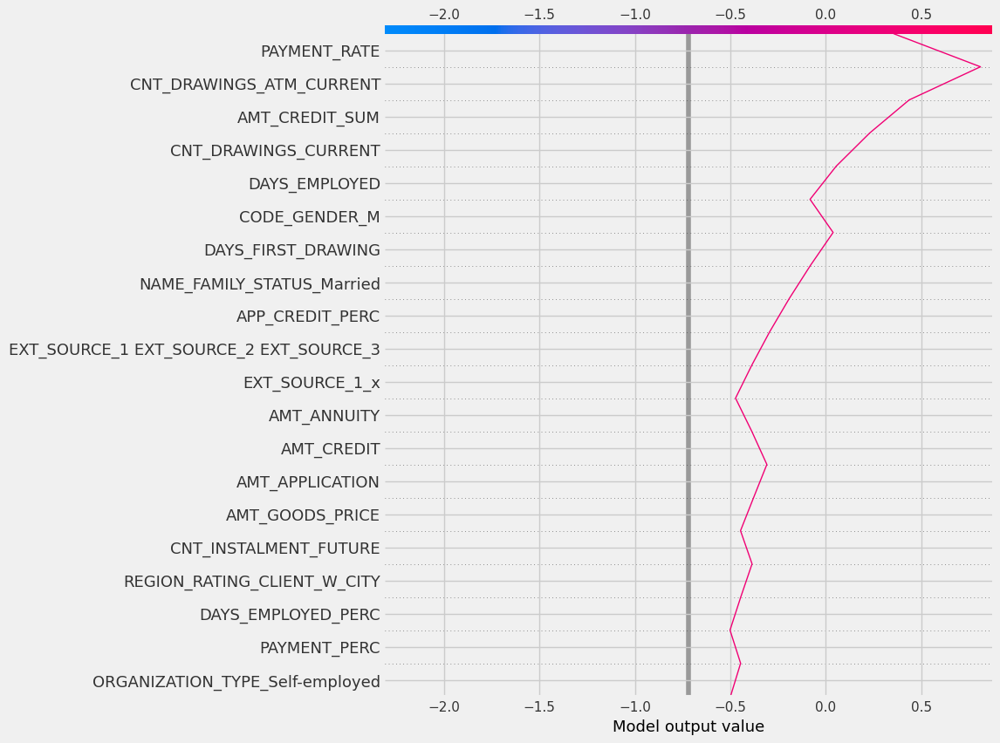

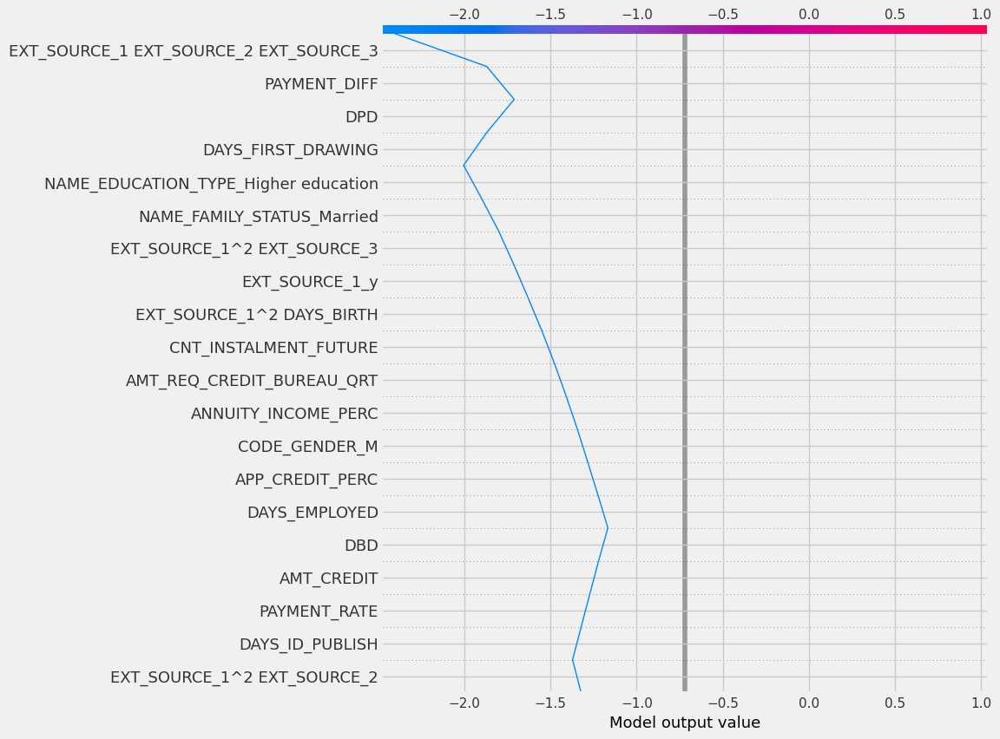

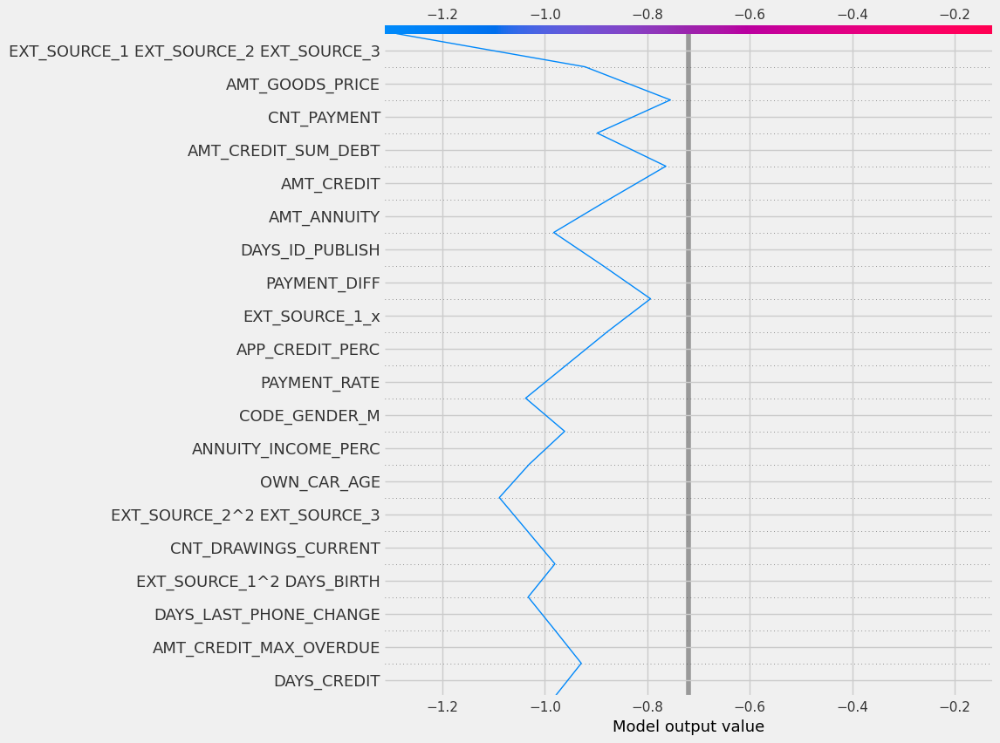

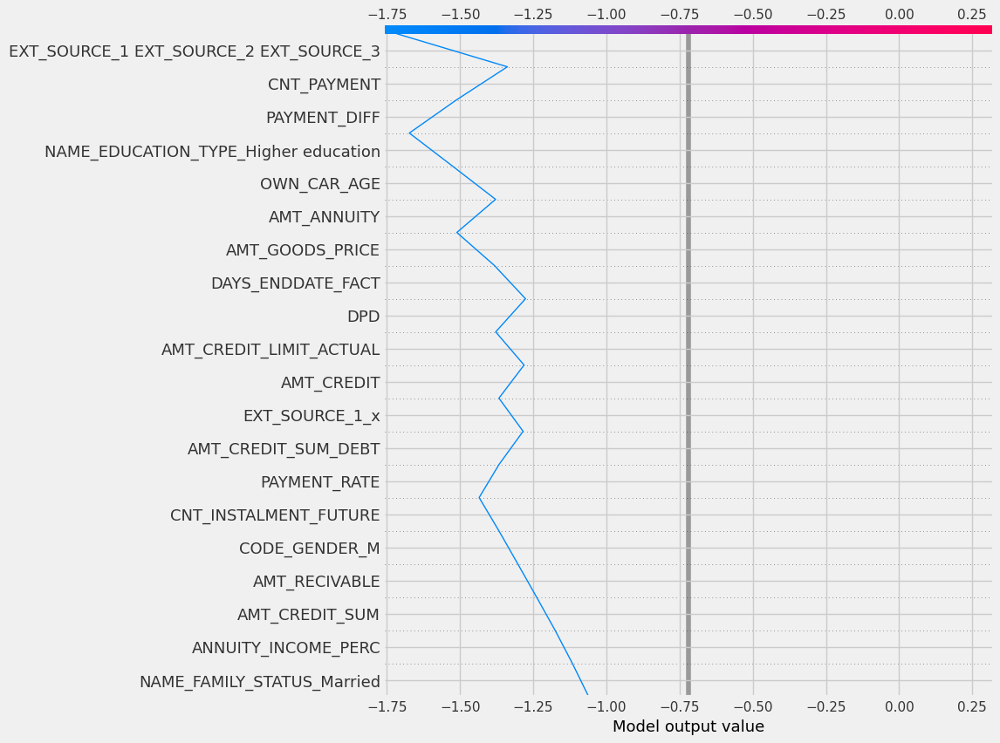

In [265]:
for sample in samples:

    X_sample = X_val_expl[sample]

    plt.figure(figsize=(12, 6))

    shap.decision_plot(lgbm_explainer.expected_value,
                       lgbm_explainer.shap_values(X_sample.reshape(1, -1),
                                                  check_additivity=False),
                       feature_names=feature_names)
    plt.show()